# Fitting COSMOS-HSC (UDeep) Data with MultiProFit

This notebook plots results from fitting sources from the Hyper-Suprime Cam (HSC) Subaru Strategic Program (SSP, https://hsc-release.mtk.nao.ac.jp/doc/) UltraDeep grizy imaging of the COSMOS field (http://cosmos.astro.caltech.edu/) using MultiProFit (https://github.com/lsst-dm/multiprofit, 'MPF'). Specifically, it reads the results of using a Task to fit exposures given an existing catalog with fits from meas_modelfit (https://github.com/lsst/meas_modelfit, 'MMF'), which implements a variant of the SDSS CModel algorithm. In additional to CModel, MultiProFit allows for multi-band fitting, as well as fitting of Sersic profiles, multi-Gaussian approximations thereof ('MG' Sersic), and non-parametric radial profiles (Gaussian mixtures model with shared ellipse parameters, effectively having a Gaussian mixture radial profile). Thus, the main results are comparisons of the two codes doing basically the same thing (single-band exponential, de Vaucouleurs, and CModel linear combination fits), followed by plots highlighting Sersic vs CModel fits, MultiProFit's multi-band performance, and finally comparisons to fits from Hubble Space Telescope (HST) images in the F814W band, which covers a similar wavelength range to the i+z filters.

In [1]:
# Import required packages
from astropy.table import vstack
from astropy.visualization import make_lupton_rgb
from lsst.geom import degrees, Point2D
import glob
from lsst.afw.table import SourceCatalog
from lsst.daf.persistence import Butler
from modelling_research.make_cutout import get_exposure_cutout_HST, get_exposures_HST_COSMOS, get_tiles_overlapping_HST, get_tiles_HST_COSMOS
from modelling_research.plotting import plotjoint_running_percentiles
from multiprofit.gaussutils import sigma_to_reff
from multiprofit.utils import flux_to_mag, mag_to_flux
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from timeit import default_timer as timer

In [2]:
# Setup for plotting
%matplotlib inline
sns.set_style('darkgrid')
mpl.rcParams['figure.dpi'] = 160
mpl.rcParams['image.origin'] = 'lower'
sns.set(rc={'axes.facecolor': '0.85', 'figure.facecolor': 'w'})

argspj = dict(
    percentiles = [5, 16, 50, 84, 95],
    percentilecolours = [(0.4, 0.6, 0.9), (0.3, 0.45, 0.6), (0.3, 0.3, 0.3), (0.3, 0.45, 0.6), (0.4, 0.6, 0.9)],
    scatterleft=True,
    scatterright=True,
)

In [3]:
# Read catalogs
def readAsAstropy(file, time=True):
    if time:
        t_begin = timer()
        print(f'Loading file {file}')
    table = SourceCatalog.readFits(file).asAstropy()
    if time:
        print(f'Loaded file {file} in {timer() - t_begin:.2f}s')
    return table

postfix_cat = "_mag.fits"
path_proj = "/project/dtaranu/cosmos/hsc/"
cats = {}
for bands in ['i', 'griz', 'iz']:
    path = f"{path_proj}2019-11-[0-3][0-3]/hsc_{bands}/mpf_9813_[0-9],[0-9]_{bands}_mag.fits"
    files = np.sort(glob.glob(path))
    tables = []
    if bands == 'iz':
        patches = []
        patch_rows = []
        rows = 0
    for file in files:
        table = readAsAstropy(file)
        tables.append(table)
        if bands == 'iz':
            rows += len(table)
            patch_rows.append(rows)
            patches.append(file.split('/')[-1].split('_')[2])
    cats[bands] = vstack(tables)
cats['f814w'] = vstack([readAsAstropy(f'{path_proj}/2019-11-12/hst_iso/mpf_9813_{x}_F814W_iso.fits') for x in patches])

Loading file /project/dtaranu/cosmos/hsc/2019-11-12/hsc_i/mpf_9813_4,4_i_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2019-11-12/hsc_i/mpf_9813_4,4_i_mag.fits in 3.09s
Loading file /project/dtaranu/cosmos/hsc/2019-11-12/hsc_griz/mpf_9813_4,4_griz_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2019-11-12/hsc_griz/mpf_9813_4,4_griz_mag.fits in 7.02s
Loading file /project/dtaranu/cosmos/hsc/2019-11-01/hsc_iz/mpf_9813_2,3_iz_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2019-11-01/hsc_iz/mpf_9813_2,3_iz_mag.fits in 3.69s
Loading file /project/dtaranu/cosmos/hsc/2019-11-01/hsc_iz/mpf_9813_2,4_iz_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2019-11-01/hsc_iz/mpf_9813_2,4_iz_mag.fits in 5.76s
Loading file /project/dtaranu/cosmos/hsc/2019-11-01/hsc_iz/mpf_9813_2,5_iz_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2019-11-01/hsc_iz/mpf_9813_2,5_iz_mag.fits in 3.29s
Loading file /project/dtaranu/cosmos/hsc/2019-11-01/hsc_iz/mpf_9813_3,2_iz_mag.fits
Loaded file /project/dtaranu/cos

Loaded file /project/dtaranu/cosmos/hsc//2019-11-12/hst_iso/mpf_9813_3,6_F814W_iso.fits in 3.29s
Loading file /project/dtaranu/cosmos/hsc//2019-11-12/hst_iso/mpf_9813_4,2_F814W_iso.fits
Loaded file /project/dtaranu/cosmos/hsc//2019-11-12/hst_iso/mpf_9813_4,2_F814W_iso.fits in 2.96s
Loading file /project/dtaranu/cosmos/hsc//2019-11-12/hst_iso/mpf_9813_4,3_F814W_iso.fits
Loaded file /project/dtaranu/cosmos/hsc//2019-11-12/hst_iso/mpf_9813_4,3_F814W_iso.fits in 3.22s
Loading file /project/dtaranu/cosmos/hsc//2019-11-12/hst_iso/mpf_9813_4,4_F814W_iso.fits
Loaded file /project/dtaranu/cosmos/hsc//2019-11-12/hst_iso/mpf_9813_4,4_F814W_iso.fits in 4.65s
Loading file /project/dtaranu/cosmos/hsc//2019-11-12/hst_iso/mpf_9813_4,5_F814W_iso.fits
Loaded file /project/dtaranu/cosmos/hsc//2019-11-12/hst_iso/mpf_9813_4,5_F814W_iso.fits in 3.25s
Loading file /project/dtaranu/cosmos/hsc//2019-11-12/hst_iso/mpf_9813_4,6_F814W_iso.fits
Loaded file /project/dtaranu/cosmos/hsc//2019-11-12/hst_iso/mpf_9813_4

In [4]:
# Setup models and familiar names for parameters
models = {
    "psf": {
        "mpf": ("multiprofit_psf_", 2),
        "mmf": ("modelfit_DoubleShapeletPsfApprox_", 2),
    },
    "gauss": {
        "mpf": ("multiprofit_gausspx_", 1),
    },
    "exp": {
        "mpf": ("multiprofit_mg8expgpx_", 1),
        "mmf": ("modelfit_CModel_exp_", 1),
    },
    "dev": {
        "mpf": ("multiprofit_mg8devepx_", 1),
        "mmf": ("modelfit_CModel_dev_", 1),
    },
    "cmodel": {
        "mpf": ("multiprofit_mg8cmodelpx_", 2),
        "mmf": ("modelfit_CModel_", 1),
    },
    "mg8serb": {
        "mpf": ("multiprofit_mg8serbpx_", 1),
    },
    "mg8serm": {
        "mpf": ("multiprofit_mg8sermpx_", 1),
    },
}

names = {
    "flux": {
        "mpf": "instFlux",
        "mpf-psf": None,
        "mmf": "instFlux",
        "mmf-psf": None,        
    },
    "flux_z": {
        "mpf": "HSC-Z_instFlux",
        "mpf-psf": None,
        "mmf": None,
        "mmf-psf": None,
    },
    "mag": {
        "mpf": "mag",
        "mpf-psf": None,
        "mmf": "mag",
        "mmf-psf": None,
    },
    "mag_z": {
        "mpf": "HSC-Z_mag",
        "mpf-psf": None,
        "mmf": "mag",
        "mmf-psf": None,
    },
    "cenx": {
        "mpf": "cenx",
    },
    "ceny": {
        "mpf": "ceny",
    },
    "sigma_x": {
        "mpf": "sigma_x",
        "mmf": "ellipse_xx",
        "mmf-psf": "xx",
    },
    "sigma_y": {
        "mpf": "sigma_y",
        "mmf": "ellipse_yy",
        "mmf-psf": "yy",
    },
    "rho": {
        "mpf": "rho",
        "mmf": "ellipse_xy",
        "mmf-psf": "xy",
    },
    "nser": {
        "mpf": "nser",
    },
    "loglike": {
        "mpf": "loglike",
        "mmf": "like",
    },
    "chisqred": {
        "mpf": "chisqred",
    }
}
names_extra = ["time"]
names_optional = ["nser", "loglike", "chisqred", "flux_z", "mag_z"]
names_base = ["base_PixelFlags_flag_saturatedCenter", "base_PixelFlags_flag_sensor_edgeCenter",
              "deblend_tooManyPeaks", "detect_isPatchInner", "modelfit_CModel_flag"]

In [5]:
# Parse the table and turn parameter value columns into dicts by useful keys
data = {}
joiner = "_"
log = False
sigma2reff = sigma_to_reff(1)
for bands, cat in cats.items():
    colnames_cat = cat.colnames
    datum_bands = {}
    is_hst = bands == "f814w"
    band_prefix = f'{"F814W" if is_hst else "HSC-I"}_'
    for name_model, algos in models.items():
        is_cmodel = name_model == "cmodel"
        is_psf = name_model == "psf"
        datum_model = {}
        for algo, (prefix, n_comps) in algos.items():
            is_mmf = algo == "mmf"
            is_mpf = algo == "mpf"
            if is_mpf and is_psf:
                prefix += band_prefix
            is_mmf_psf = is_mmf and is_psf
            datum = {}
            postfixes_out = [str(1 + x) for x in range(n_comps - is_psf)]
            postfixes_in = np.repeat("", len(postfixes_out)) if (n_comps == 1 and is_mmf) else \
                [f'{"c" if is_mpf else ""}{is_mpf + x}{joiner}' for x in range(n_comps - is_psf)]
            if is_cmodel:
                names_algo = {"loglike": names["loglike"]}
                if not is_hst:
                    names_algo["mag"] = names["mag"]
            else:
                names_algo = names
            for item, colnames in names_algo.items():
                is_optional = item in names_optional
                is_loglike = item == "loglike" or item == "chisqred"
                is_mmf_loglike = is_mmf and is_loglike
                colname_postfix = '-psf' if (is_psf and f'{algo}-psf' in colnames) else ''
                colname_in = f"{algo}{colname_postfix}"
                colname = colnames.get(colname_in)
                if colname is not None:
                    is_mag = item == "mag"
                    if item == "flux" or is_mag:
                        if is_mag and is_hst:
                            colname = None
                        elif is_mpf:
                            colname = f'{band_prefix}{colname}'
                if colname is not None:
                    if log:
                        print("item, colname, bands", item, colname, bands)
                    for postfix_in, postfix_out in zip([""] if is_loglike else postfixes_in, postfixes_out):
                        prefix_name = "multiprofit_measmodel_" if is_mmf_loglike else prefix
                        colname_full = f"{prefix_name}{postfix_in}{colname}" if is_mmf_psf else \
                            f'{prefix_name}{postfix_in if len(postfix_in) > 0 else ""}{colname}{(joiner + name_model) if is_mmf_loglike else ""}'
                        if log:
                            print(item, colname_in, colname, is_optional, colname_full,
                                  colname_full in colnames_cat, f"{item}{joiner}{postfix_out}")
                        if not is_optional or (colname_full in colnames_cat):
                            column = cat[colname_full]
                            is_sigma = item.startswith("sigma_")
                            if "item" == "mag" or is_sigma:
                                column = np.clip(column, 1e-2, np.Inf)
                            datum[f"{item}{joiner}{postfix_out}"] = column
            for colname in names_base:
                datum[colname] = cat[colname]
            for colname in names_extra:
                if not (colname == "time" and (is_mmf_psf or is_cmodel)):
                    datum[colname] = np.clip(cat[f"{prefix}{colname}"], -4, np.Inf)
            if log:
                print(algo, name_model, datum.keys(), postfixes_in, postfixes_out)
            if is_cmodel:
                if is_mmf:
                    datum["fracDev"] = cat[f"{prefix}fracDev"]
                elif not is_hst:
                    flux_dev = mag_to_flux(datum["mag_1"])
                    flux_exp = mag_to_flux(datum["mag_2"])
                    mag_c = flux_to_mag(flux_dev + flux_exp)
                    datum["fracDev"] = flux_dev/(flux_dev + flux_exp)
                    del datum["mag_2"]
                    datum["mag_1"] = mag_c
            else:
                expo = 2 - is_mmf
                for postfix in postfixes_out:
                    postfix = f"{joiner}{postfix}"
                    name_sigma_x = f"sigma_x{postfix}"
                    name_sigma_y = f"sigma_y{postfix}"
                    datum[f"reff{postfix}"] = sigma2reff*np.sqrt(0.5*(datum[name_sigma_x]**expo + datum[name_sigma_y]**expo))
                    if is_mmf:
                        name_rho = f"rho{postfix}"
                        datum[name_sigma_x] = np.sqrt(datum[name_sigma_x])
                        datum[name_sigma_y] = np.sqrt(datum[name_sigma_y])
                        datum[name_rho] = datum[name_rho]/(datum[name_sigma_x]*datum[name_sigma_y])
            good = cat["detect_isPatchInner"]
            for flag in [
                "base_PixelFlags_flag_saturatedCenter", "base_PixelFlags_flag_sensor_edgeCenter",
                "deblend_tooManyPeaks", "modelfit_CModel_flag"]:
                good = good & ~cat[flag]
            datum['good'] = good
            datum_model[algo] = datum
        datum_bands[name_model] = datum_model
    data[bands] = datum_bands

In [6]:
# Setup units and columns for plotting
units = {
    "time": "s",
    "mag": "mag",
    "reff": "pix",
}

columns_plot = {
    "loglike": dict(postfix="_1", difference=True, limx=(0, 6e3), limy=(-25, 25), crop_x=True),
    "time": dict(postfix="", log=True, ratio=True, limx=(-3., 0), limy=(-1.5, 2.5)),
    "mag": dict(postfix="_1", difference=True, limx=(16.5, 29), limy=(-0.4, 0.2)),
    "mag_bright": dict(postfix="_1", difference=True, limx=(16.5, 24), limy=(-0.15, 0.15),
                       crop_x=True, column="mag"),
}
columns_plot_size = columns_plot.copy()
columns_plot_size.update({
    "reff": dict(postfix="_1", log=True, ratio=True, limx=(-1, 2), limy=(-1, 1)),
    "mag_reff_mmf": dict(postfix="_1", log_y=True, ratio=False, limx=(16, 28), limy=(-1, 2),
                         column="mag", column_y="reff", datum_idx_y=0),
    "mag_reff_mpf": dict(postfix="_1", log_y=True, ratio=False, limx=(16, 28), limy=(-1, 2),
                         column="mag", column_y="reff", datum_idx_x=1),
})

In [7]:
# Define functions for plotting parameter values in dicts (not the original tables)
def get_columns_info(column_info, name_plot):
    name_column_x = column_info.get("column", name_plot)
    column_x = f"{name_column_x}{column_info.get('postfix','')}"
    datum_idx_x = column_info.get('datum_idx_x', 0)
    datum_idx_y = column_info.get('datum_idx_y', 1)
    name_column_y = column_info.get("column_y", name_column_x)
    column_y = column_x if name_column_y is name_column_x else \
        f"{name_column_y}{column_info.get('postfix','')}"
    return column_x, column_y, name_column_x, name_column_y, datum_idx_x, datum_idx_y


def plot_column_pair(
    x, y, cond, column_info, name_column_x, name_column_y,
    algo_x, algo_y, model, band, units=None, title=None
):
    if units is None:
        units = {}
    is_log = column_info.get('log', False)
    is_log_x = column_info.get('log_x', is_log)
    is_log_y = column_info.get('log_y', is_log)
    is_ratio = column_info.get('ratio', False)
    is_difference = column_info.get('difference', False)
    is_combo = is_ratio or is_difference
    crop_x = column_info.get('crop_x', False)
    crop_y = column_info.get('crop_y', False)
    if is_difference:
        y = y - x
    elif is_ratio:
        y = y/x
    if is_log_x:
        x = np.log10(x)
    if is_log_y:
        y = np.log10(y)
    unit_x = f", {units[name_column_x]}" if name_column_x in units else ''
    unit_y = f" ({units[name_column_y]})" if (not is_ratio and name_column_y in units) else ''
    good = cond & np.isfinite(x) & np.isfinite(y)
    if name_column_x == "reff":
        good = good & (x > -1.)
    lim_x = column_info.get('limx', (0, 3))
    lim_y = column_info.get('limy', (-1, 1))
    if crop_x:
        good = good & (x > lim_x[0]) & (x < lim_x[1])
    if crop_y:
        good = good & (y > lim_y[0]) & (y < lim_y[1])
    prefix = "log10 " if is_log else ""
    postfix_x = f" [{algo_x}] ({model}, {band}-band{unit_x})"
    postfix_y = f" [{algo_y}{'/' if is_ratio else '-'}{algo_x}]" if is_combo else f" [{algo_y}]{unit_y}"
    plotjoint_running_percentiles(
        x[good], y[good], ndivisions=20, nbinspan=4, **argspj,
        labelx=f"{prefix}{name_column_x}{postfix_x}", labely=f"{prefix}{name_column_y}{postfix_y}",
        limx=lim_x, limy=lim_y, title=title)
    plt.show(block=False)
    

def plot_models(data, band, algos, columns_plot, columns_plot_size):
    data_band = data[band]
    for model in ["exp", "dev", "cmodel"]:
        is_single_comp = model != "cmodel"
        data_model = data_band[model]
        data_algos = [data_model[algo] for algo in algos]
        data_cond = data_algos[0]
        cond = (data_cond['mag_1'] < 29) & (data_cond['good'])
        title = f'N={np.count_nonzero(cond)}'
        for name_plot, column_info in (columns_plot_size if is_single_comp else columns_plot).items():
            print(f"Plotting model {model} plot {name_plot}")
            column_x, column_y, name_column_x, name_column_y, datum_idx_x, datum_idx_y = \
                get_columns_info(column_info, name_plot)
            try:
                x = data_algos[datum_idx_x][column_x]
                y = data_algos[datum_idx_y][column_y]
                plot_column_pair(x, y, cond, column_info, name_column_x, name_column_y,
                                 algos[datum_idx_x], algos[datum_idx_y], model, band, units, title=title)
            except Exception as e:
                data_model_name = f"data['{band}']['{model}']"
                print(f"Failed to read {data_model_name}['{algos[datum_idx_x]}']['{column_x}'] and/or "
                      f"{data_model_name}['{algos[datum_idx_y]}']['{column_y}'] "
                      f"due to {getattr(e, 'message', repr(e))}")

## Comparing i-band meas_modelfit vs MultiProFit

Both are single-band fits.

Plotting model exp plot loglike


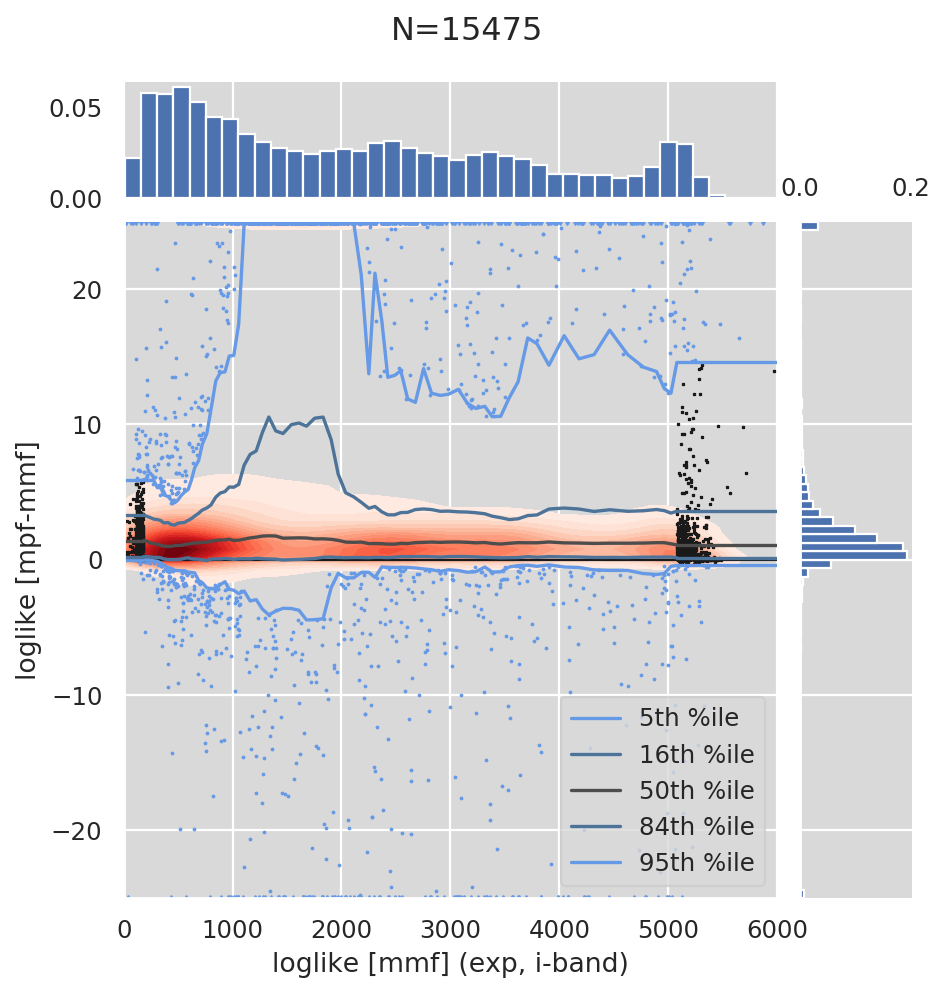

Plotting model exp plot time


/software/lsstsw/stack_20191101/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/software/lsstsw/stack_20191101/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: overflow encountered in true_divide
/software/lsstsw/stack_20191101/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: divide by zero encountered in log10


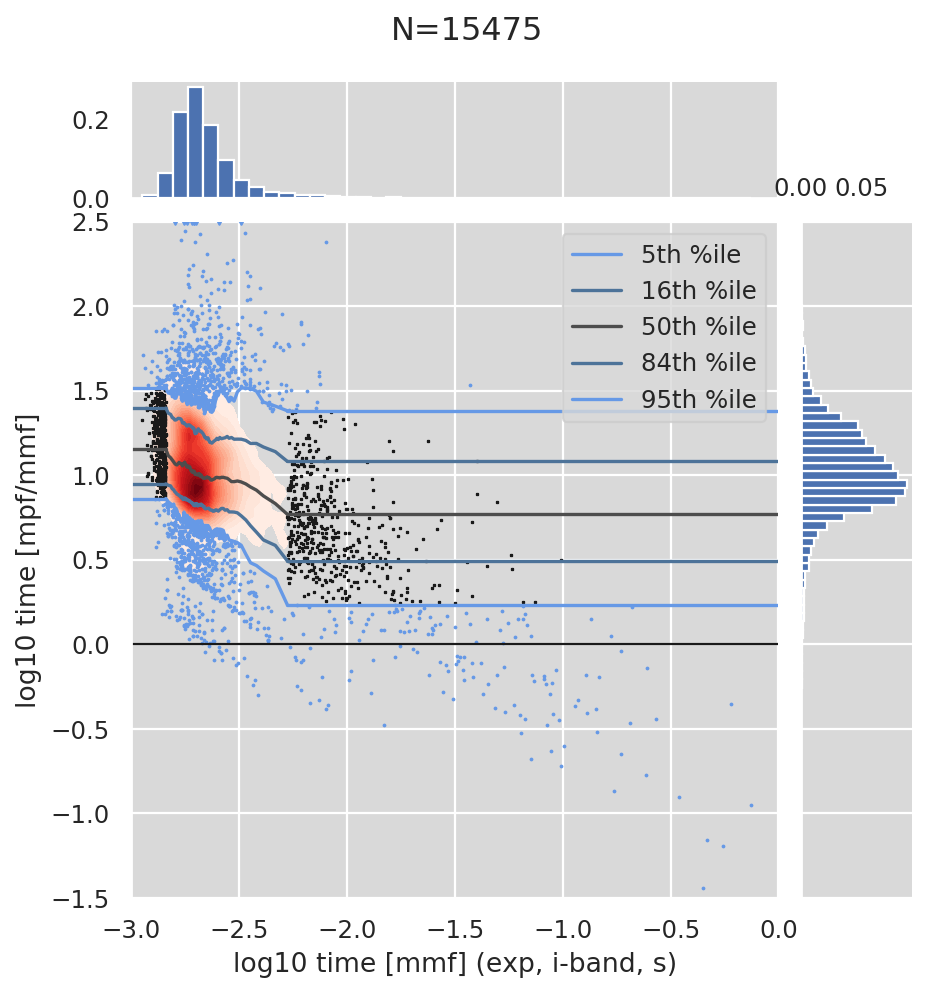

Plotting model exp plot mag


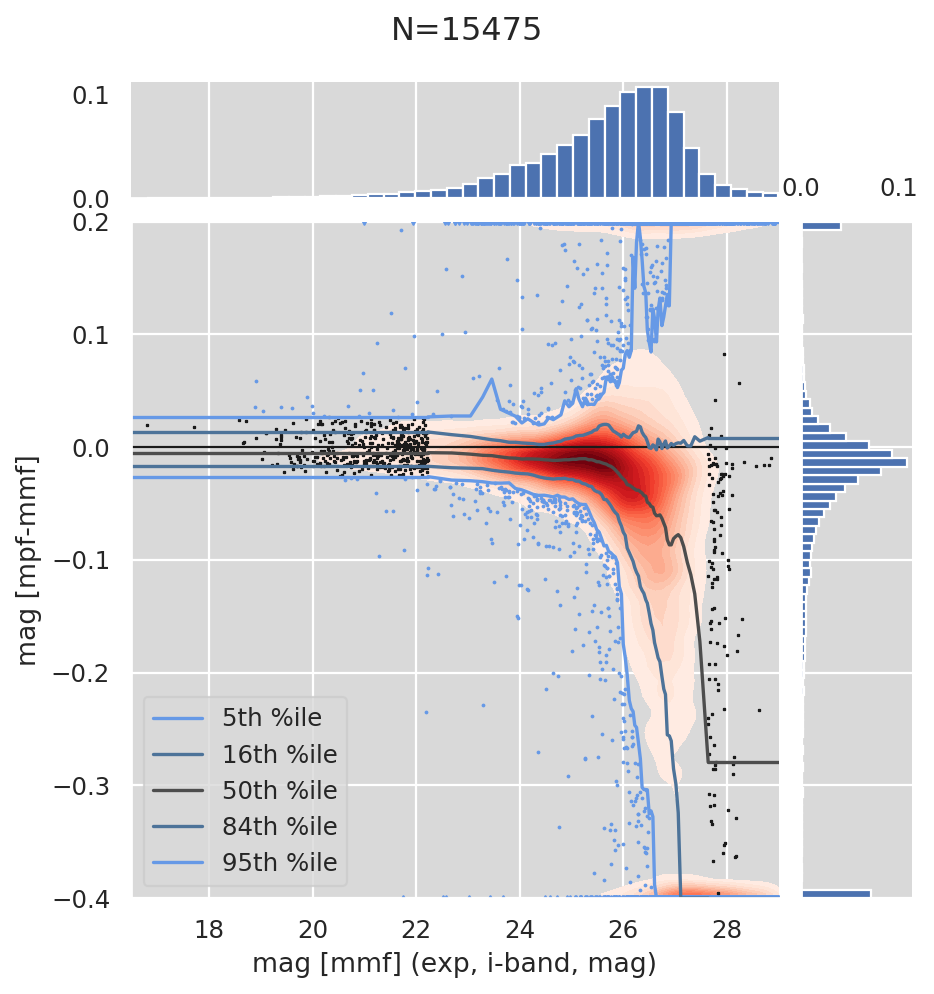

Plotting model exp plot mag_bright


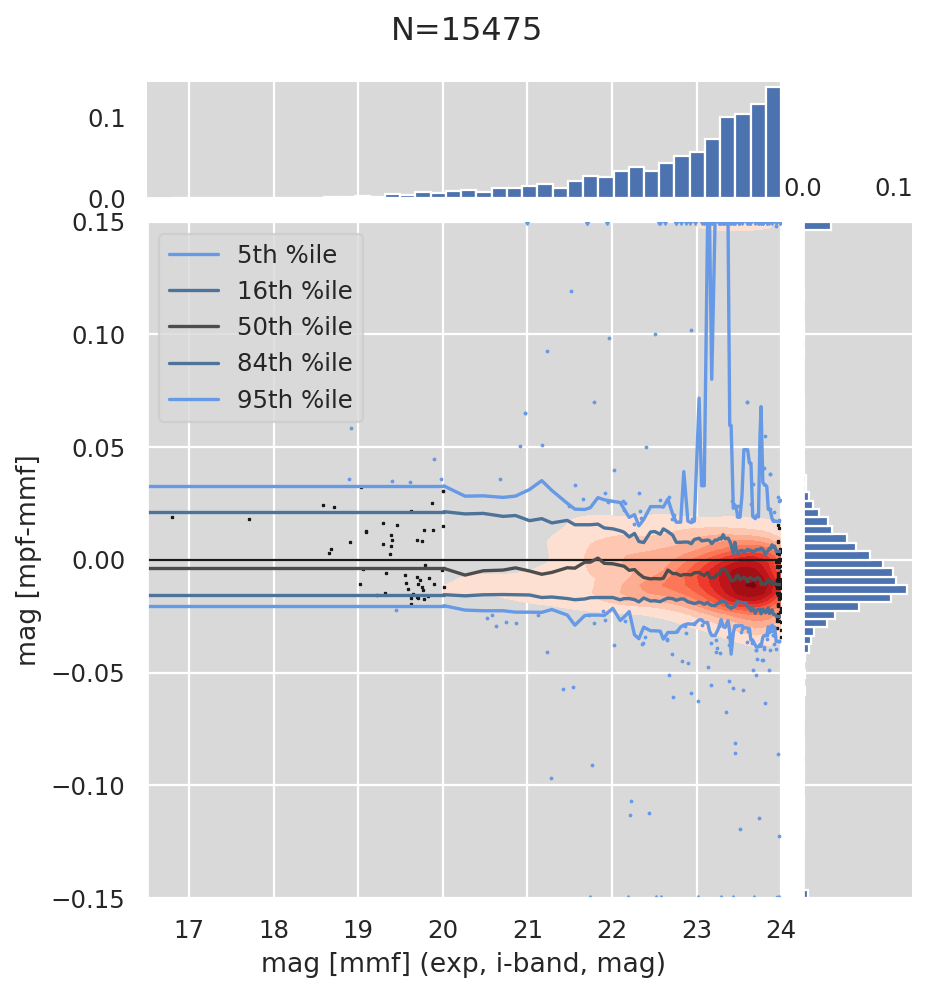

Plotting model exp plot reff


/software/lsstsw/stack_20191101/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/astropy/table/column.py:991: RuntimeWarning: invalid value encountered in greater
  result = getattr(super(), op)(other)


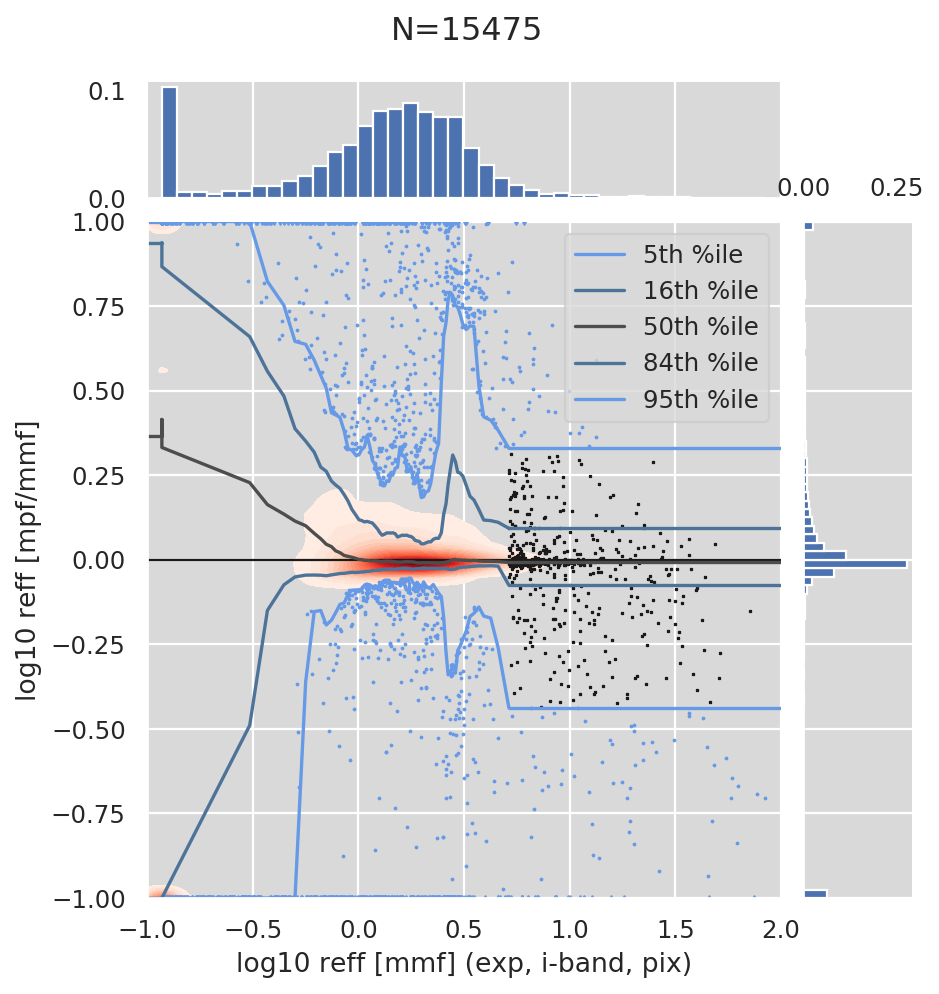

Plotting model exp plot mag_reff_mmf


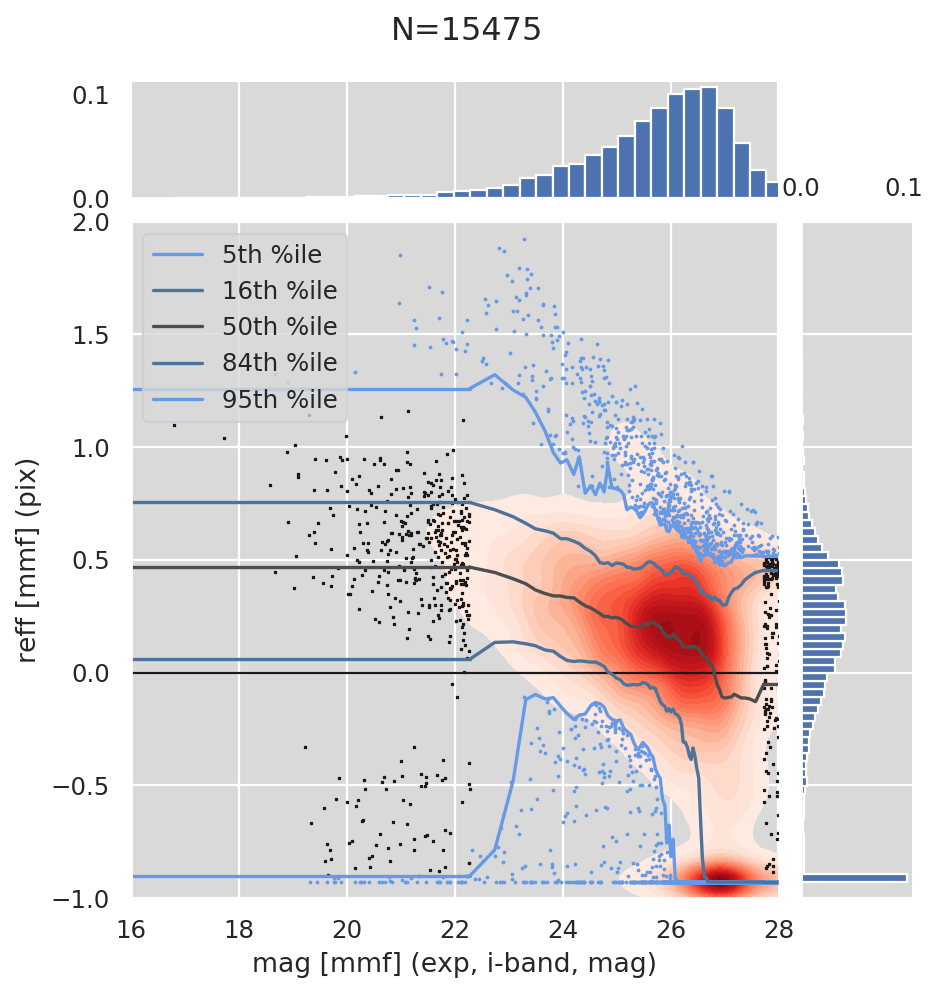

Plotting model exp plot mag_reff_mpf


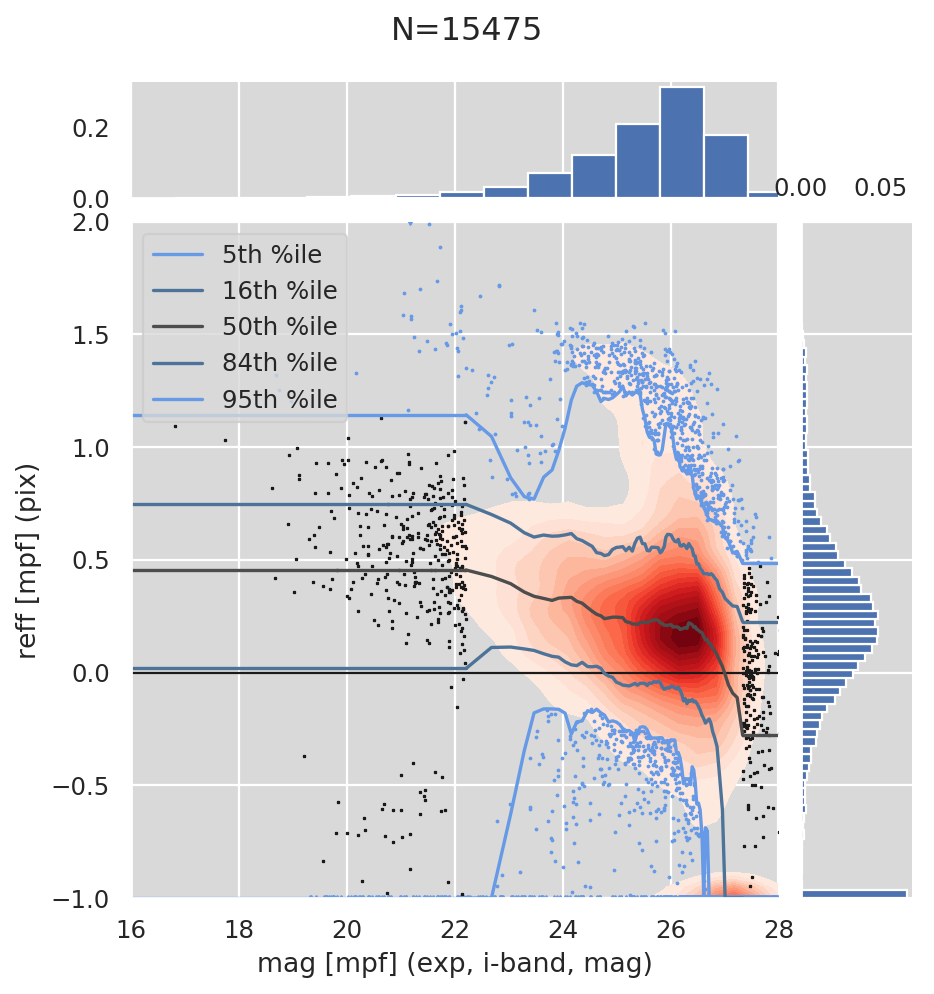

Plotting model dev plot loglike


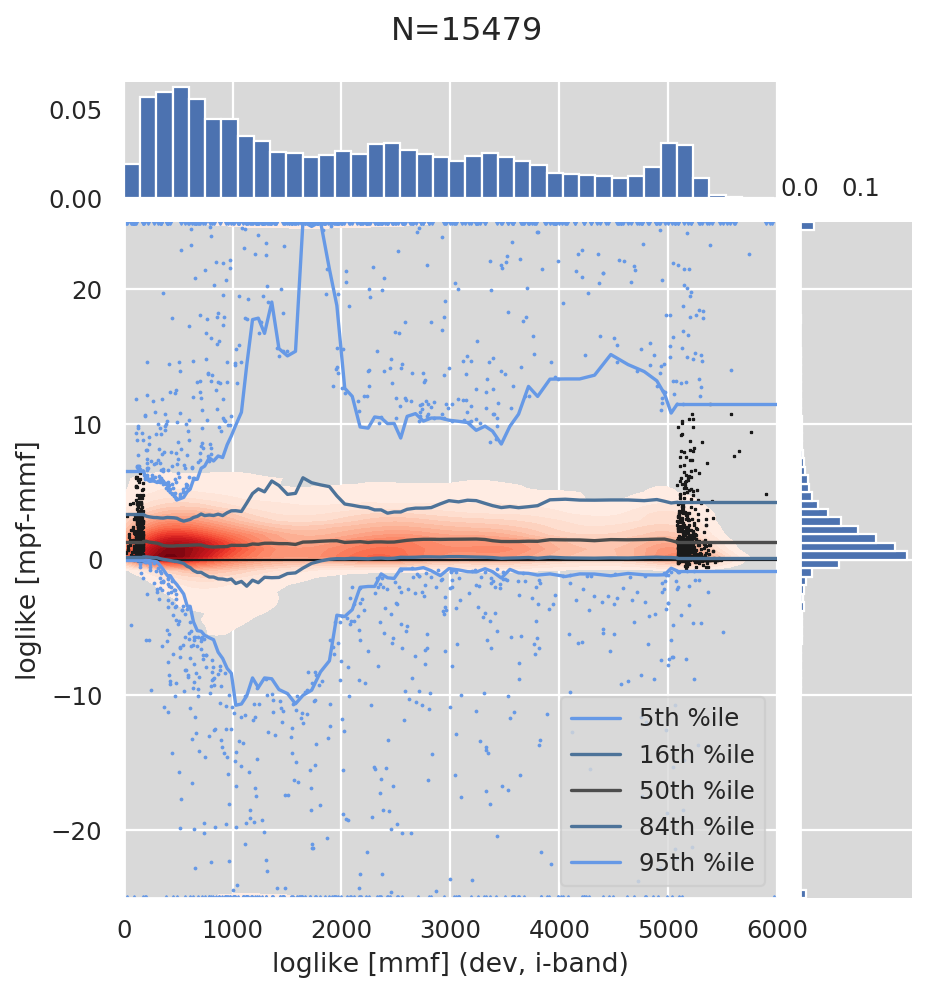

Plotting model dev plot time


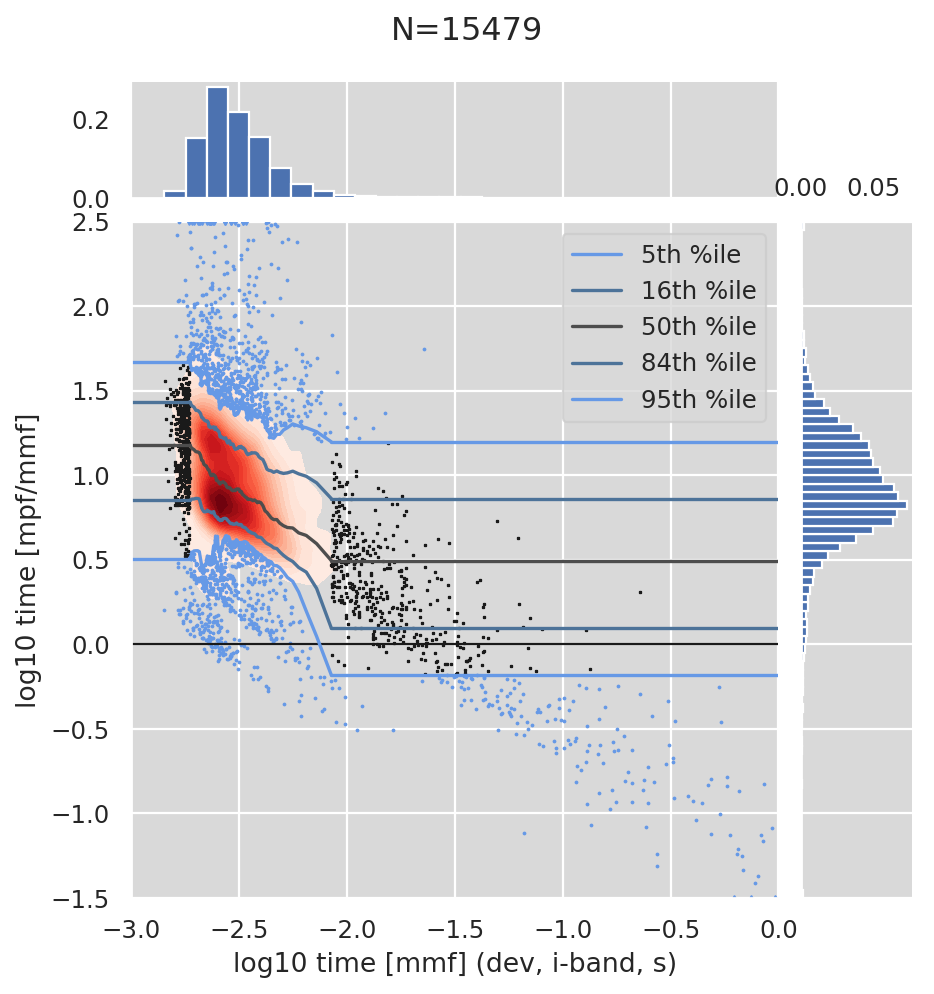

Plotting model dev plot mag


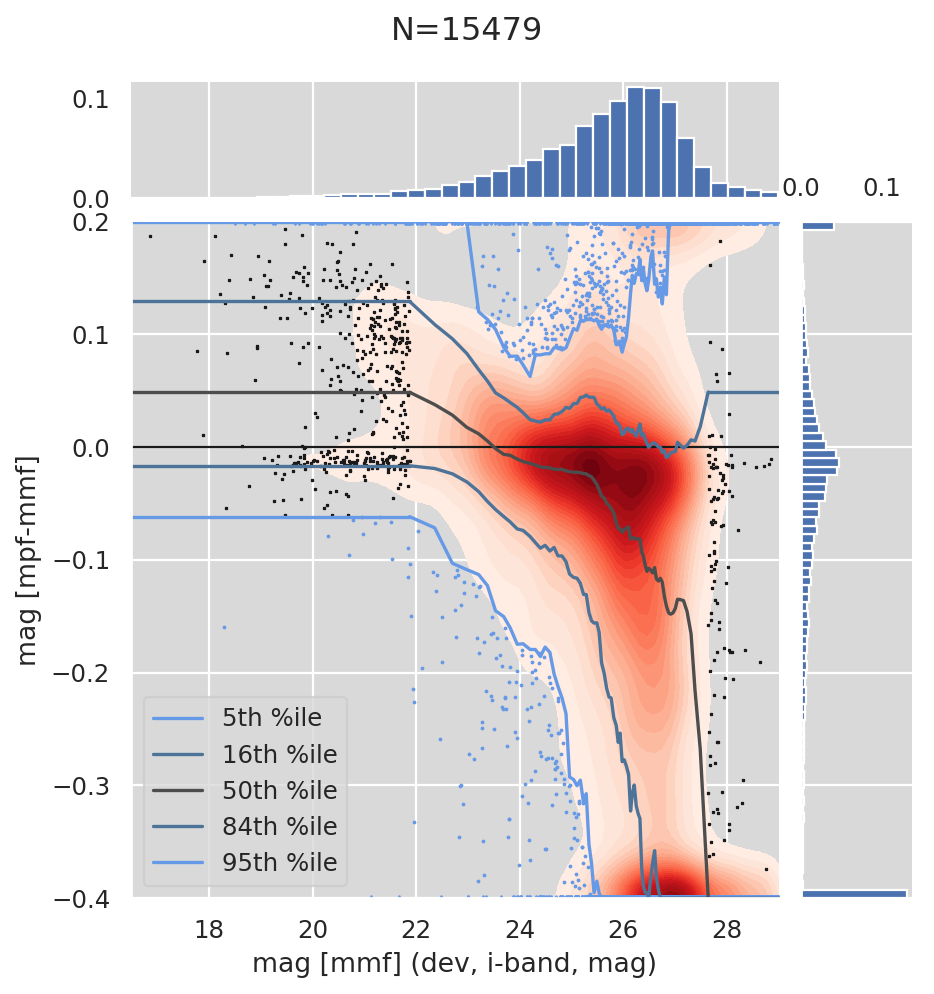

Plotting model dev plot mag_bright


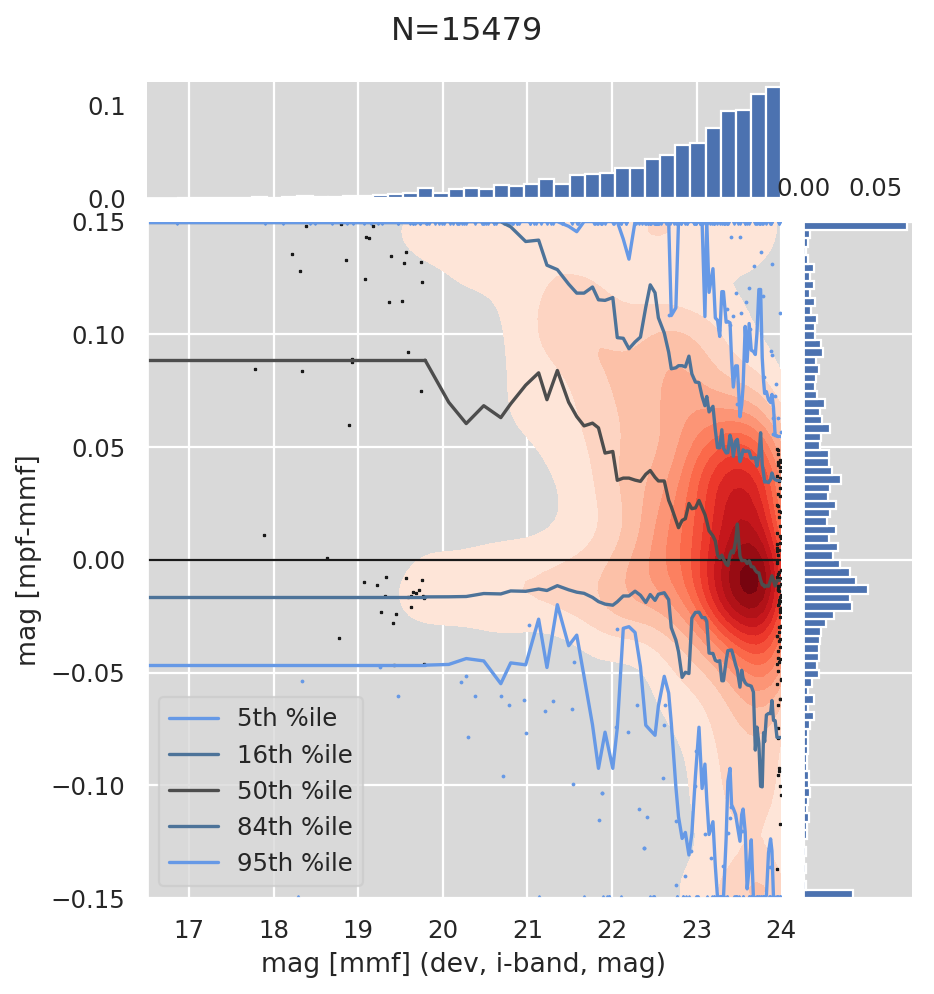

Plotting model dev plot reff


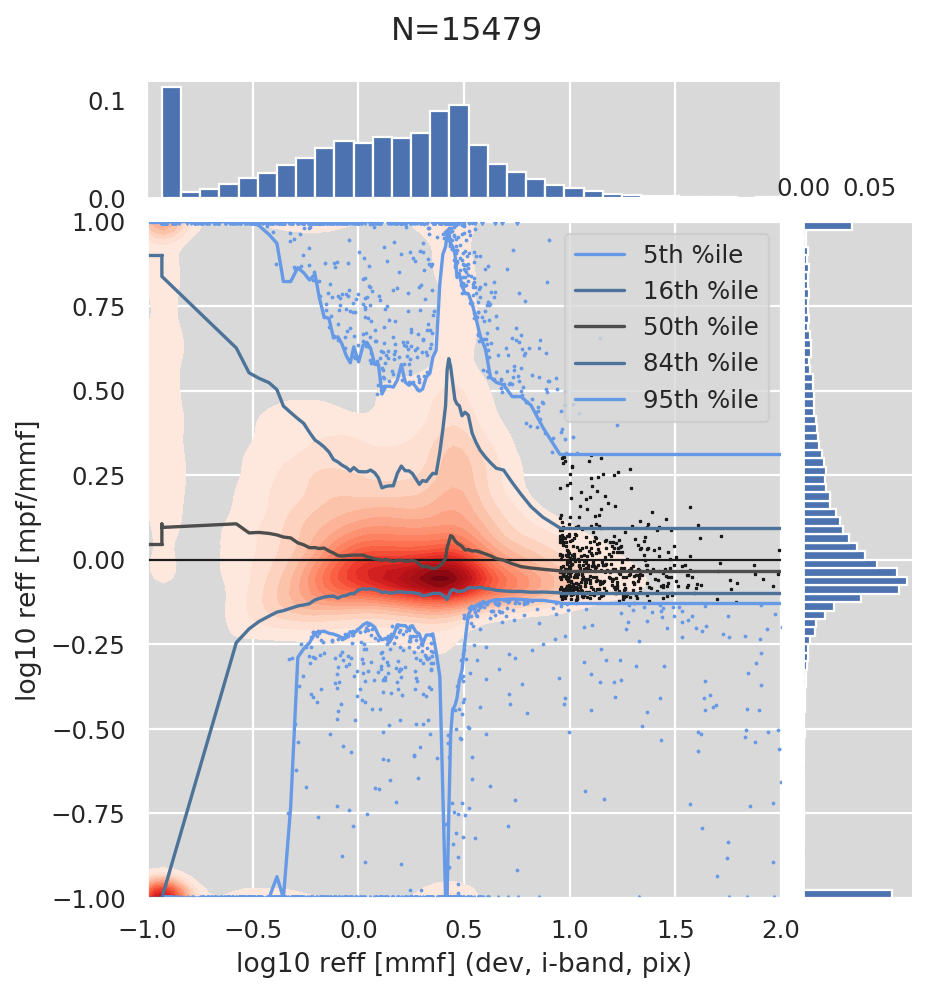

Plotting model dev plot mag_reff_mmf


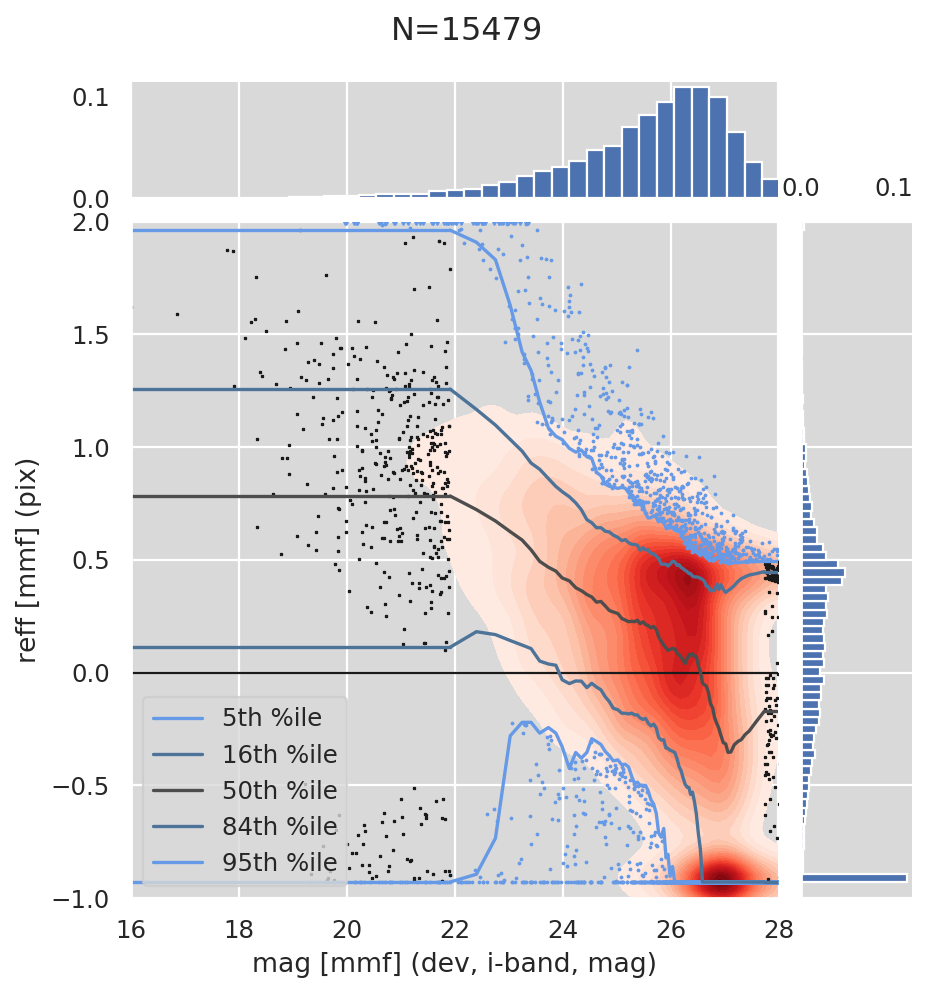

Plotting model dev plot mag_reff_mpf


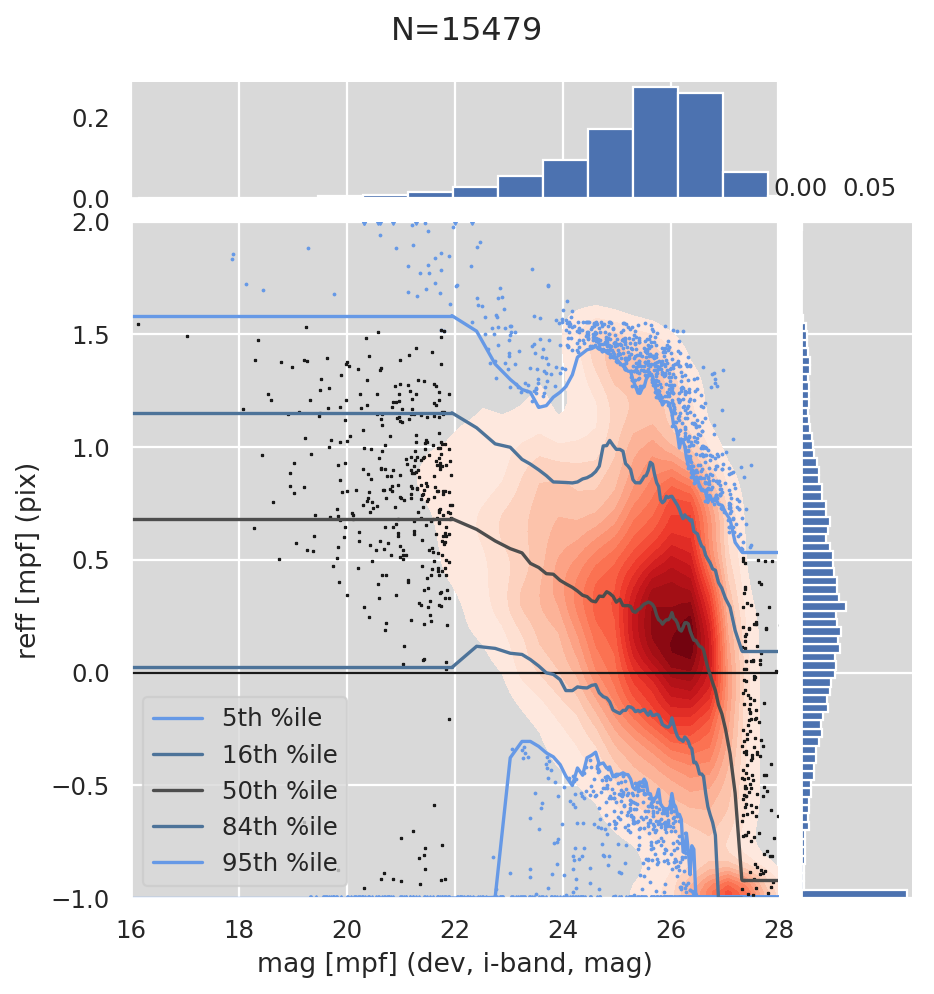

Plotting model cmodel plot loglike


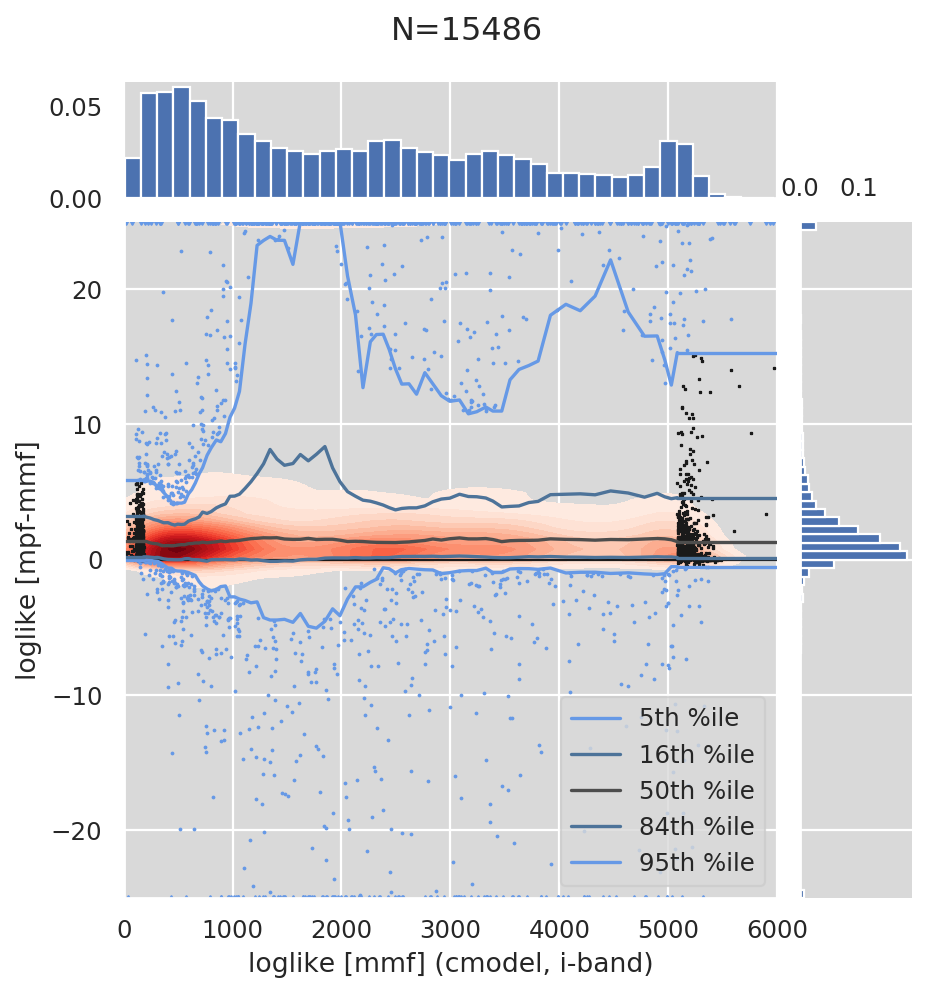

Plotting model cmodel plot time
Failed to read data['i']['cmodel']['mmf']['time'] and/or data['i']['cmodel']['mpf']['time'] due to KeyError('time')
Plotting model cmodel plot mag


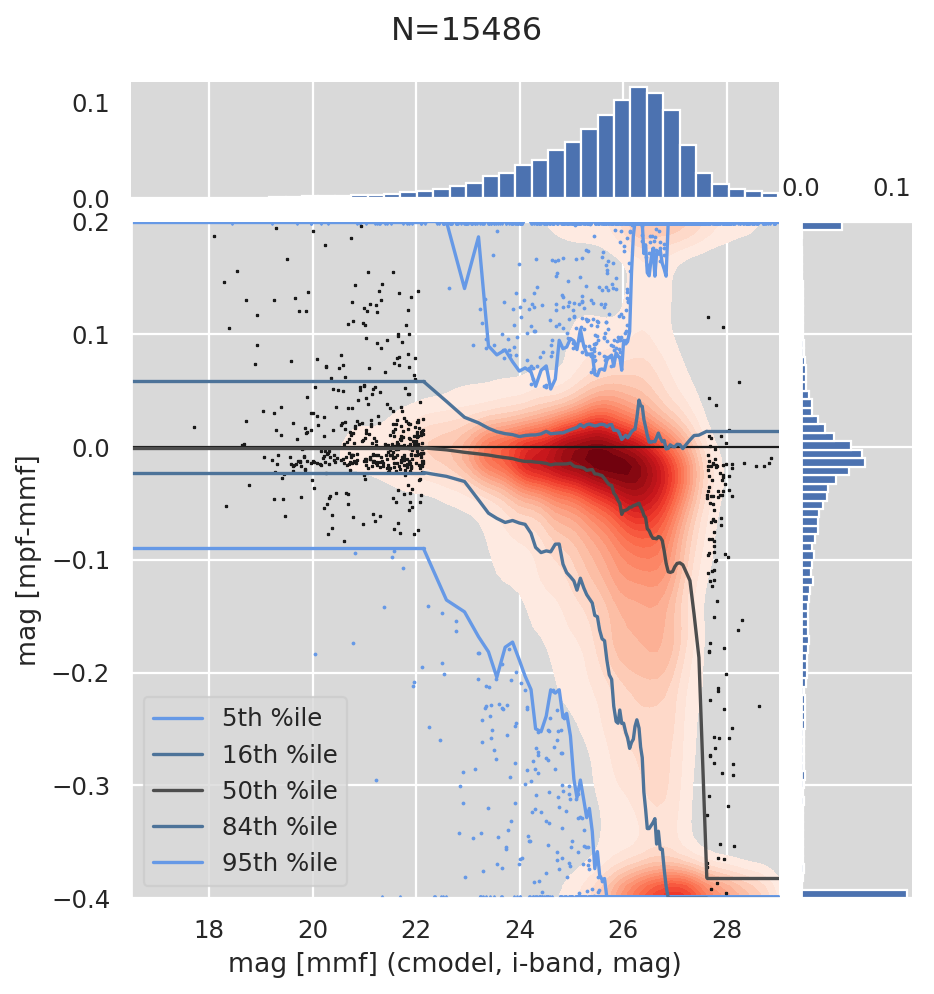

Plotting model cmodel plot mag_bright


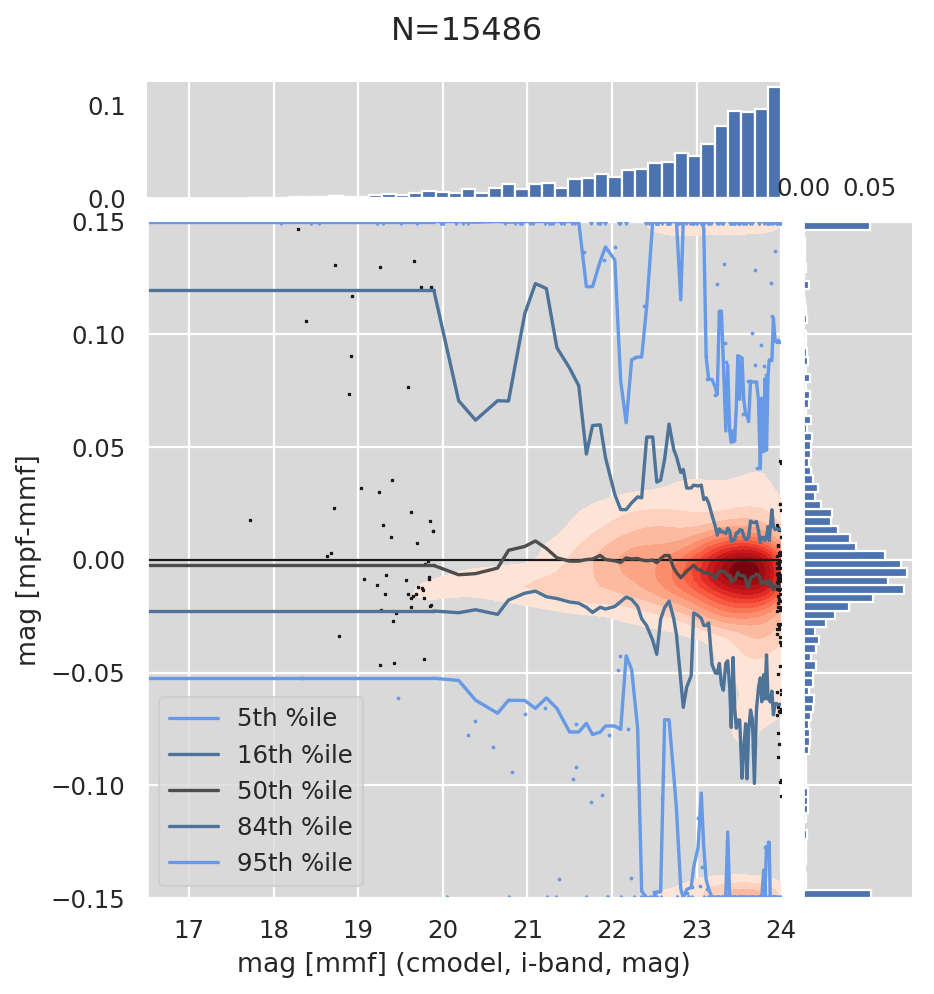

In [8]:
# Plot i-band MMF vs MPF
plot_models(data, "i", ("mmf", "mpf"), columns_plot, columns_plot_size)

## Comparing i-band meas_modelfit vs MultiProFit multiband

To be clear, these are comparing only the i-band parameters from the MultiProFit griz simultaneous fit. Some structural parameters are shared across bands (all of them for single Sersic fits). meas_modelfit is i-band only as before.

Right now the log likelihood plots are sadly useless because they include all bands for MultiProFit but only i-band for meas_modelfit.

Plotting model exp plot loglike


/software/lsstsw/stack_20191101/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in subtract


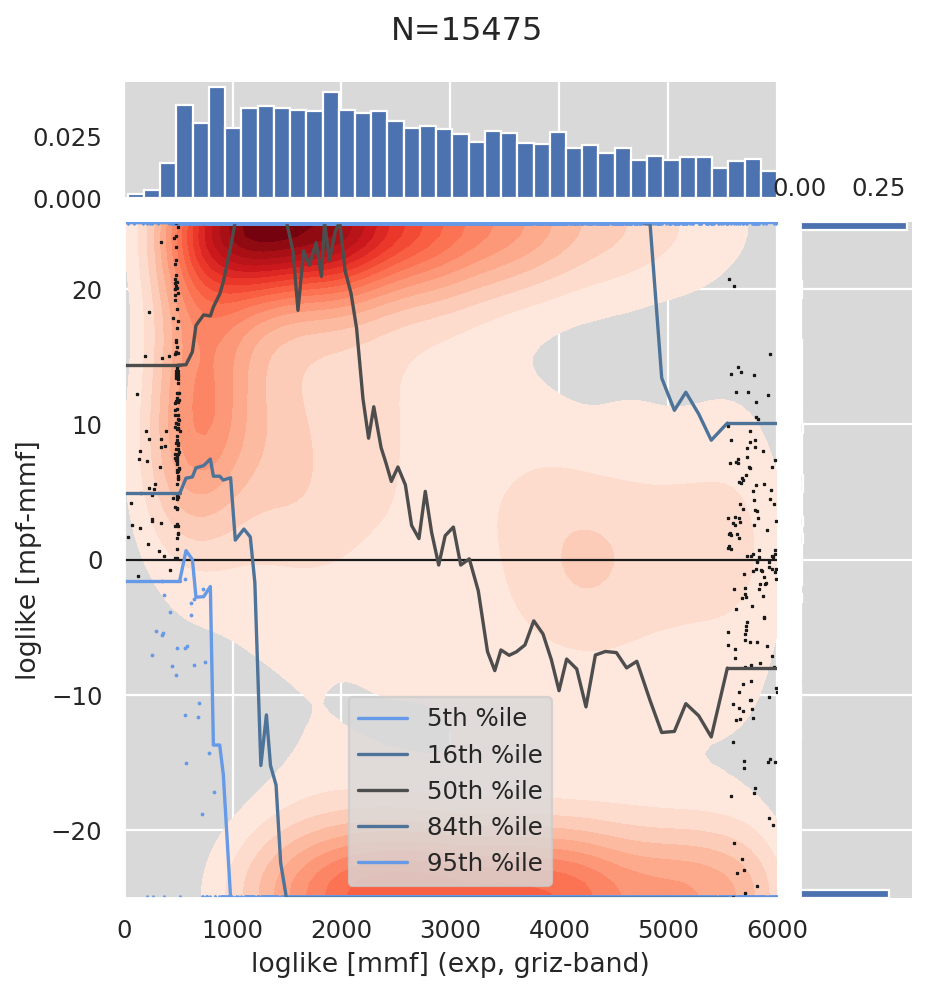

Plotting model exp plot time


/software/lsstsw/stack_20191101/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/software/lsstsw/stack_20191101/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: overflow encountered in true_divide
/software/lsstsw/stack_20191101/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: divide by zero encountered in log10


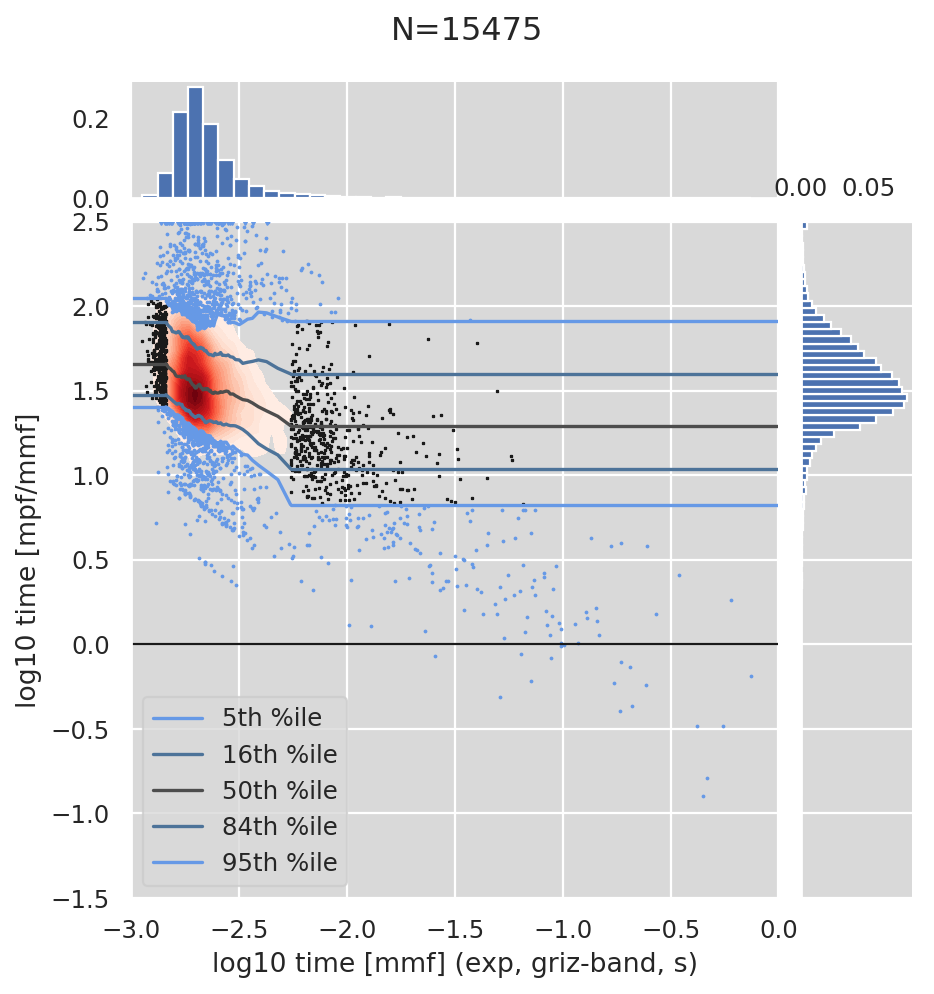

Plotting model exp plot mag


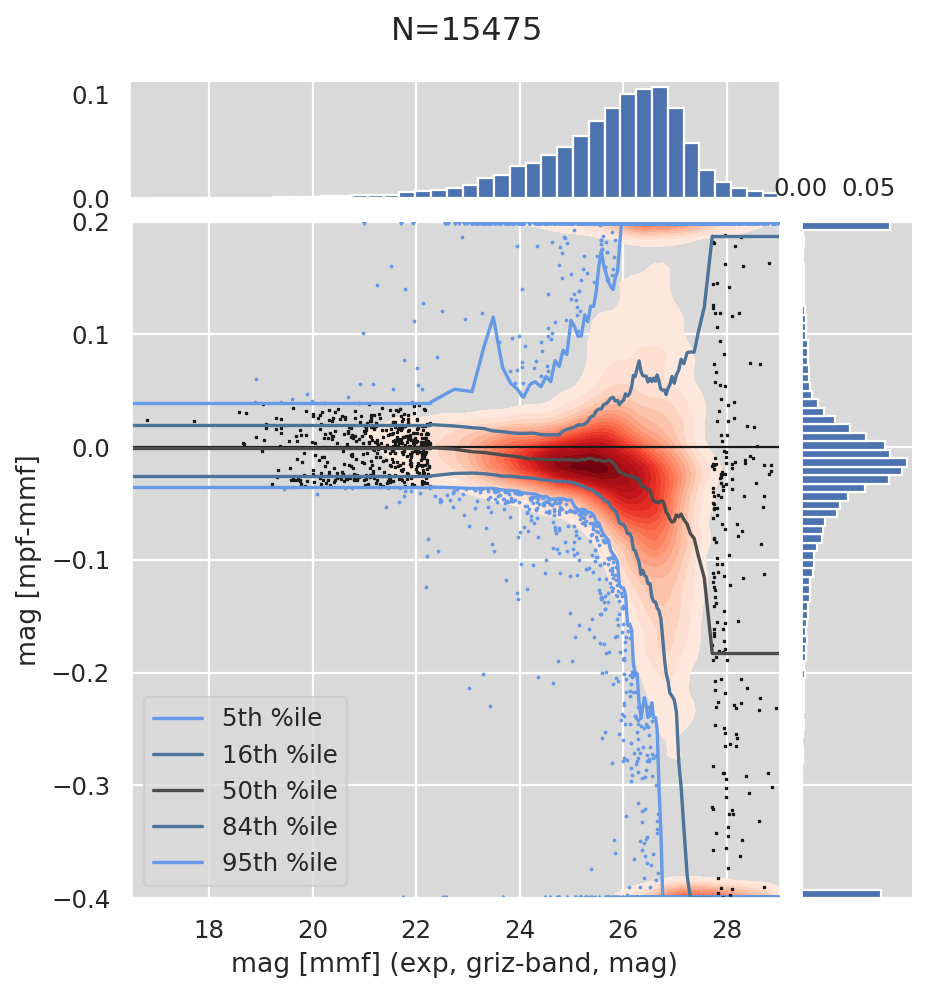

Plotting model exp plot mag_bright


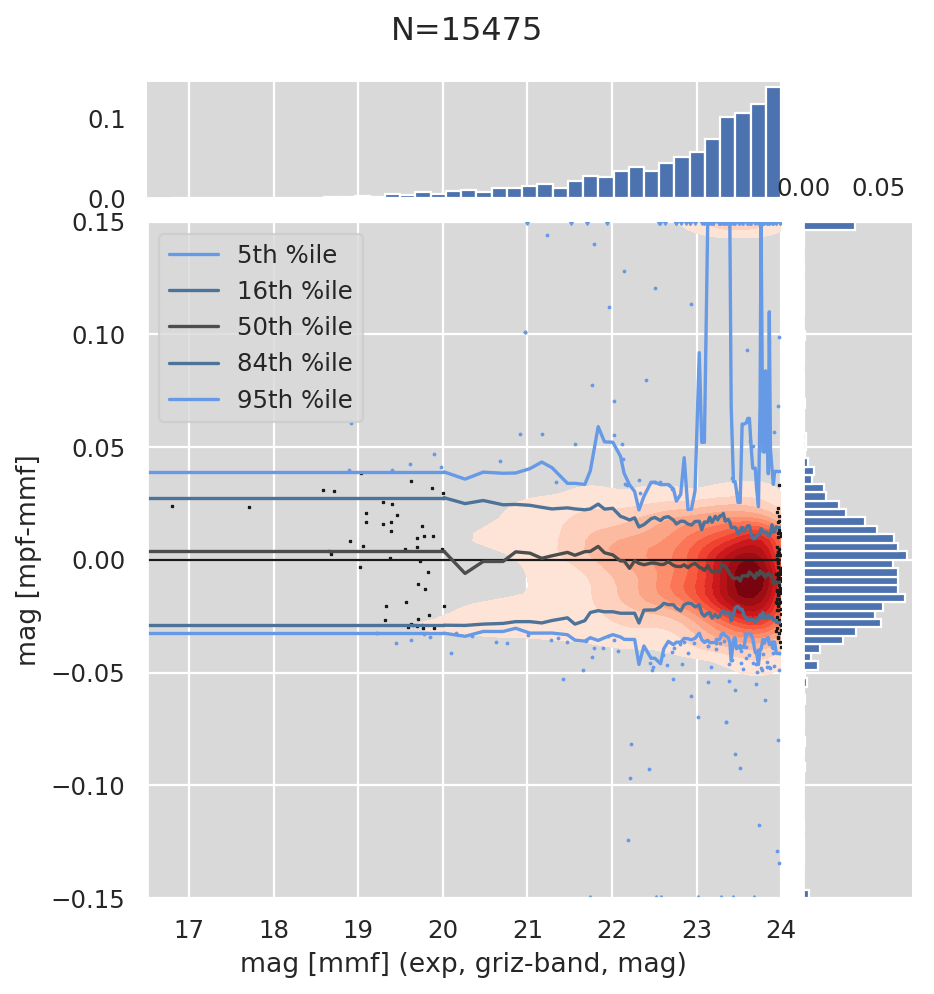

Plotting model exp plot reff


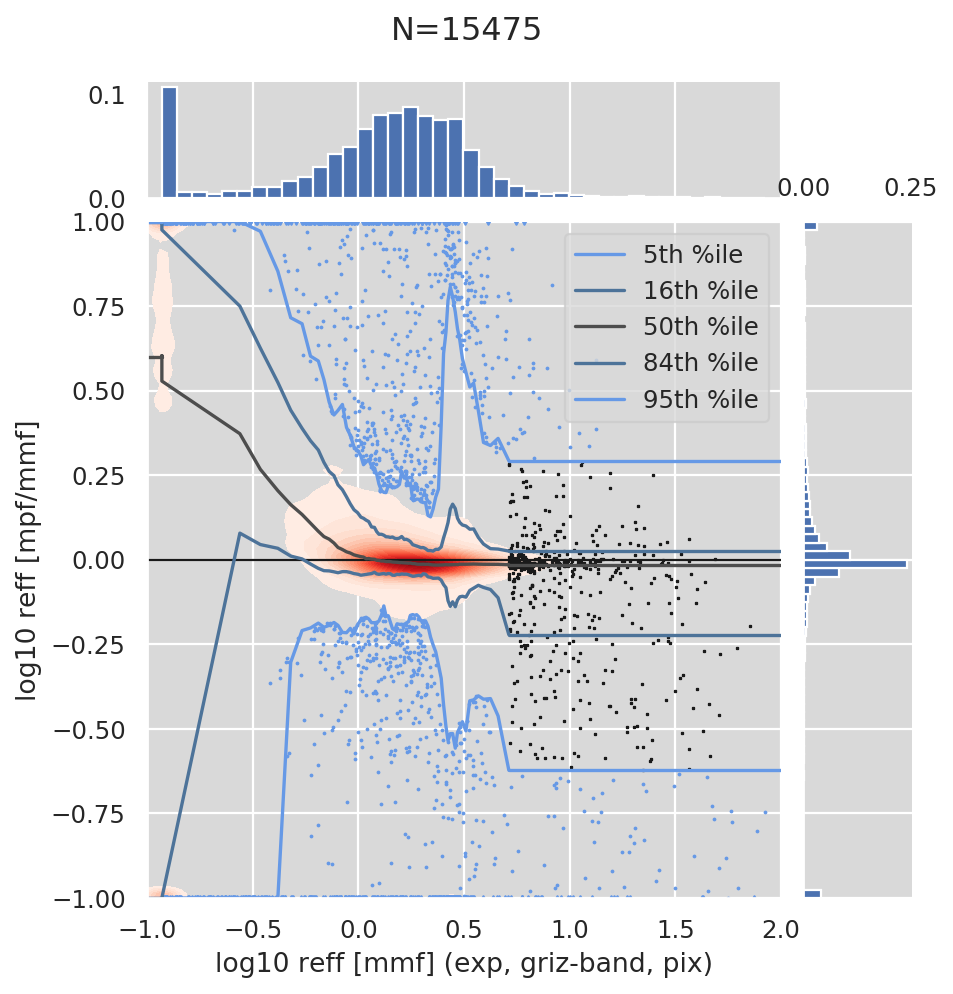

Plotting model exp plot mag_reff_mmf


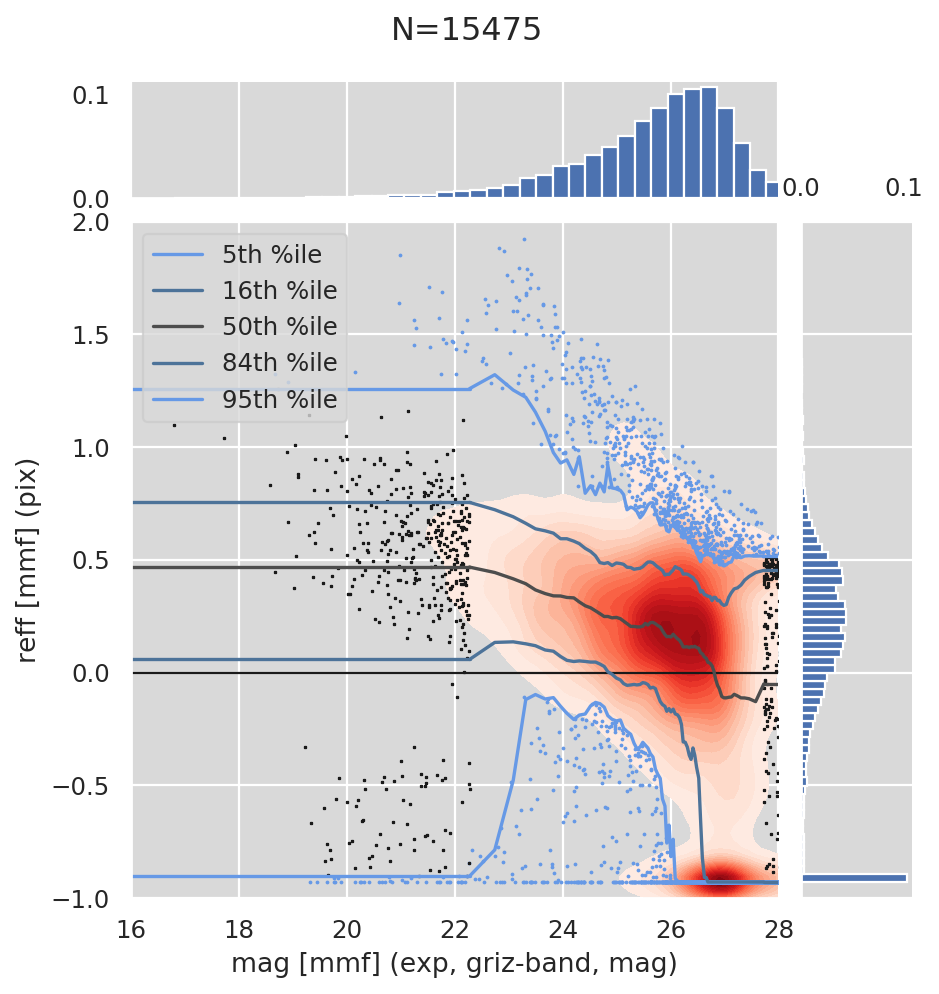

Plotting model exp plot mag_reff_mpf


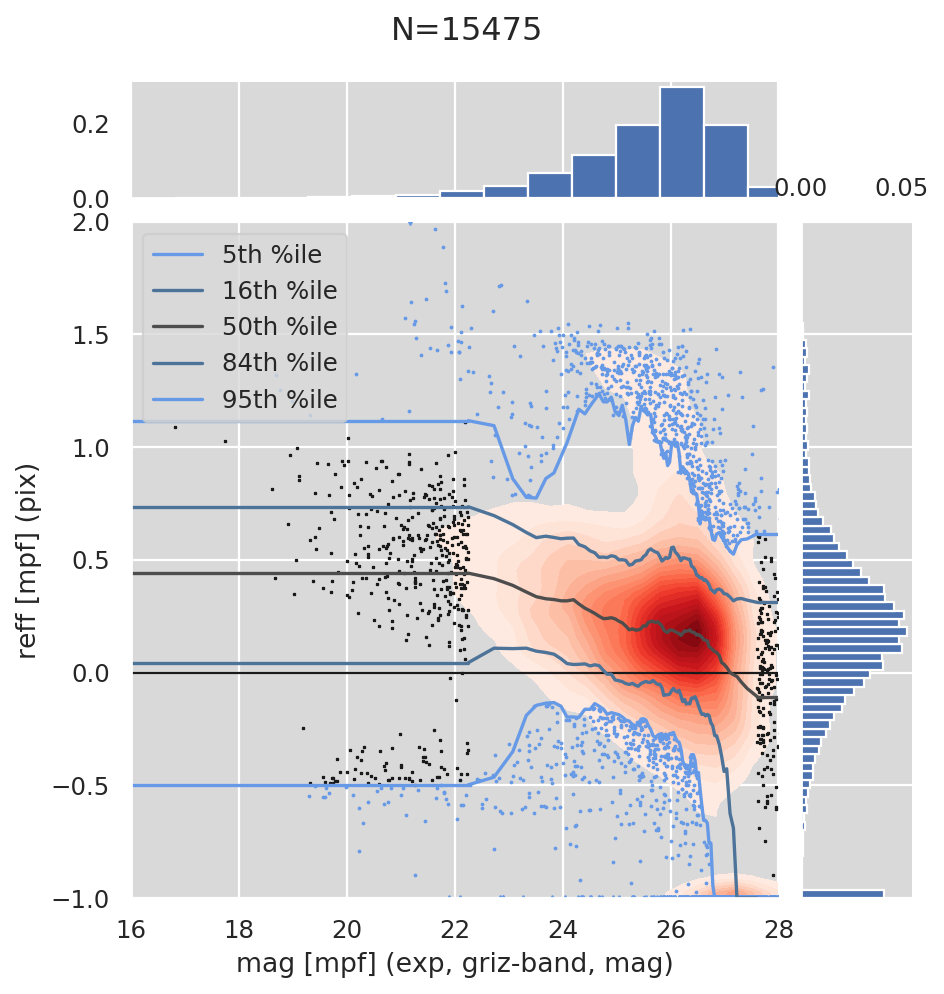

Plotting model dev plot loglike


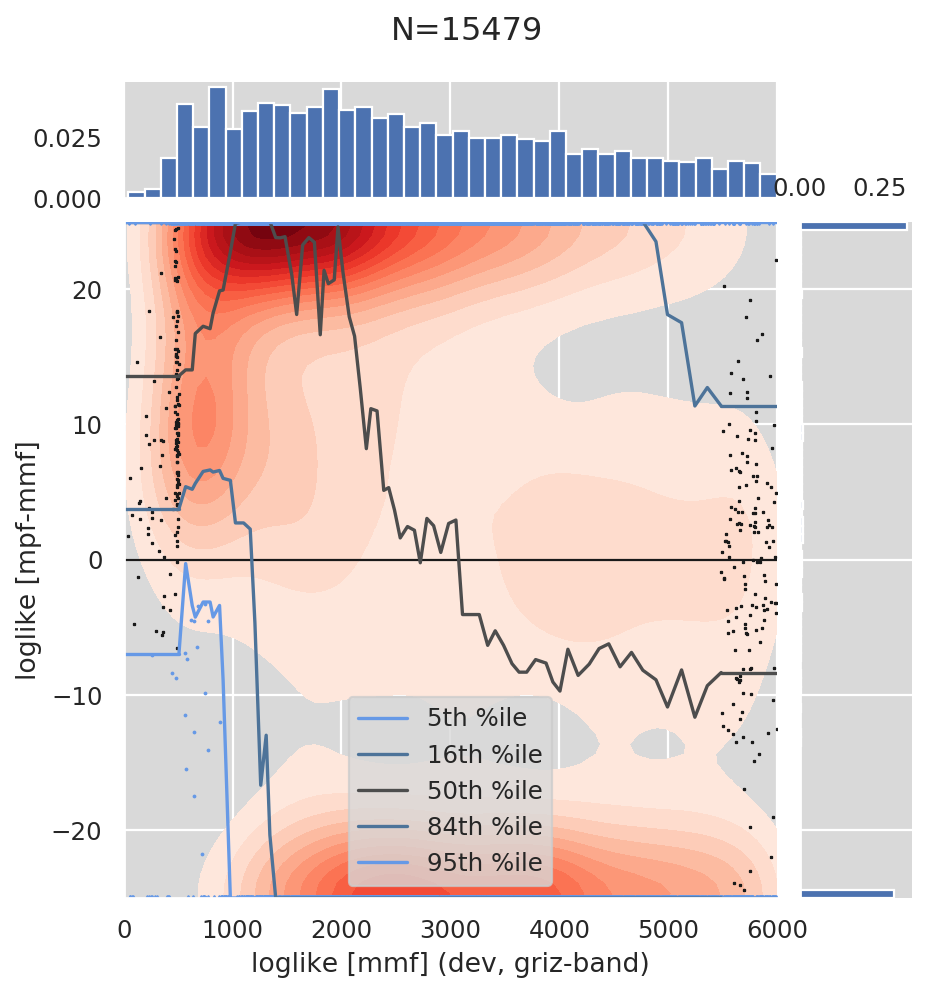

Plotting model dev plot time


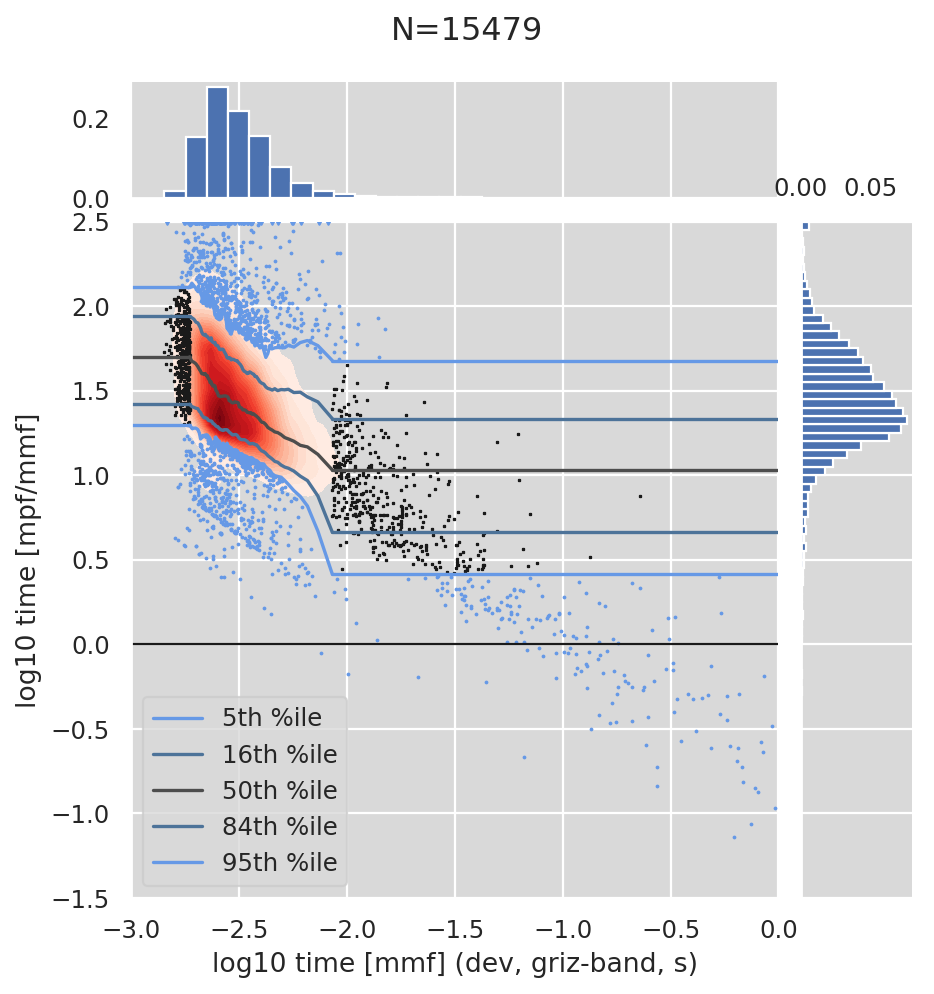

Plotting model dev plot mag


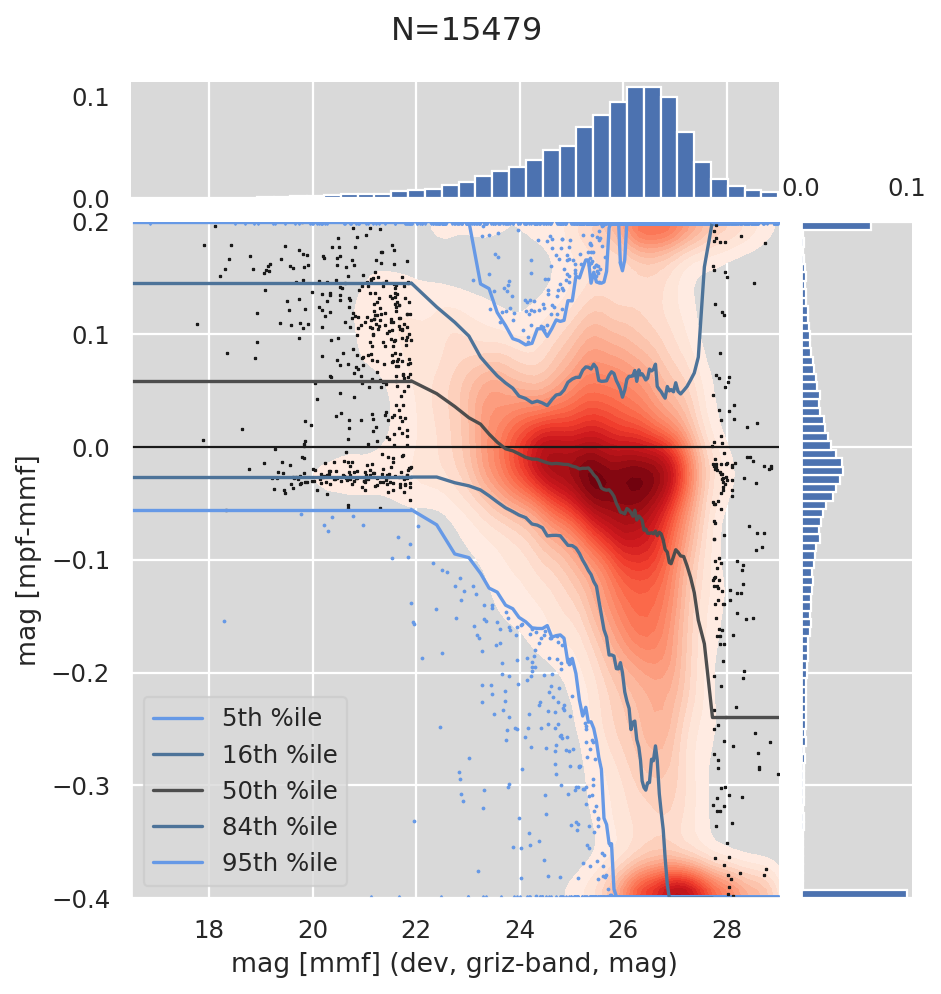

Plotting model dev plot mag_bright


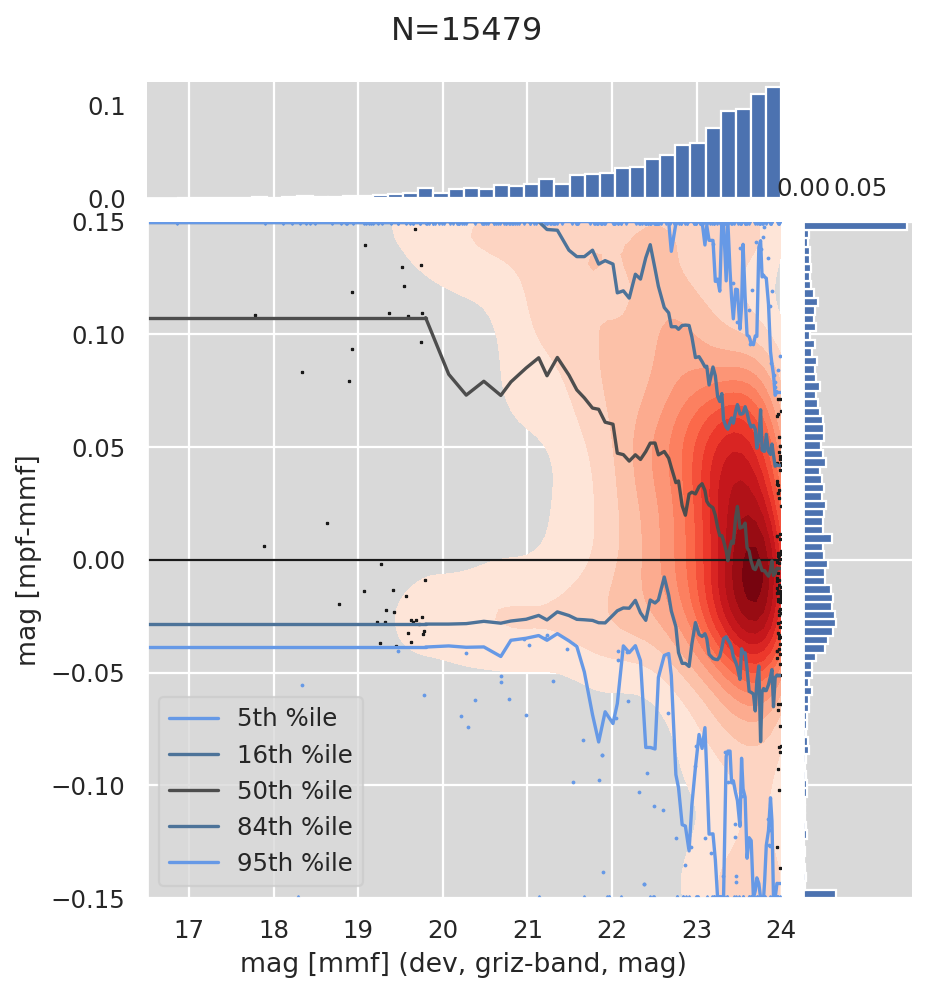

Plotting model dev plot reff


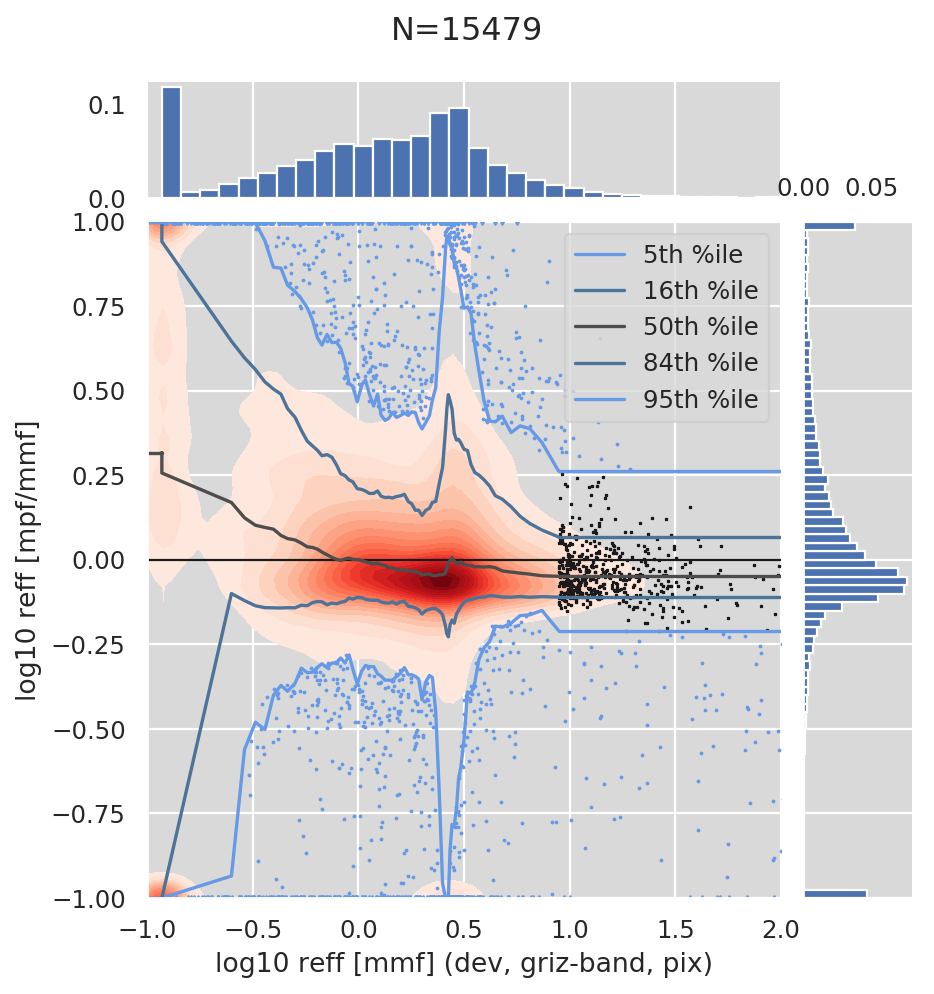

Plotting model dev plot mag_reff_mmf


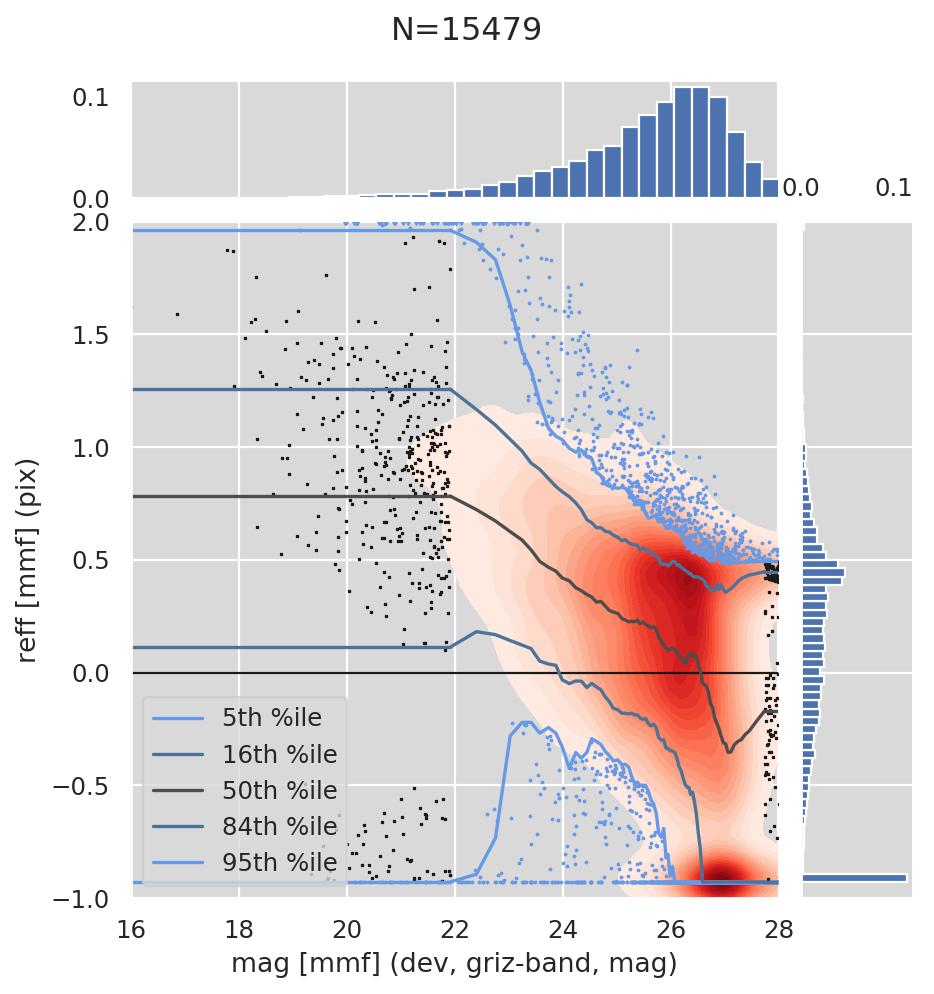

Plotting model dev plot mag_reff_mpf


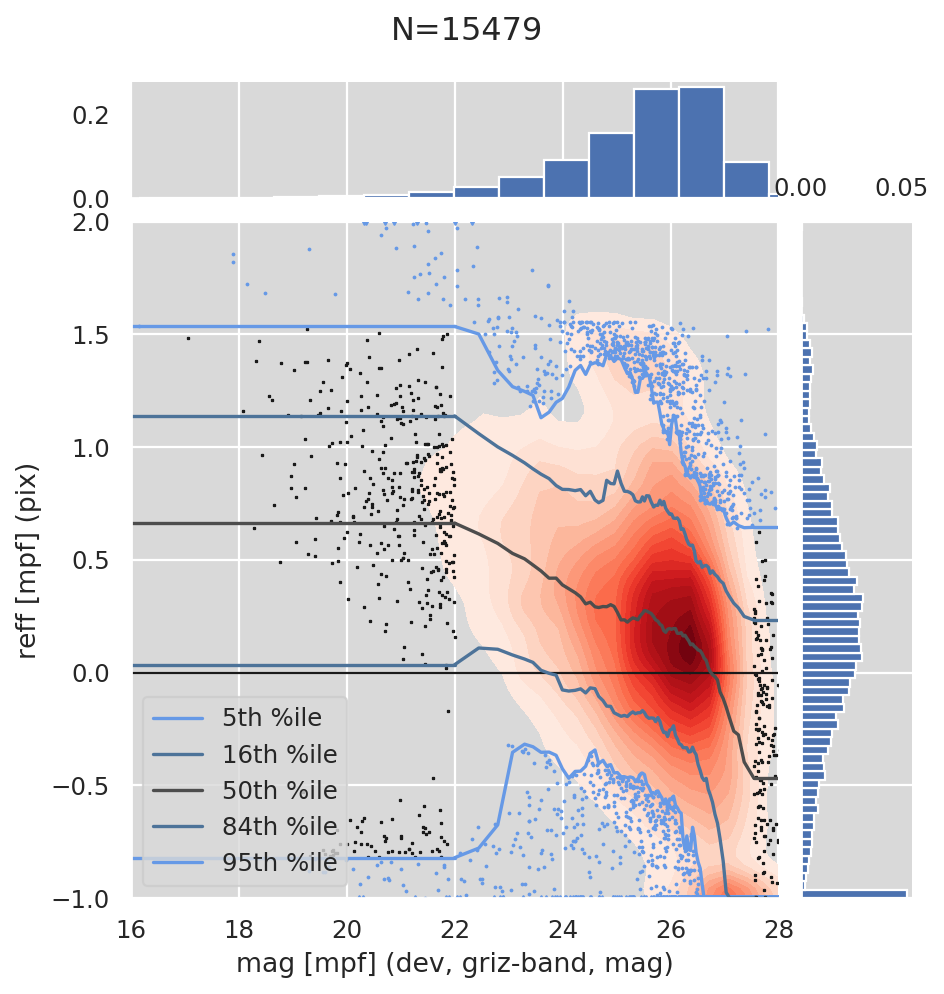

Plotting model cmodel plot loglike


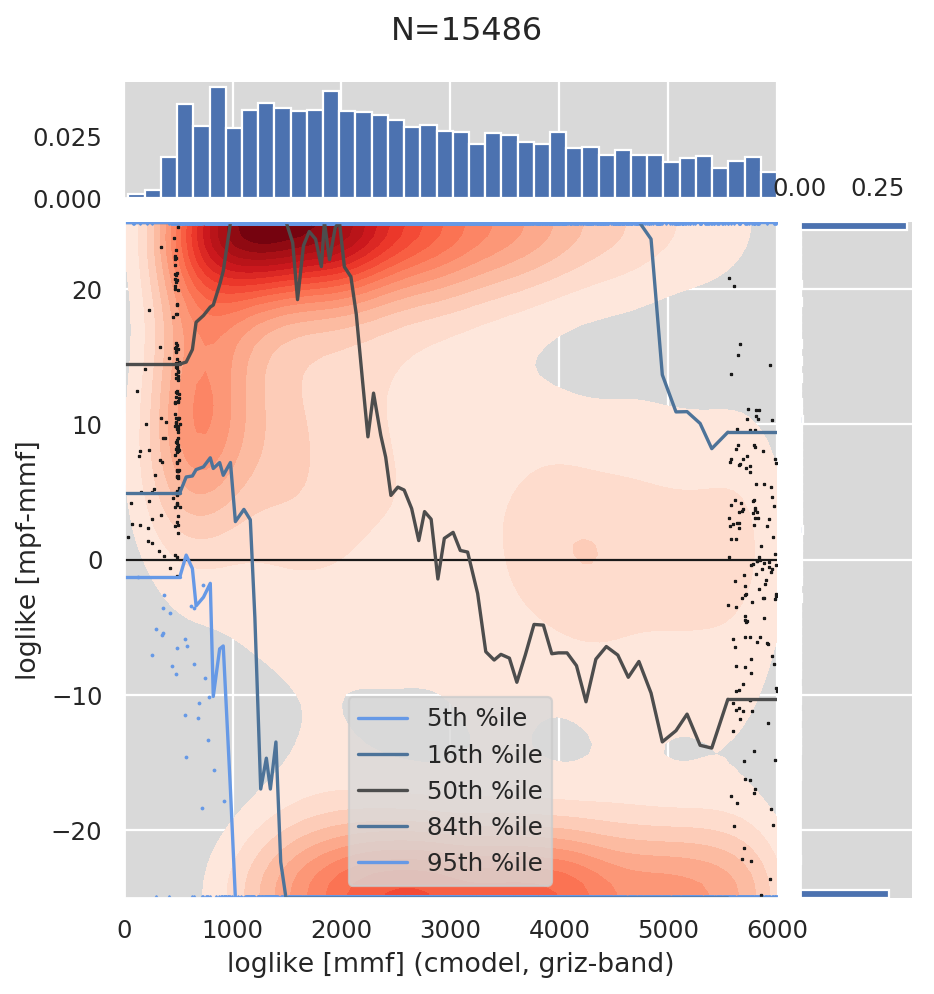

Plotting model cmodel plot time
Failed to read data['griz']['cmodel']['mmf']['time'] and/or data['griz']['cmodel']['mpf']['time'] due to KeyError('time')
Plotting model cmodel plot mag


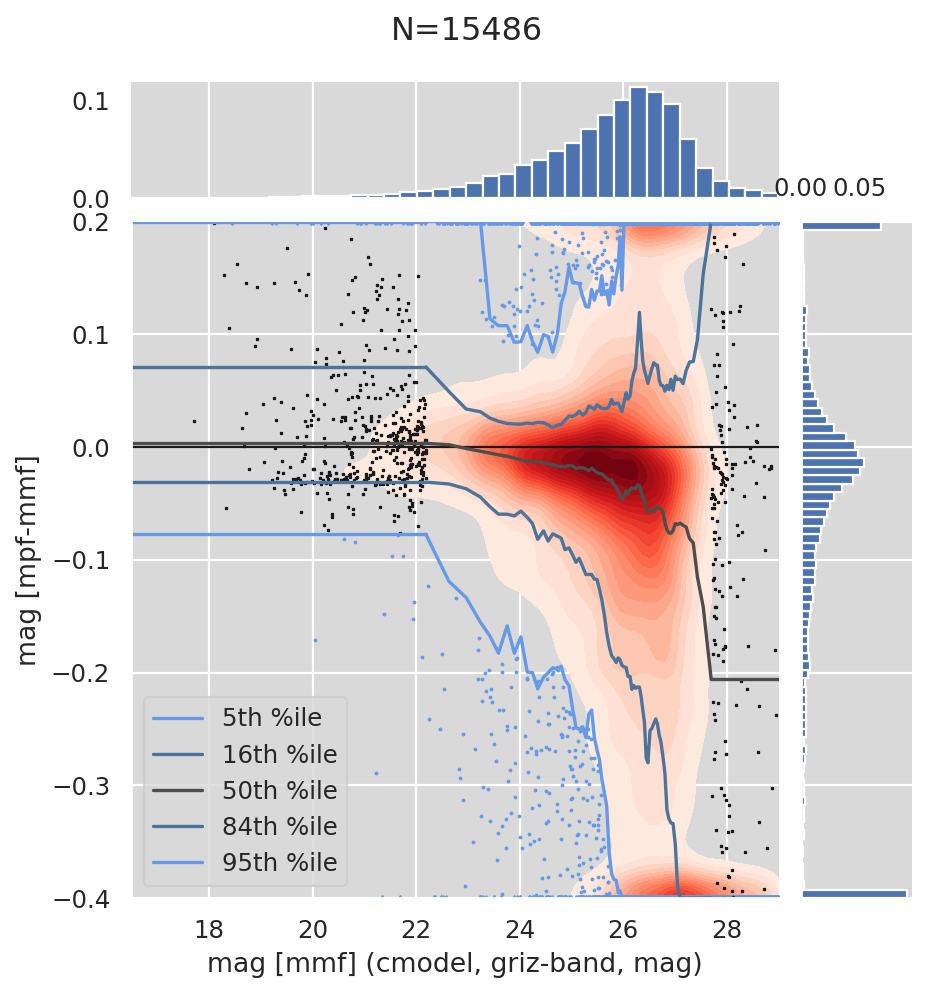

Plotting model cmodel plot mag_bright


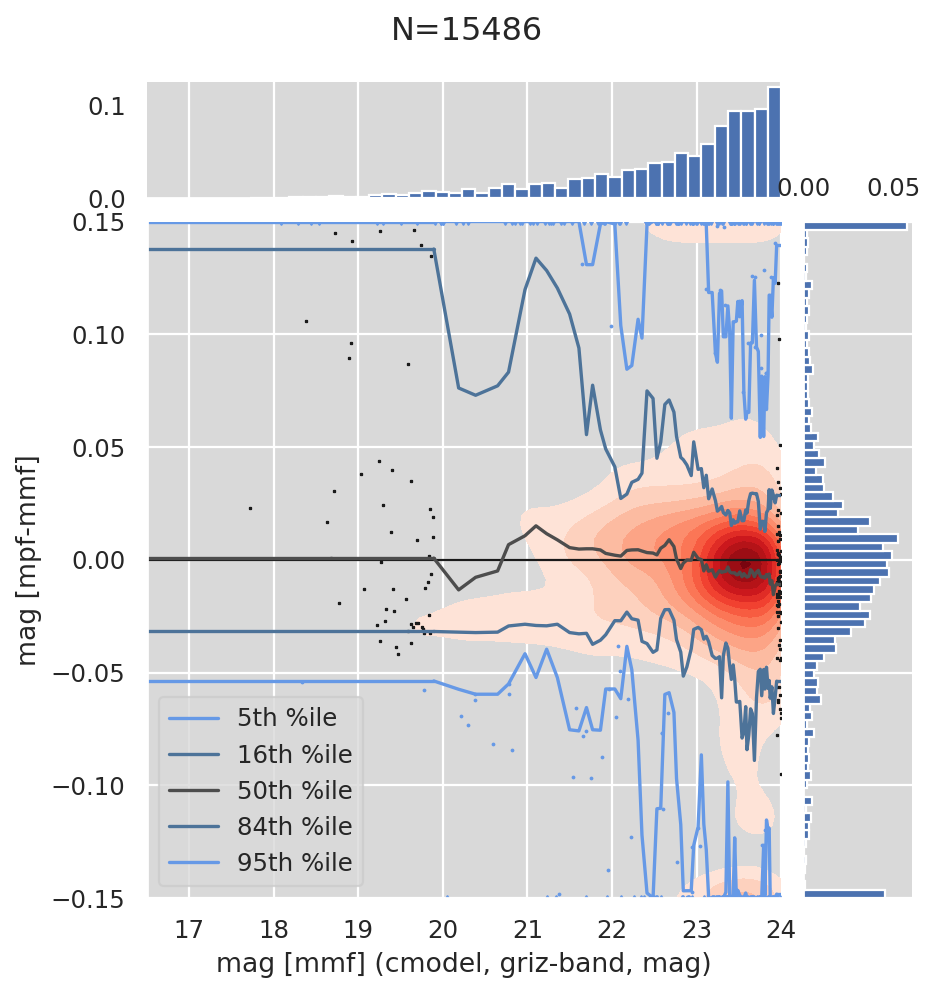

In [9]:
# Plot i-band MMF vs MPF (griz fit)
plot_models(data, "griz", ("mmf", "mpf"), columns_plot, columns_plot_size)

## Comparing griz-band MultiProFit CModel vs MG Sersic fits

As before, these are comparing only the i-band parameters, although griz are fit simultaneously.

In [10]:
columns_plot_size_algo = columns_plot.copy()
columns_plot_size_algo.update({
    "reff": dict(postfix="_1", log=True, ratio=True, limx=(-1, 2), limy=(-1, 1)),
    "mag_reff": dict(postfix="_1", log_y=True, limx=(16, 28), limy=(-1, 2),
                      column="mag", column_y="reff", datum_idx_x=1),
})

def plot_models_algo(data, band, algo, models, columns_plot, columns_plot_size_algo):
    data_band = data[band]
    data_models = [data_band[model] for model in models]
    is_single_comp = all([model != "cmodel" for model in models])
    data_algos = [data_model[algo] for data_model in data_models]
    cond = (data_algos[0]['mag_1'] < 28) & (data_algos[0]['good'])
    title = f'N={np.count_nonzero(cond)}'
    for name_plot, column_info in (columns_plot_size if is_single_comp else columns_plot).items():
        print(f"Plotting models {models} plot {name_plot}")
        column_x, column_y, name_column_x, name_column_y, datum_idx_x, datum_idx_y = \
            get_columns_info(column_info, name_plot)
        try:
            x = data_algos[0][column_x]
            y = data_algos[1][column_y]
            plot_column_pair(x, y, cond, column_info, name_column_x, name_column_y, models[0], models[1], algo, band, units, title=title)
        except Exception as e:
            data_model_names = [f"data['{band}']['{model}']" for model in models]
            print(f"Failed to read {data_model_names[0]}['{algo}']['{column_x}'] and/or "
                  f"{data_model_names[1]}['{algo}']['{column_y}'] "
                  f"due to {getattr(e, 'message', repr(e))}")
                #print(traceback.format_exc())

/software/lsstsw/stack_20191101/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/astropy/table/column.py:991: RuntimeWarning: invalid value encountered in less
  result = getattr(super(), op)(other)
/software/lsstsw/stack_20191101/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in subtract


Plotting models ('cmodel', 'mg8serb') plot loglike


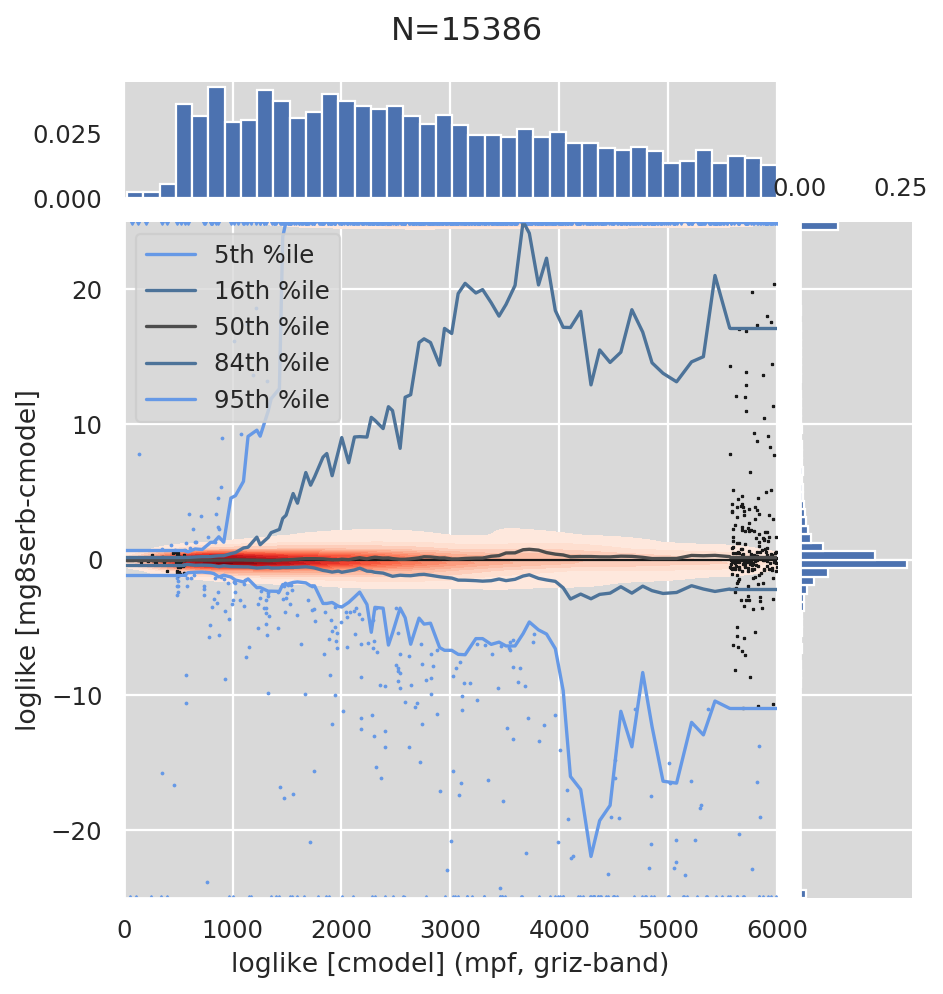

Plotting models ('cmodel', 'mg8serb') plot time
Failed to read data['griz']['cmodel']['mpf']['time'] and/or data['griz']['mg8serb']['mpf']['time'] due to KeyError('time')
Plotting models ('cmodel', 'mg8serb') plot mag


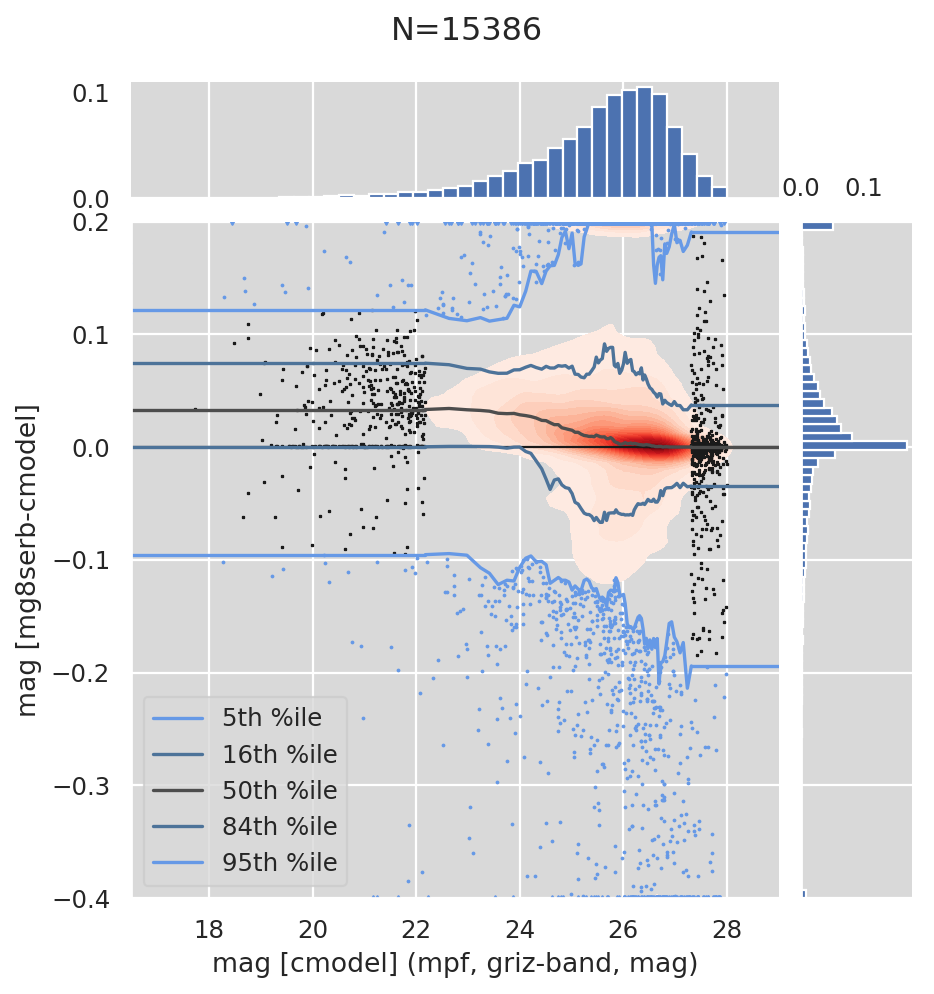

Plotting models ('cmodel', 'mg8serb') plot mag_bright


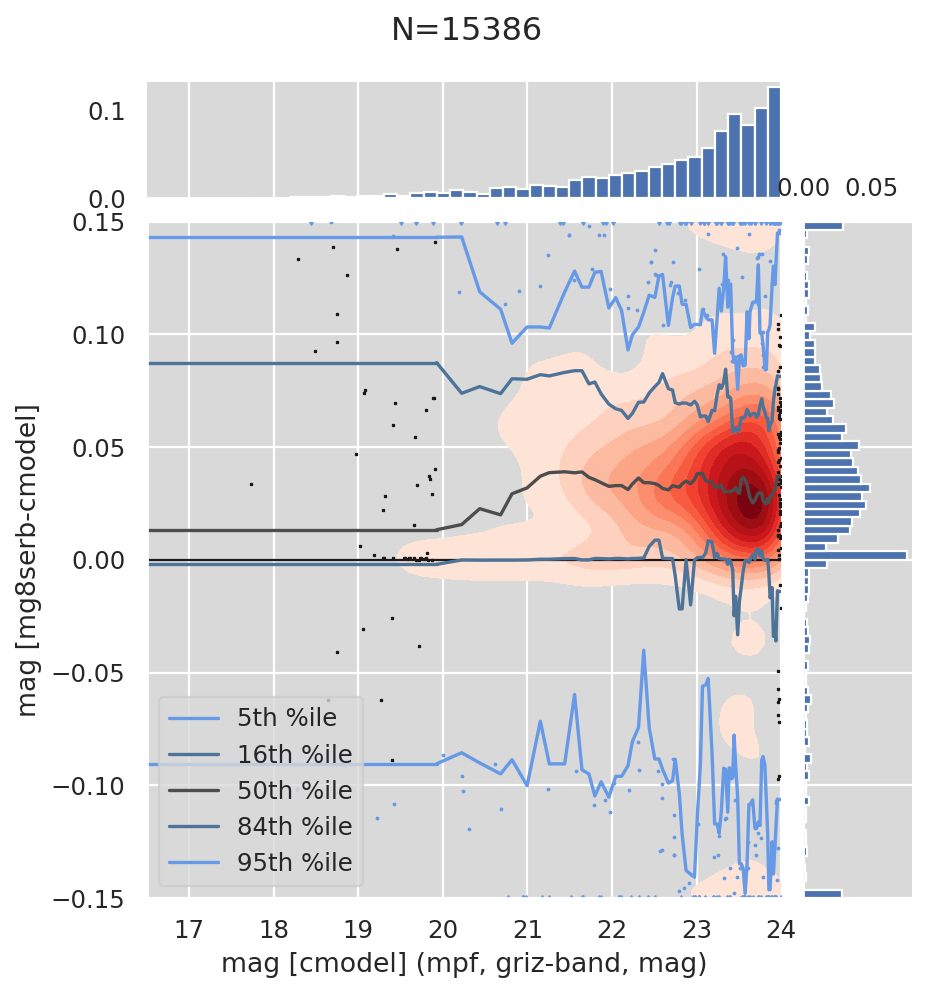

In [11]:
# Plot MPF CModel vs Sersic (griz)
plot_models_algo(data, "griz", "mpf", ("cmodel", "mg8serb"), columns_plot, columns_plot_size_algo)

## Comparing griz-band MultiProFit MG Sersic initialization methods

As before, these are comparing only the i-band parameters, although griz are fit simultaneously.
mg8serb is initialized from the best fit out of the gauss, exp. and dev. fits, which are prerequisites for CModel.
mg8serm is initialized directly from the moments with n_ser=1 (exp.). This could be improved.

This is to test whether it is possible to initialize Sersic fits directly from the moments without having run any fixed-n fits (i.e. without running CModel).

Plotting models ('mg8serb', 'mg8serm') plot loglike


/software/lsstsw/stack_20191101/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in subtract


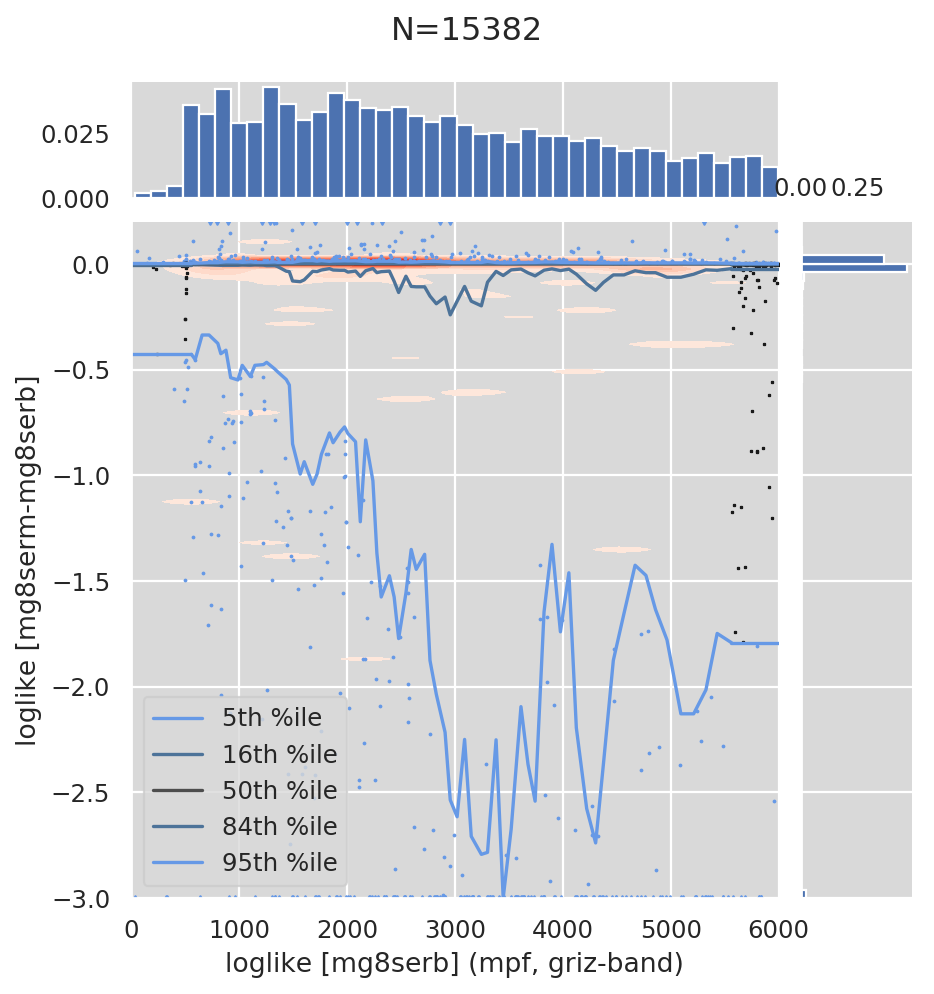

Plotting models ('mg8serb', 'mg8serm') plot time


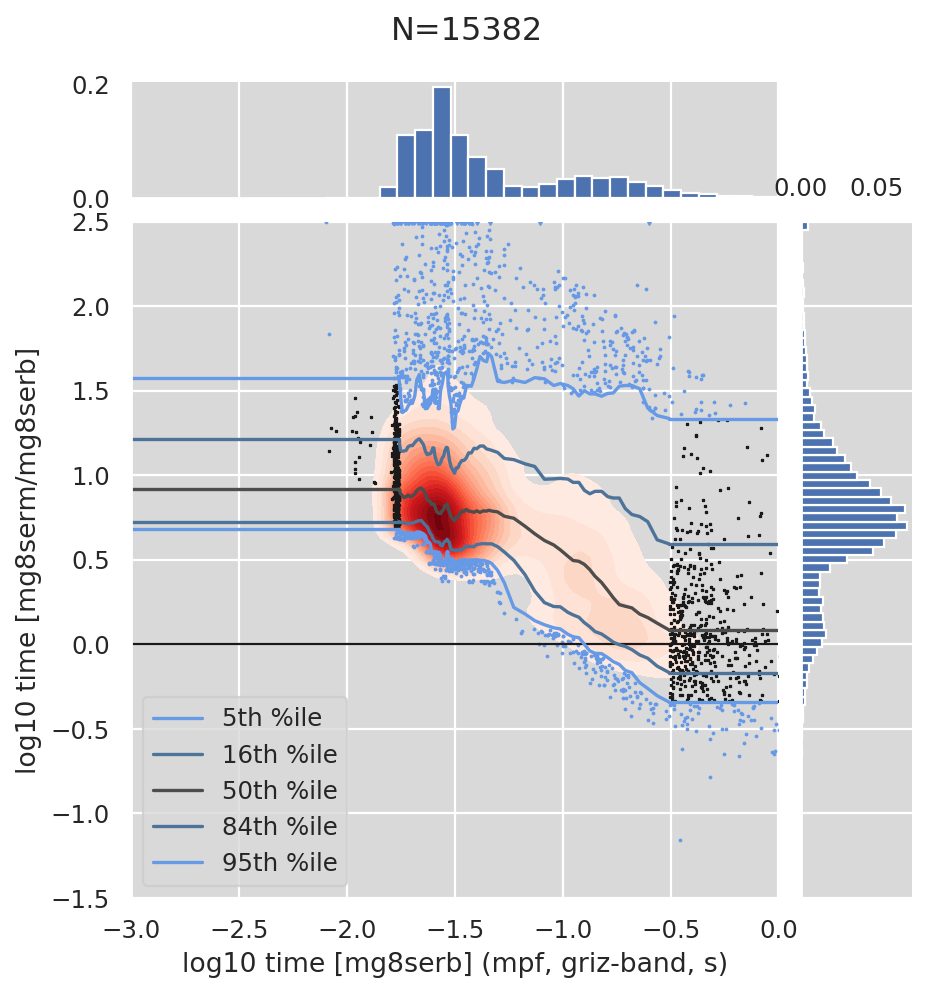

Plotting models ('mg8serb', 'mg8serm') plot mag


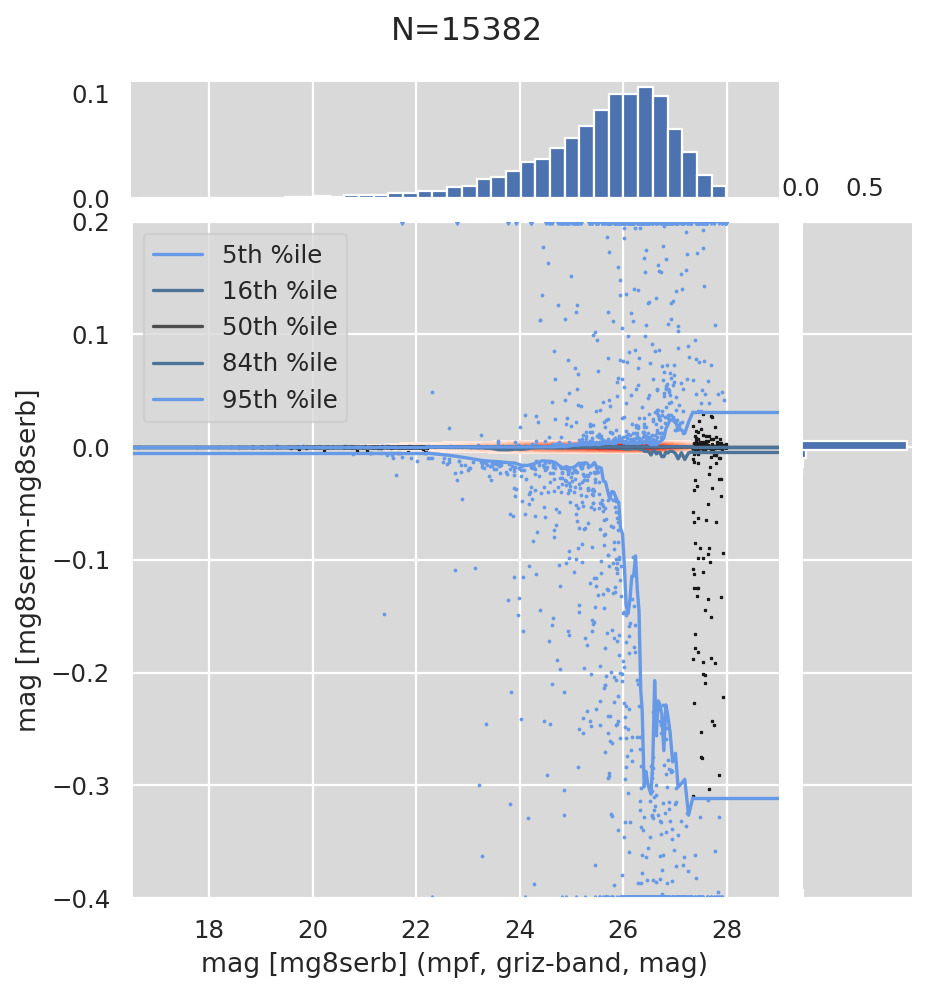

Plotting models ('mg8serb', 'mg8serm') plot mag_bright


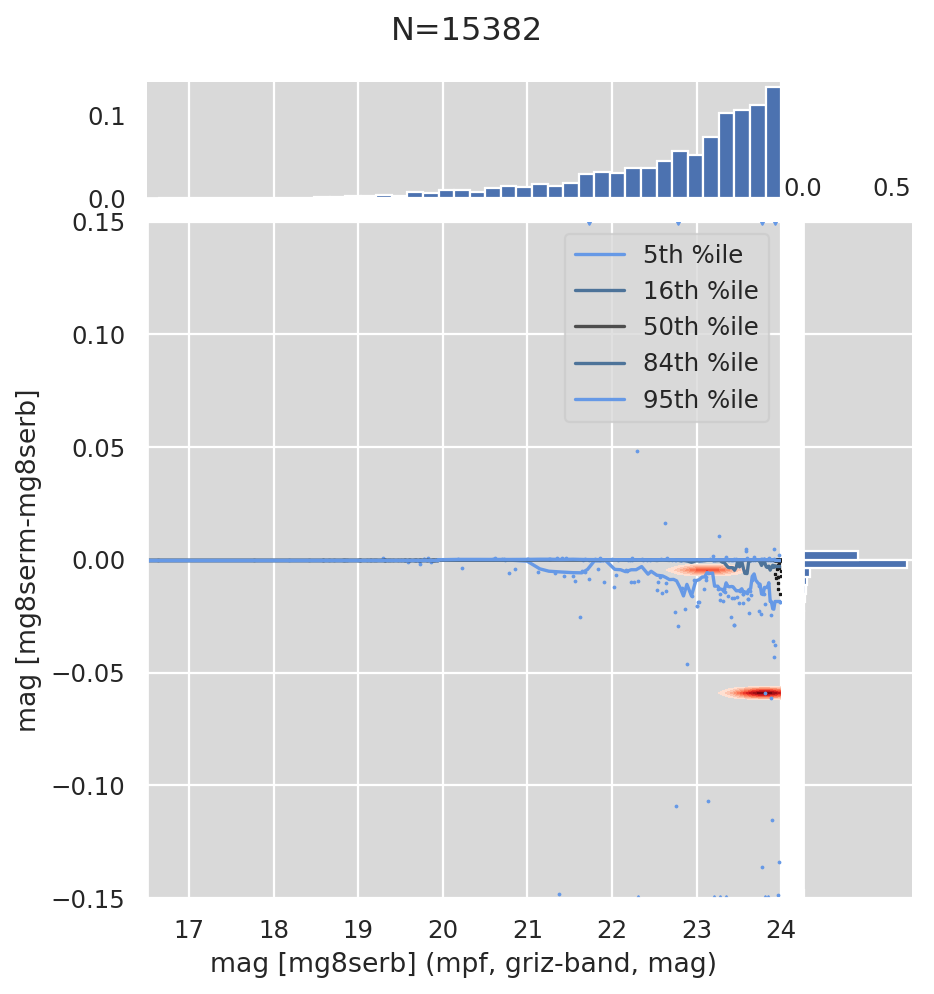

Plotting models ('mg8serb', 'mg8serm') plot reff


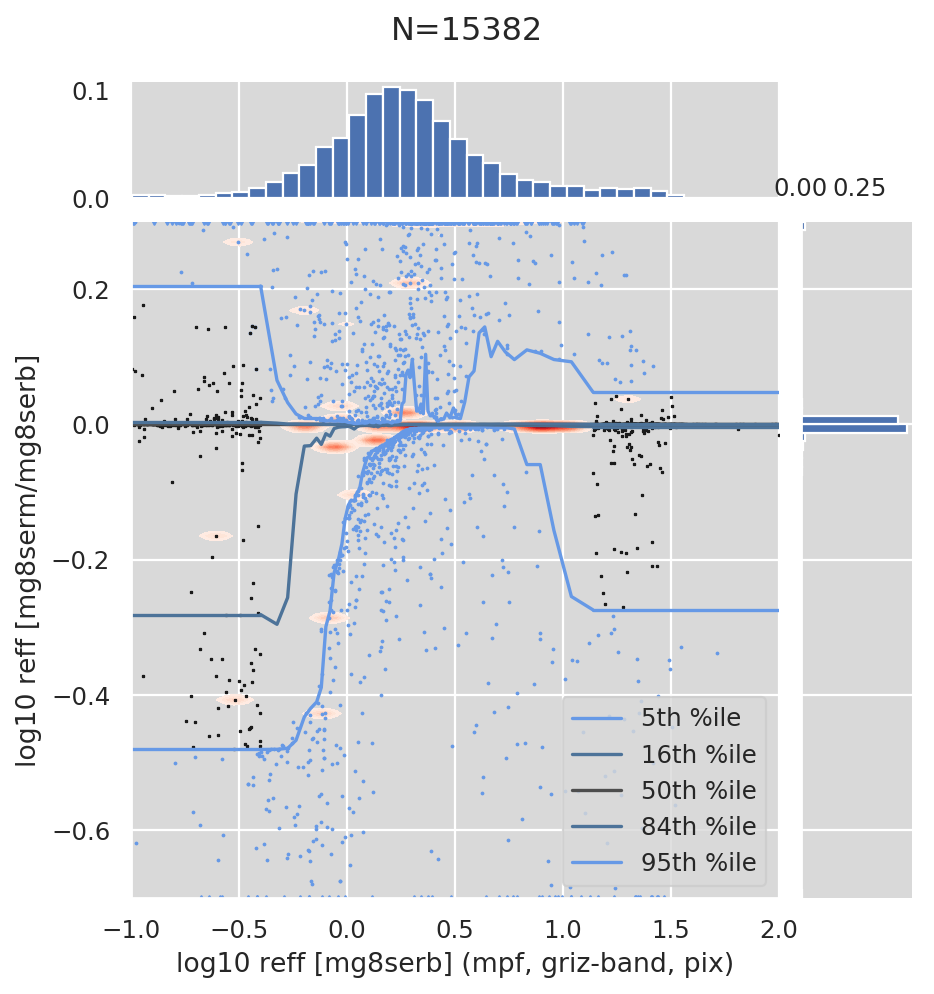

Plotting models ('mg8serb', 'mg8serm') plot mag_reff_mmf


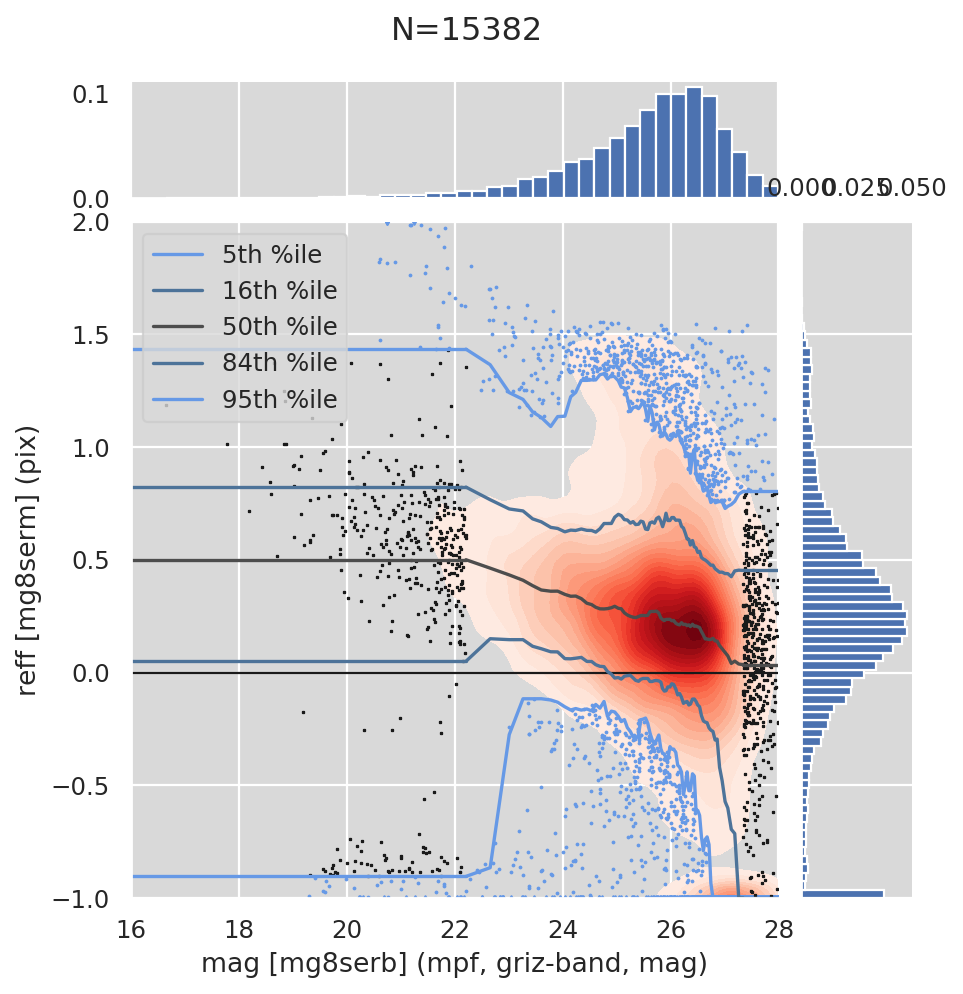

Plotting models ('mg8serb', 'mg8serm') plot mag_reff_mpf


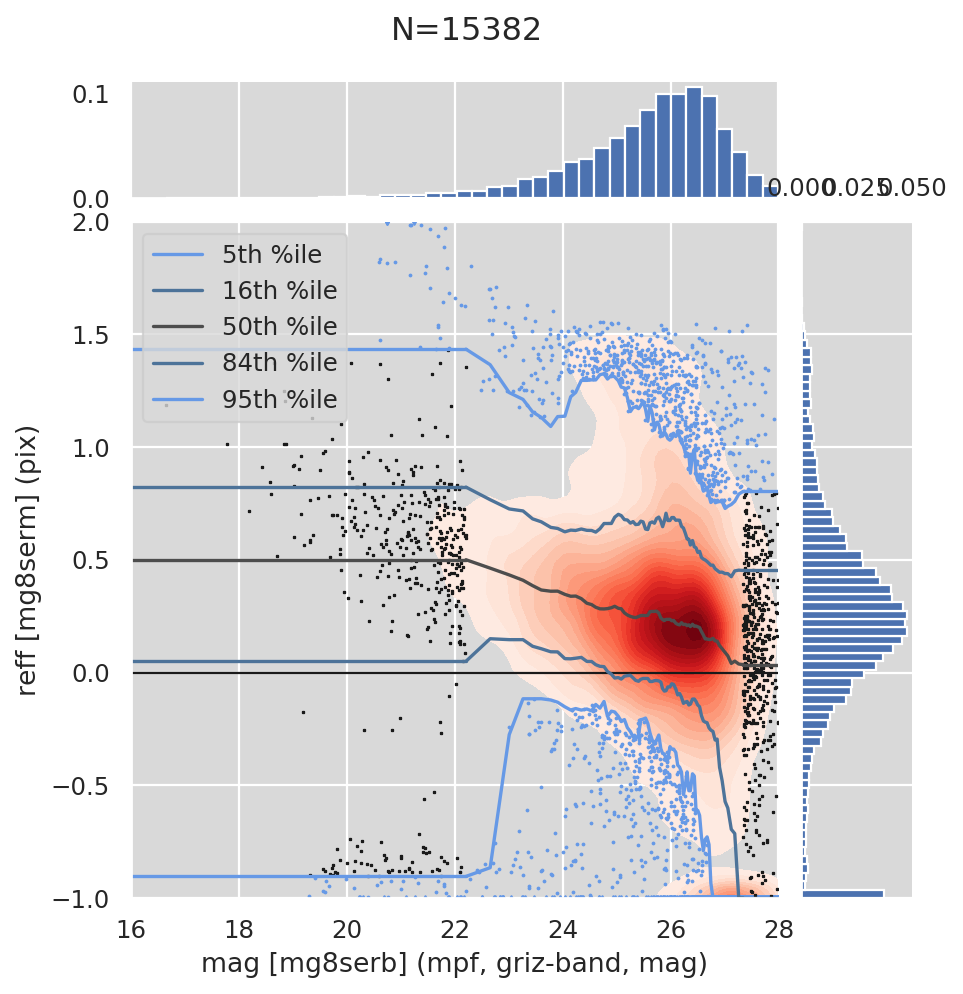

In [12]:
# Plot MPF Sersic with different initialization
columns_plot["time"] = dict(postfix="", log=True, ratio=True, limx=(-2.3, 0.7), limy=(-1., 3.))
limy = columns_plot["loglike"]["limy"], columns_plot_size["reff"]["limy"]
columns_plot["loglike"]["limy"] = (-3, 0.2)
columns_plot_size["reff"]["limy"] = (-0.7, 0.3)
plot_models_algo(data, "griz", "mpf", ("mg8serb", "mg8serm"), {'loglike': columns_plot['loglike']}, columns_plot_size_algo)
columns_plot["loglike"]["limy"], columns_plot_size["reff"]["limy"] = limy

## Comparing HSC-[IZ] with HST-F814W fits
Here the HST fits are for isolated HSC sources only (and hence have fewer bright galaxies since they tend to be larger and are thus more likely to be blended). This is to avoid having to deblend the HST sources.
This does mean that some fraction of the sources will be:
    - artifacts in one (usually HSC, but mainly because I'm not checking all of the relevant flags before passing or using the masks),
    - undetected blends in HSC,
    - undetected in one or more bands, usually HST, but potentially HSC-I/Z for red/blue sources, respectively.

In [13]:
# Define function for HSC vs HST plots
def plot_mpf_model_hsc_vs_hst(model, model_reff=None, plot_only_size_mag=False, reff_min=None, lims_mag=None):
    if lims_mag is None:
        lims_mag = (19.5, 25.5)
    lim_x = lims_mag
    data_hst = data['f814w'][model]['mpf']
    data_hsc = data['iz'][model]['mpf']
    if model_reff is None:
        model_reff = model
        data_hst_reff, data_hsc_reff = data_hst, data_hsc
    else:
        data_hst_reff = data['f814w'][model]['mpf']
        data_hsc_reff = data['iz'][model]['mpf']
    is_single_comp = model != "cmodel"
    mag_bright = 23
    x = data_hsc["mag_1"]
    cond = (x < lim_x[1]) & (x > lim_x[0])
    label_x = f"mag MPF-{model} [HSC-I]"
    flux_hsc = data_hsc["flux_1"] + data_hsc["flux_z_1"]
    flux_hst = data_hst["flux_1"]
    good = cond & np.isfinite(flux_hsc) & np.isfinite(flux_hst) & data_hsc['good']
    if reff_min is not None:
        good = good & (data_hst_reff["reff_1"] > reff_min/0.03)
    y = np.log10(flux_hsc[good]/flux_hst[good]) - 0.88
    x_good = x[good]
    n_good = np.count_nonzero(good)
    if is_single_comp:
        reff_hst = np.log10(data_hst_reff["reff_1"][good]*0.03)
        reff_hsc = np.log10(data_hsc_reff["reff_1"][good]*0.168)
        if not plot_only_size_mag:
            big_hst = reff_hst > -0.3
            big_hsc = reff_hsc > -0.3
            big = big_hst | big_hst
            num_big = np.count_nonzero(big)
            print(f'n_big_hst,hsc={np.count_nonzero(big_hst)},{np.count_nonzero(big_hsc)}; ' 
                  f'frac_big={num_big}/{n_good}={num_big/n_good:.3e}')
            y = reff_hsc - reff_hst
            prefix = '$R_{eff, HSC|HST}$ > 0.5"'
            plotjoint_running_percentiles(
                x_good[big], y[big], ndivisions=10, nbinspan=3, **argspj,
                labelx=label_x, labely="log10($R_{eff,HSC}$/$R_{eff,HST}$)",
                limx=lim_x, limy=(-0.3, 0.3), title=f'{prefix}, N={num_big}')
        plotjoint_running_percentiles(
            x_good, reff_hst, ndivisions=10, nbinspan=3, **argspj,
            labelx=label_x, labely='log10($R_{eff,HST}$/")',
            limx=lim_x, limy=(-2.3, 0.6), title=f'N={n_good}')
        if not plot_only_size_mag:
            plotjoint_running_percentiles(
                reff_hst, y, ndivisions=10, nbinspan=3, **argspj,
                labelx='log10($R_{eff,HST}$/")', labely="log10($R_{eff,HSC}$/$R_{eff,HST}$)",
                limx=[-1.5, 1], limy=(-0.32, 0.68), title=f'N={n_good}')
            big_bright = big & (x_good < mag_bright)
            plotjoint_running_percentiles(
                reff_hst[big_bright], y[big_bright], ndivisions=10, nbinspan=3, **argspj,
                labelx='log10($R_{eff,HST}$/")', labely="log10($R_{eff,HSC}$/$R_{eff,HST}$)",
                limx=[-0.32, 0.58], limy=(-0.15, 0.15), title=f'{prefix} & mag < {mag_bright}, N={np.count_nonzero(big_bright)}')
            n_ser = data_hsc.get("nser_1", None)
            if n_ser is not None:
                n_ser = n_ser[good]
                good_size = (reff_hst > 0) & (reff_hsc > 0)
                prefix = '$R_{eff, HSC&HST}$ > 1"'
                y = np.log10(n_ser[good_size]/data_hst["nser_1"][good][good_size])
                plotjoint_running_percentiles(
                    x_good[good_size], y, ndivisions=10, nbinspan=3, **argspj,
                    labelx=label_x, labely="log10($n_{ser,HSC}$/$n_{ser,HST}$)",
                    limx=lim_x, limy=(-0.6, 0.6), title=f'{prefix}, N={np.count_nonzero(good_size)}')

n_big_hst,hsc=1627,2718; frac_big=1627/18264=8.908e-02


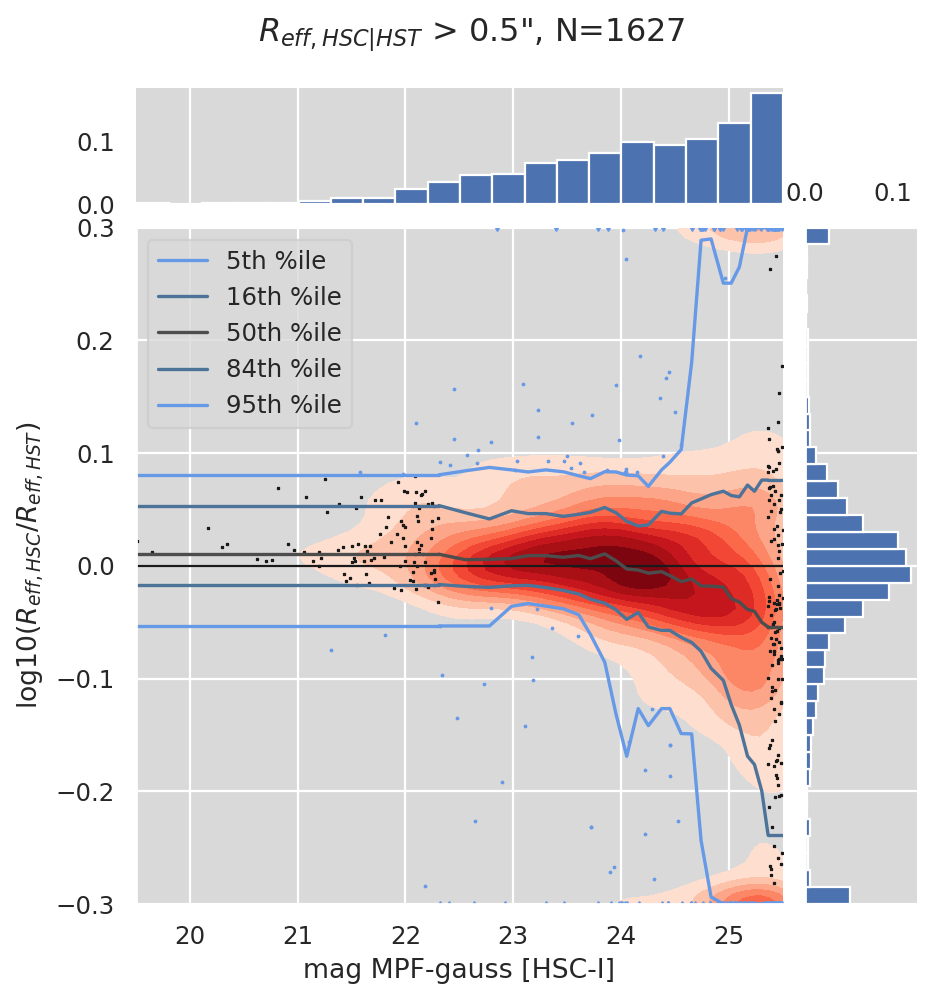

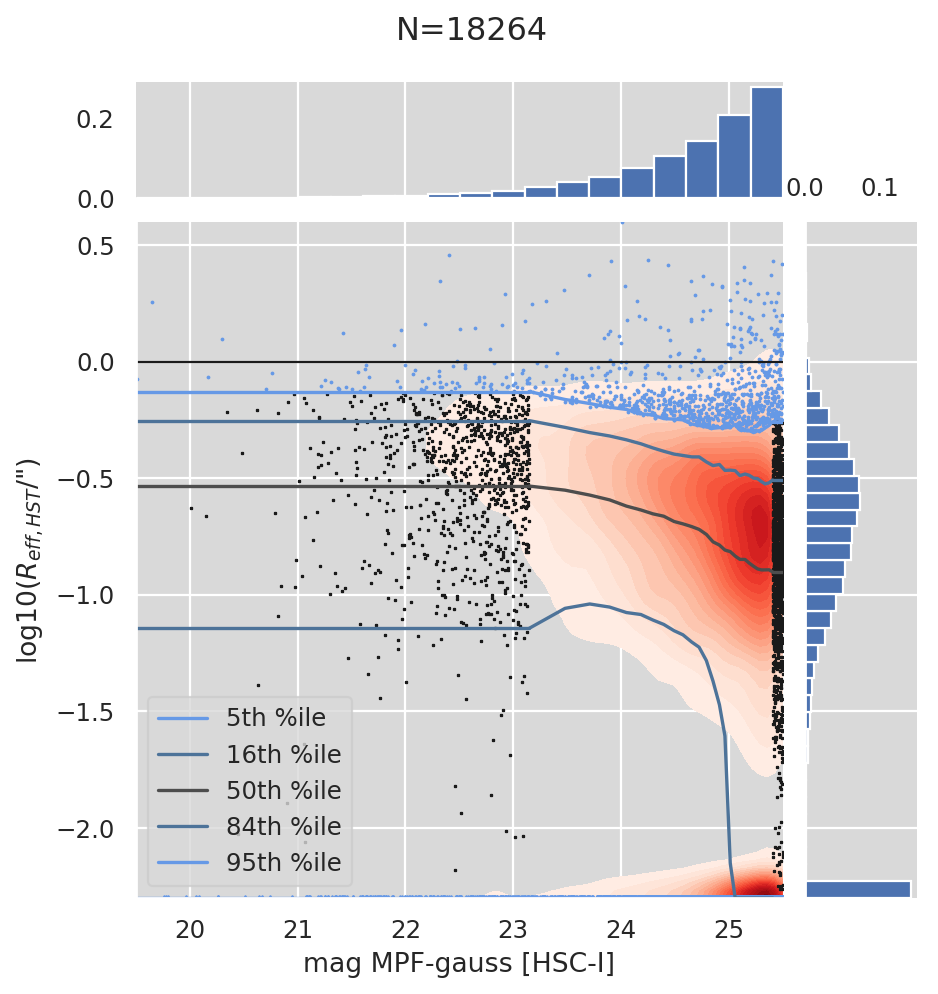

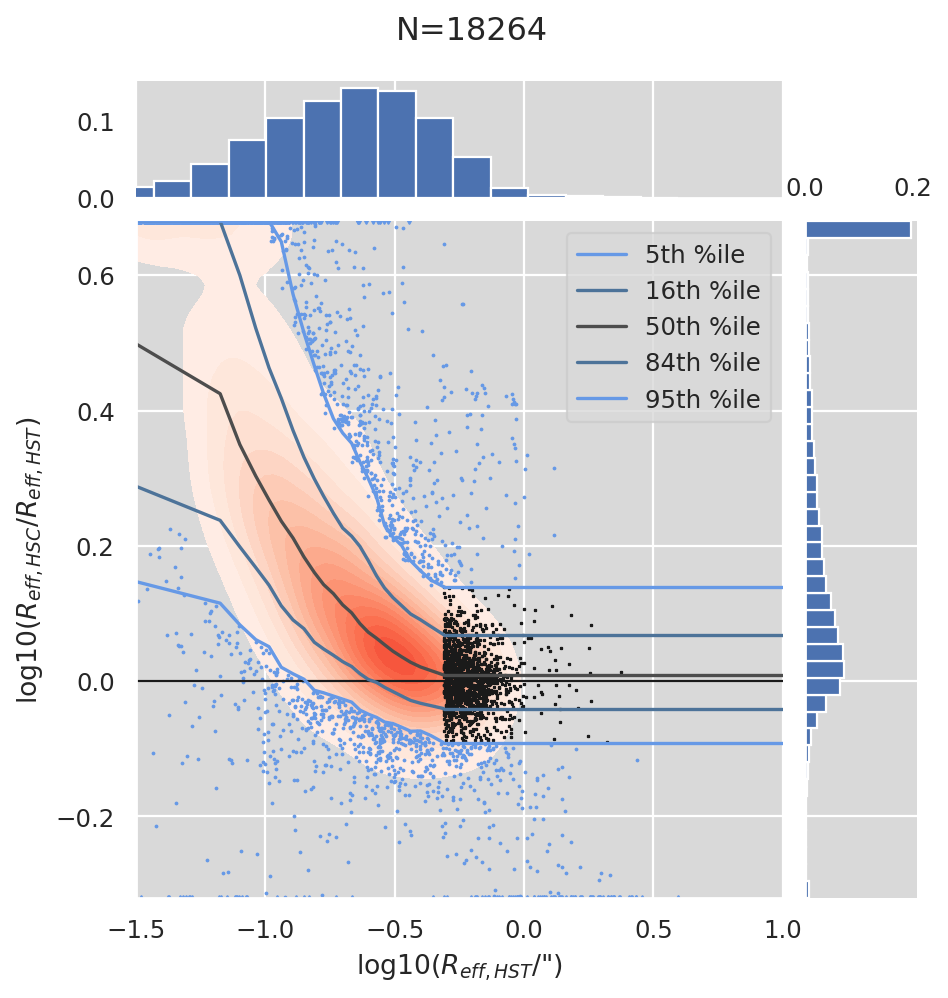

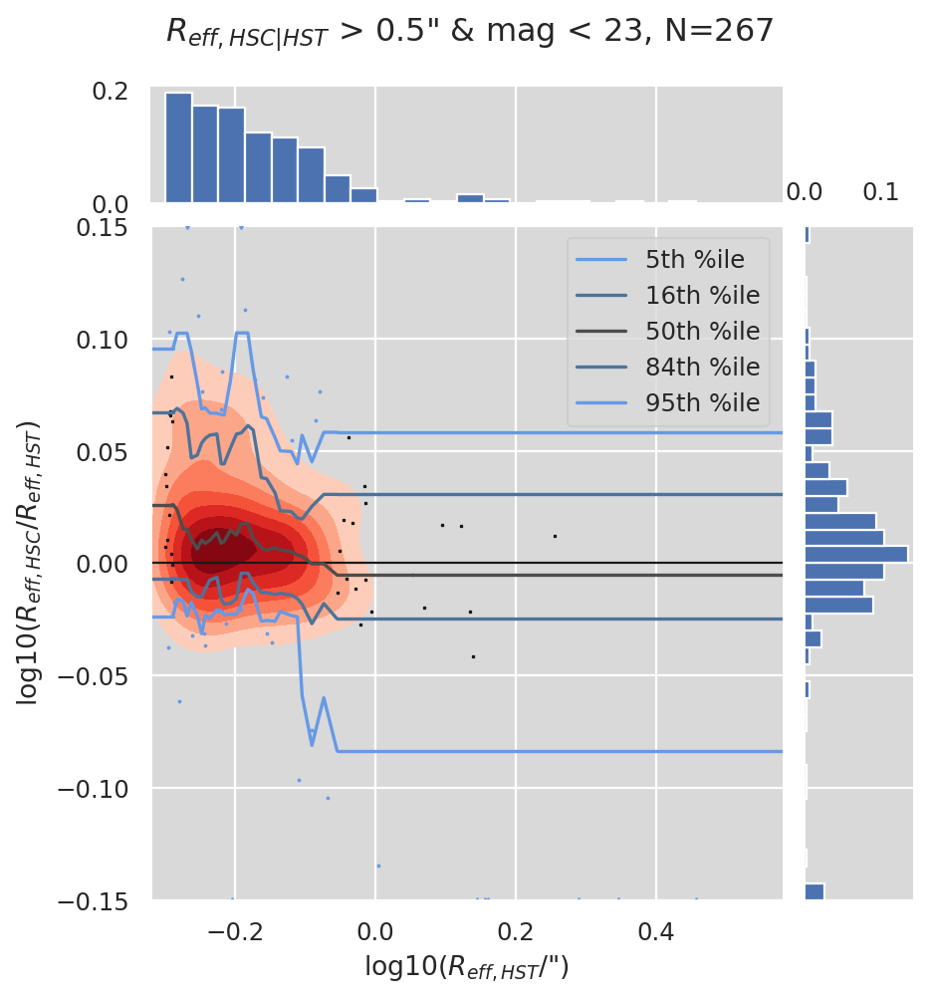

Gauss mag vs Sersic reff


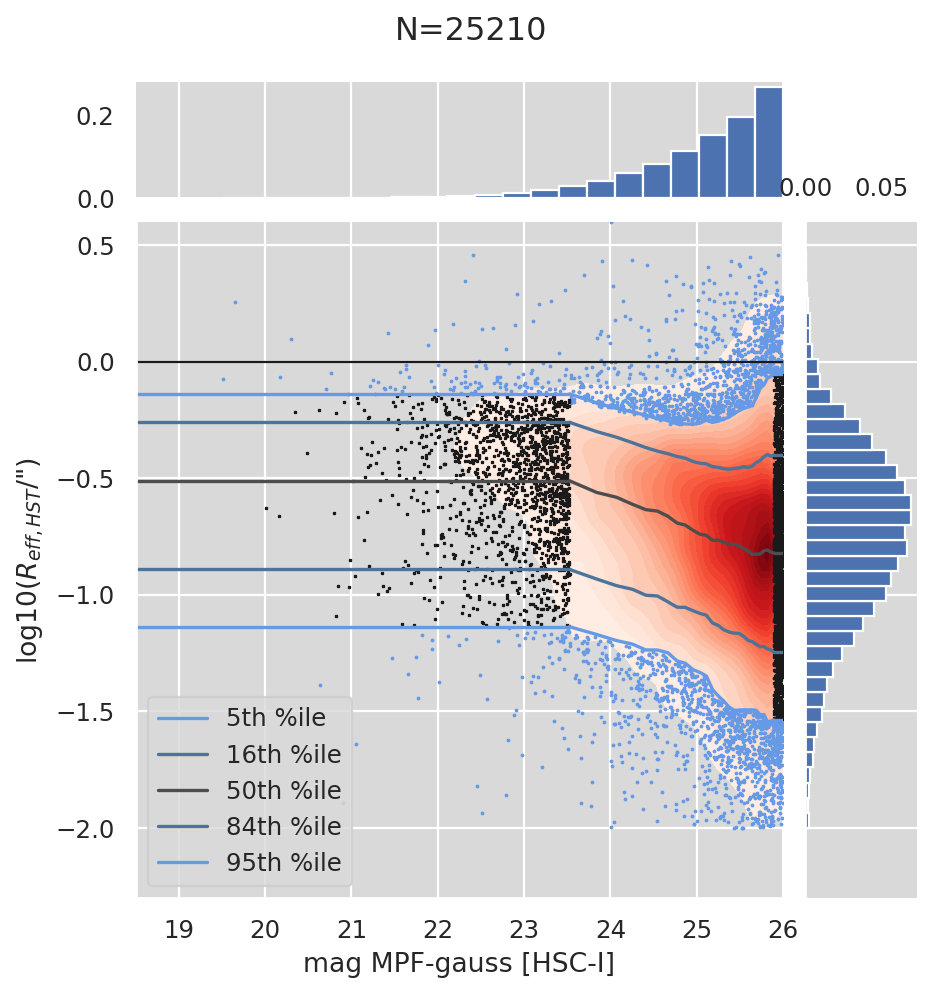

In [14]:
# Plot the presumably robust Gaussian fits
plot_mpf_model_hsc_vs_hst("gauss")
plt.show()
print('Gauss mag vs Sersic reff')
plot_mpf_model_hsc_vs_hst("gauss", model_reff="mg8serb", plot_only_size_mag=True, reff_min=1e-2, lims_mag=(18.5, 26))

n_big_hst,hsc=2102,3134; frac_big=2102/18931=1.110e-01


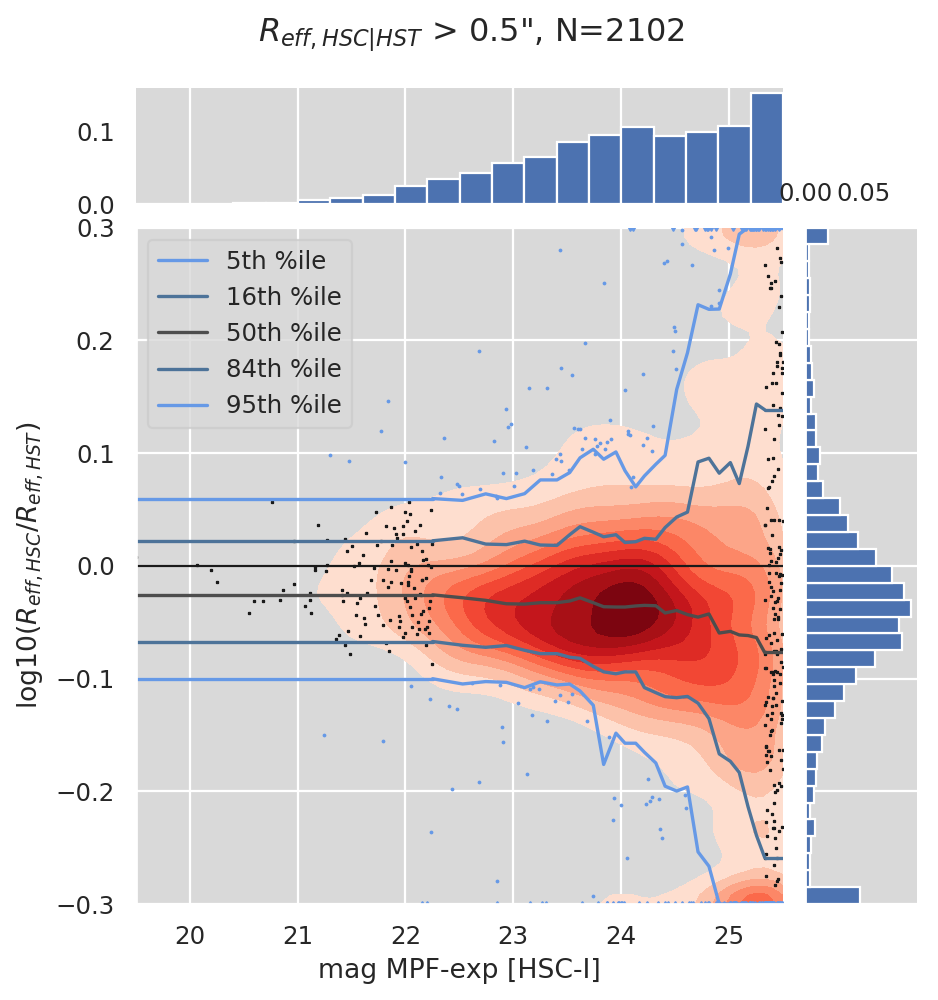

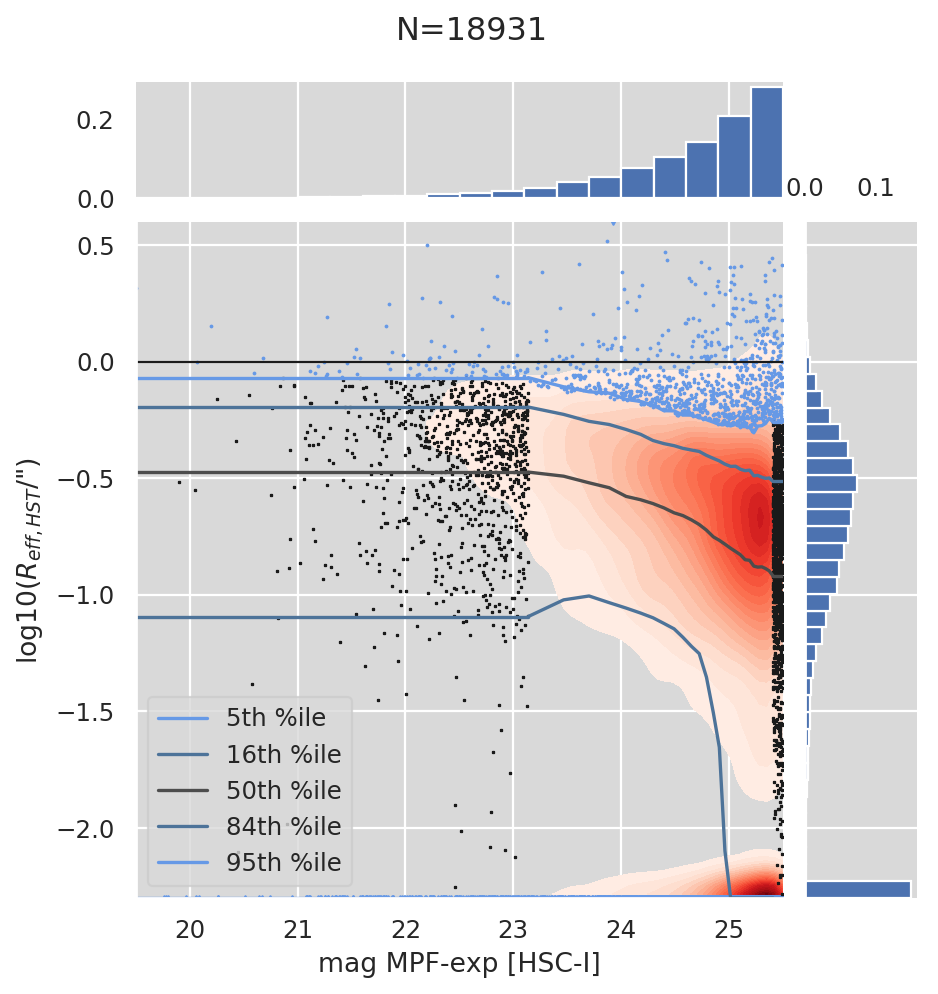

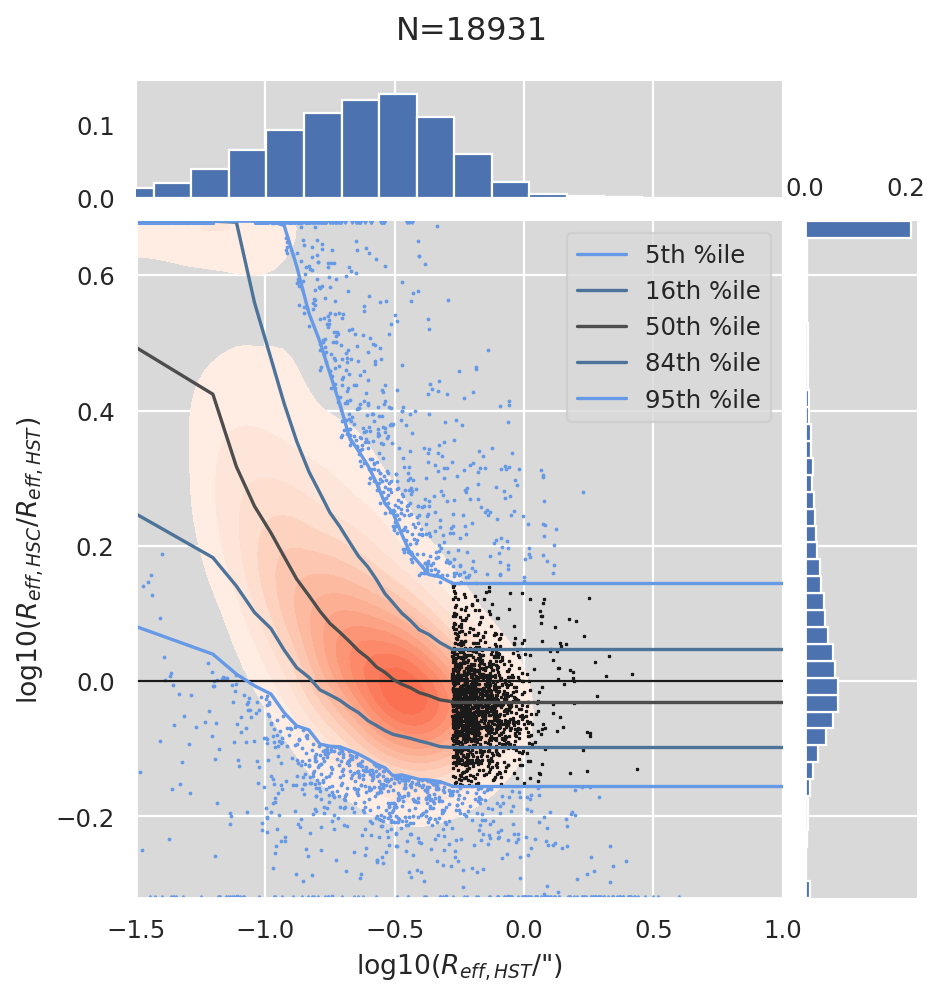

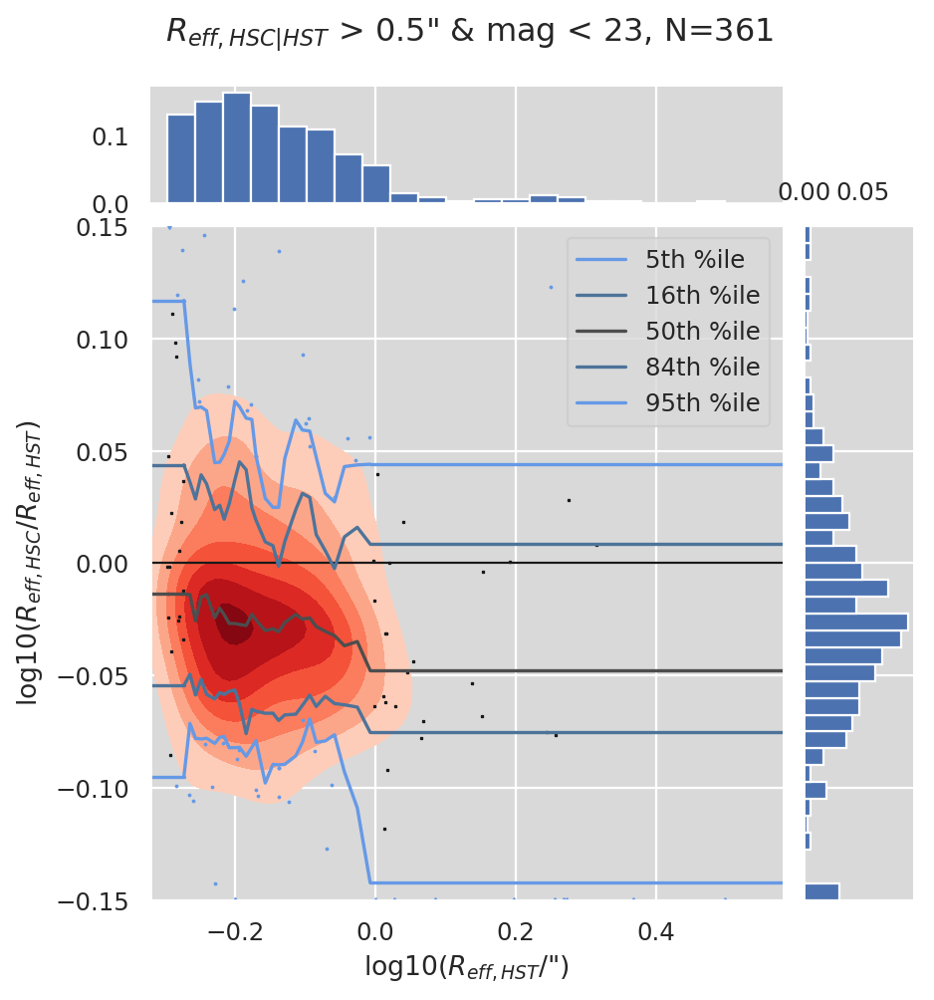

In [15]:
# Plot the hopefully still mostly robust exponential fits
plot_mpf_model_hsc_vs_hst("exp")

n_big_hst,hsc=2352,4507; frac_big=2352/20385=1.154e-01


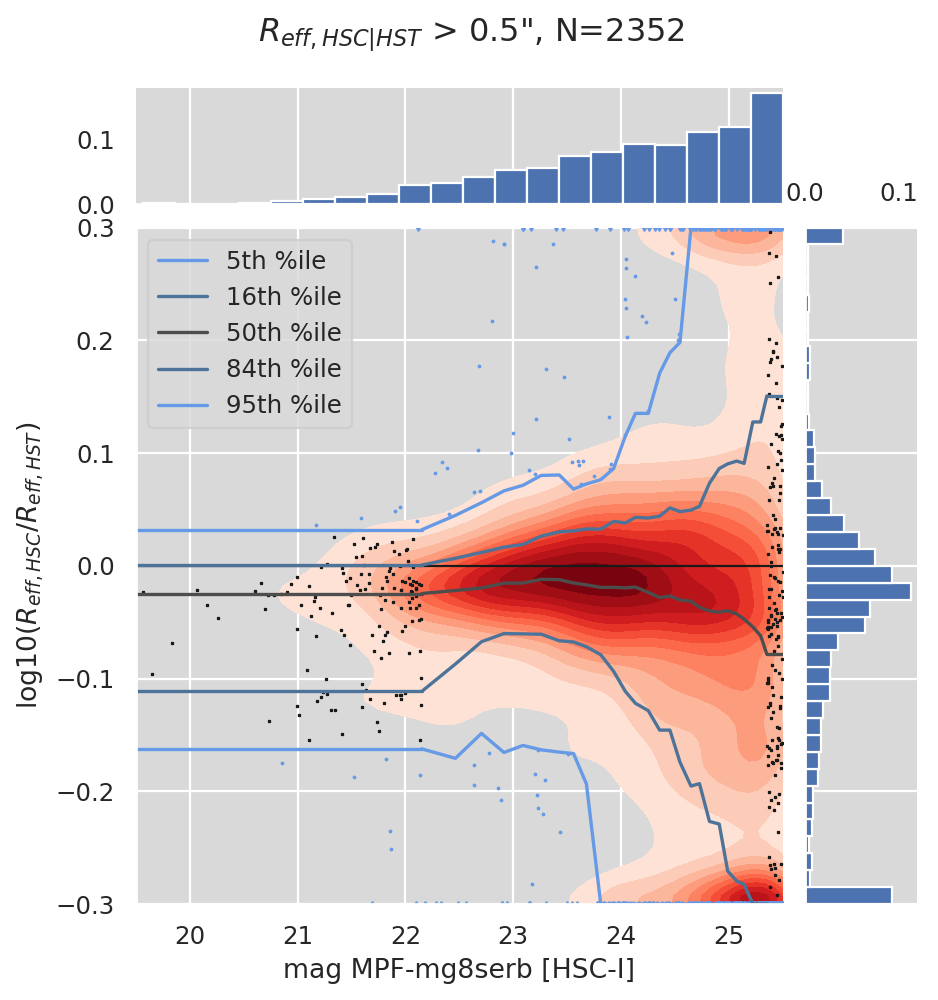

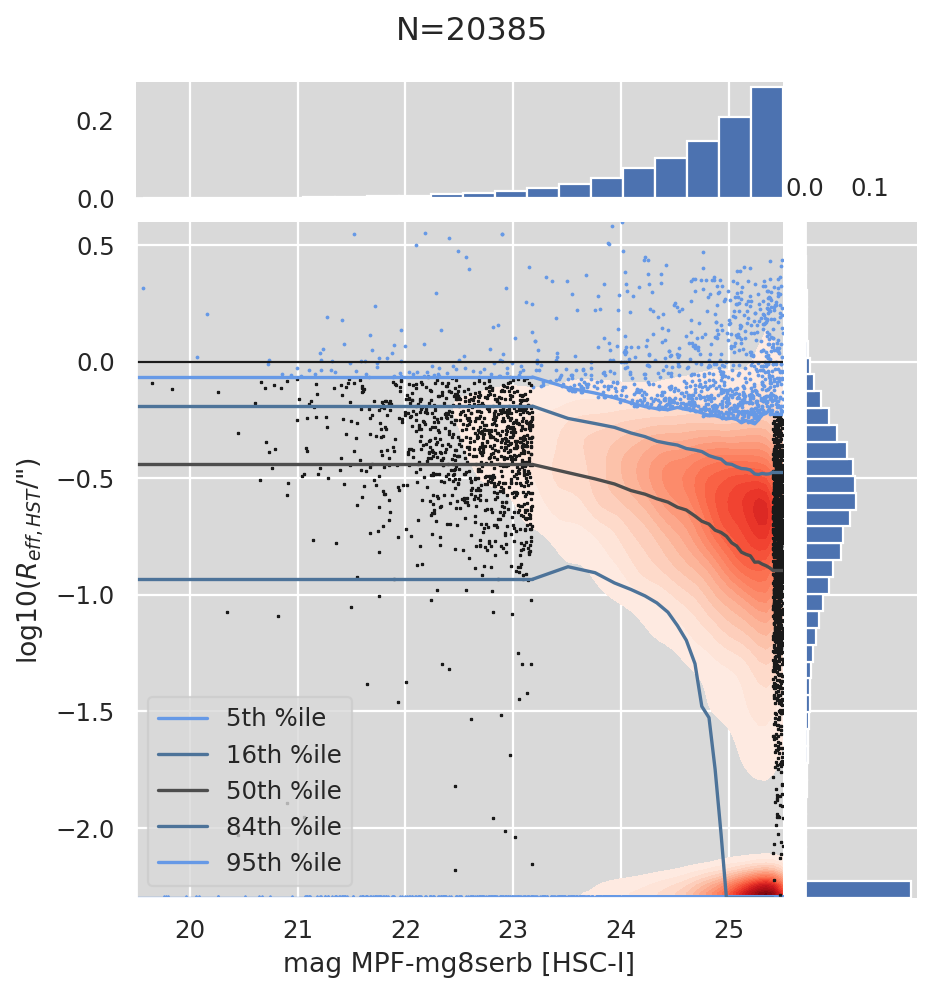

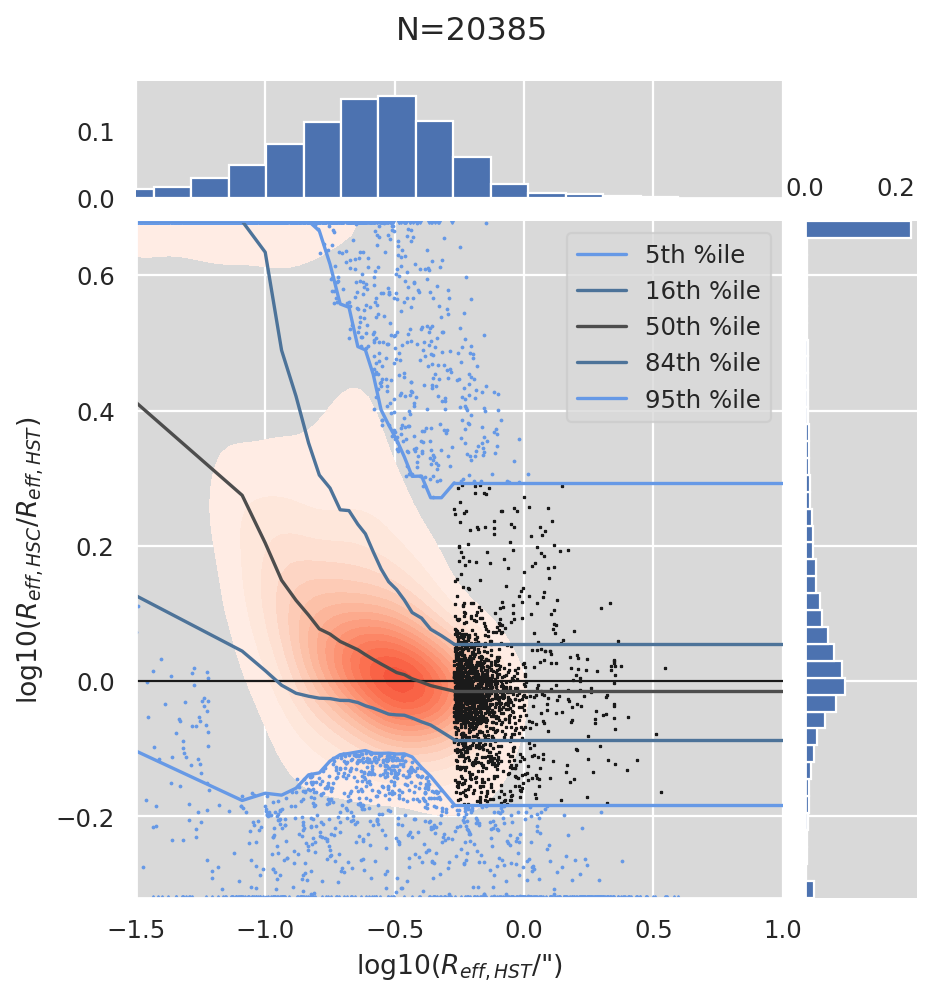

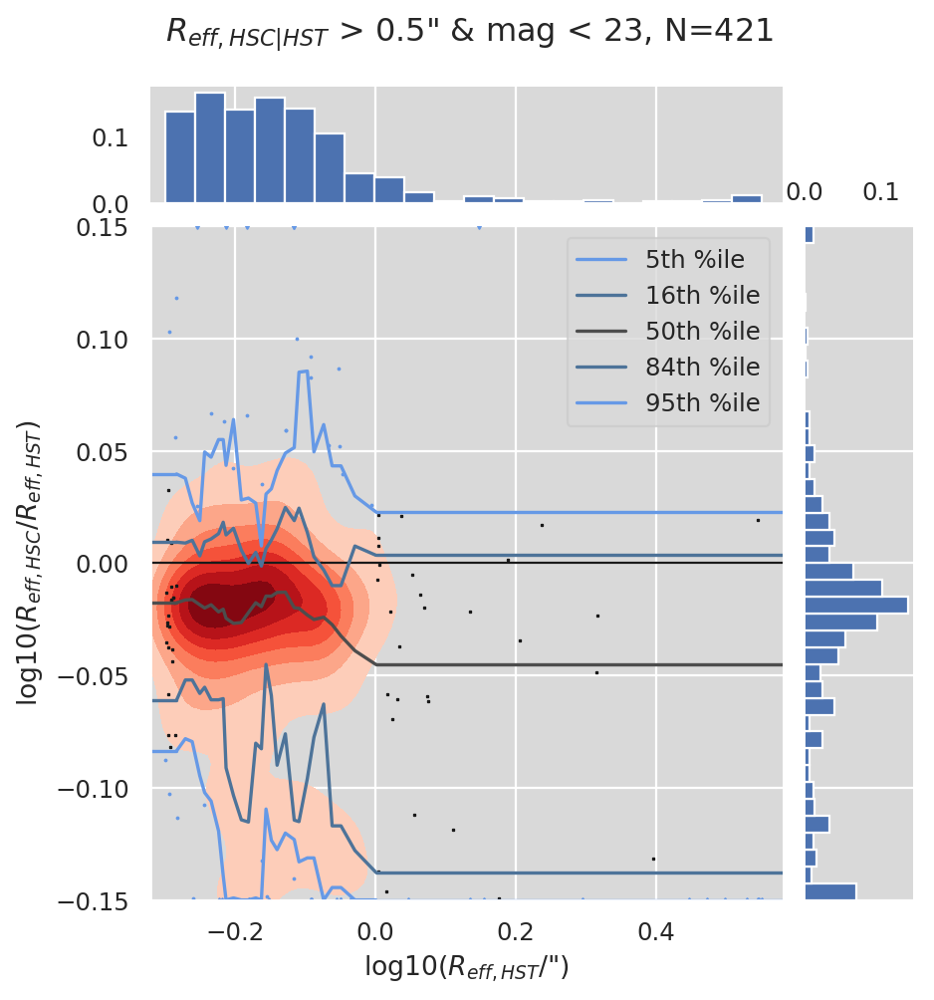

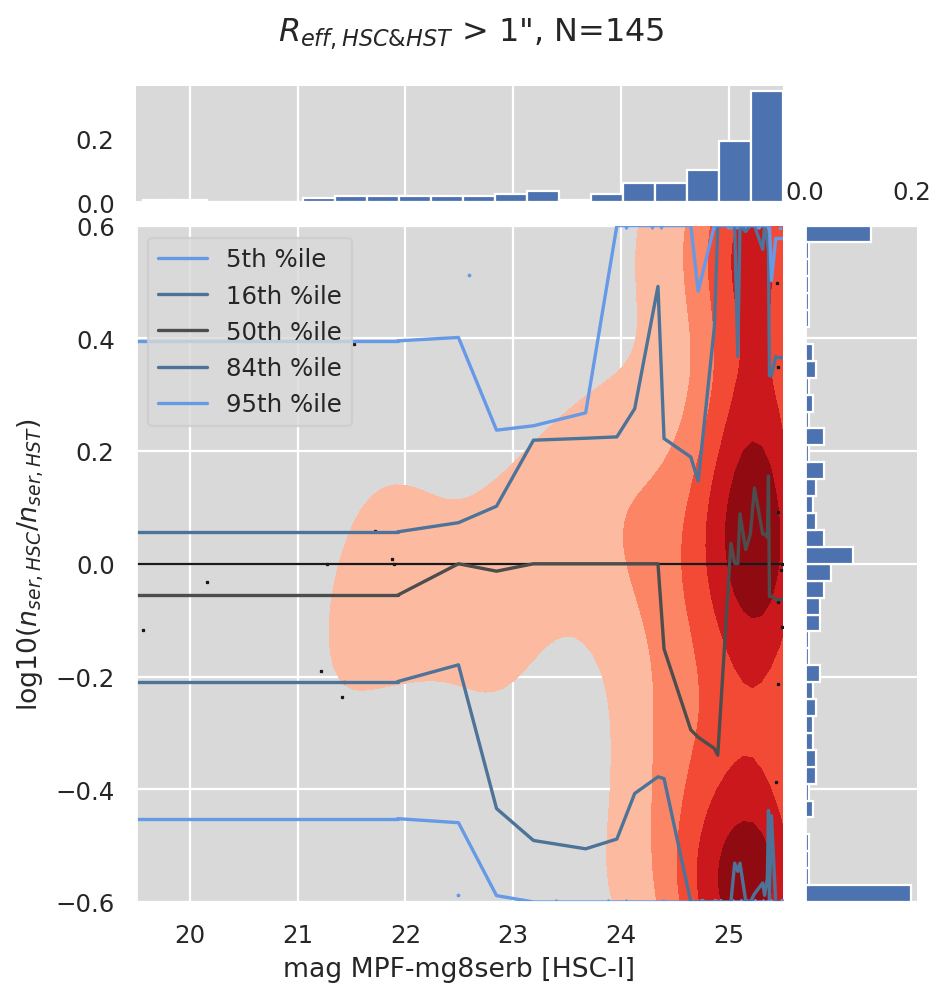

In [16]:
# Plot Sersic fits, including Sersic index
plot_mpf_model_hsc_vs_hst("mg8serb")

## Investigating Discrepancies
Why don't HSC and HST match for bright sources which should be fairly reliably recovered?

In [17]:
# Load the Butler for the latest HSC re-run, and all of the overlapping COSMOS HST images
butler = Butler("/datasets/hsc/repo/rerun/RC/w_2019_38/DM-21386/")
cat = cats['iz']
rad2deg = 180/np.pi
ra_range, dec_range = [(np.nanmin(x)*rad2deg, np.nanmax(x)*rad2deg) for x in [cat[f'coord_{y}'] for y in ['ra', 'dec']]]
tiles = get_tiles_HST_COSMOS()
tiles = get_tiles_overlapping_HST(ra_range, dec_range, tiles)
exposures_hst = get_exposures_HST_COSMOS(ra_range, dec_range, tiles, "/project/dtaranu/cosmos/hst/COSMOS_25.2_training_sample")
calexps = {}
meas = {}

In [18]:
# Cache the calexps and original measurement catalogs with bboxes
# It would have been smarter to keep the whole catalog as a SourceCatalog but concatenating astropy tables is so much easier
model = 'mg8serb'
data_hst = data['f814w'][model]['mpf']
data_hsc = data['iz'][model]['mpf']
safe = (data_hsc["mag_1"] > 20.5) & (data_hsc["mag_1"] < 23) & (data_hsc["reff_1"] > 3)
# Factor of two bigger
big_hsc = safe & (data_hsc["reff_1"]*0.168/(data_hst["reff_1"]*0.03) > 2)

row_big = np.nonzero(big_hsc)[0]
cat = cats['iz']
tract = 9813
#skymap = butler.get("deepCoadd_skyMap")[tract]
bands = ['HSC-Z', 'HSC-I', 'HSC-R']

/software/lsstsw/stack_20191101/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/astropy/table/column.py:991: RuntimeWarning: invalid value encountered in greater
  result = getattr(super(), op)(other)
/software/lsstsw/stack_20191101/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/astropy/table/column.py:991: RuntimeWarning: invalid value encountered in less
  result = getattr(super(), op)(other)


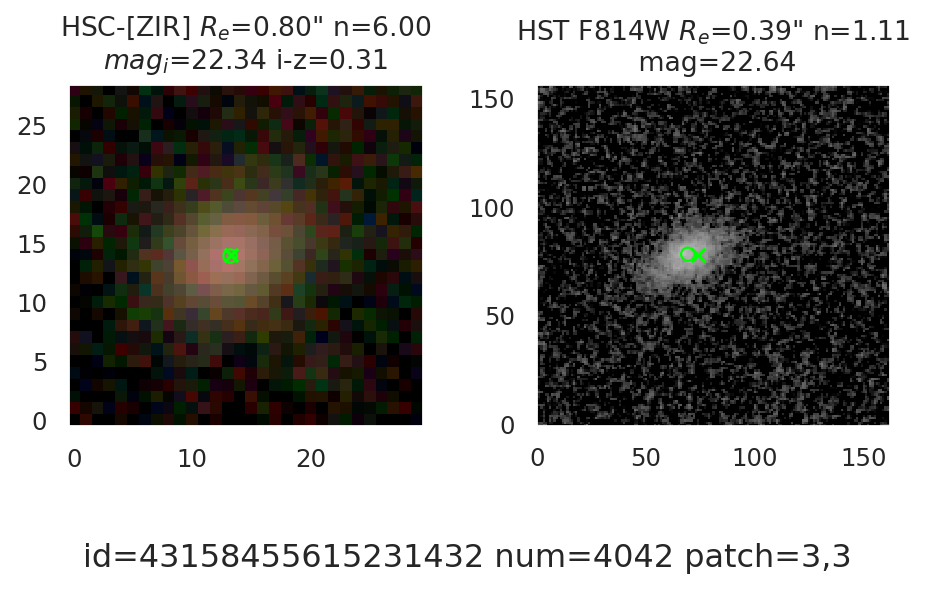

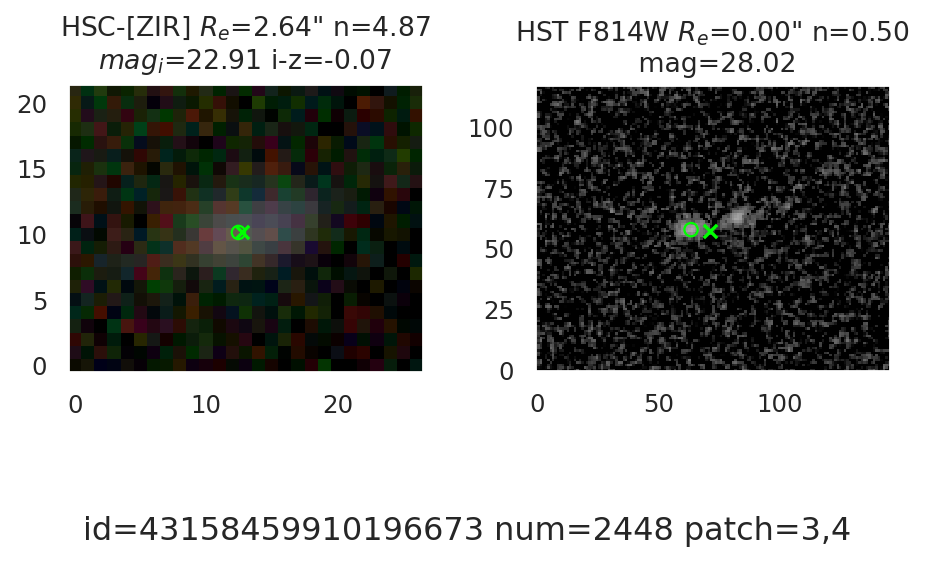

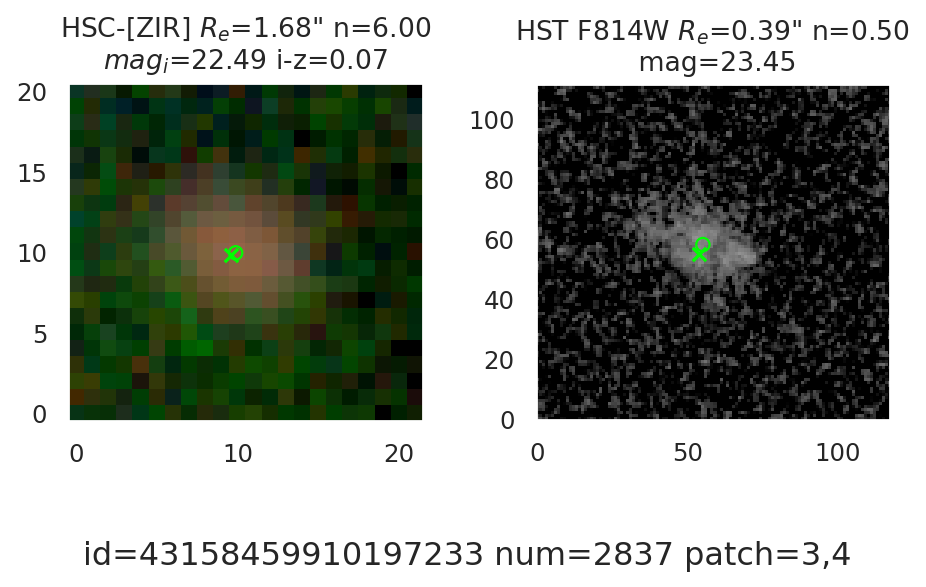

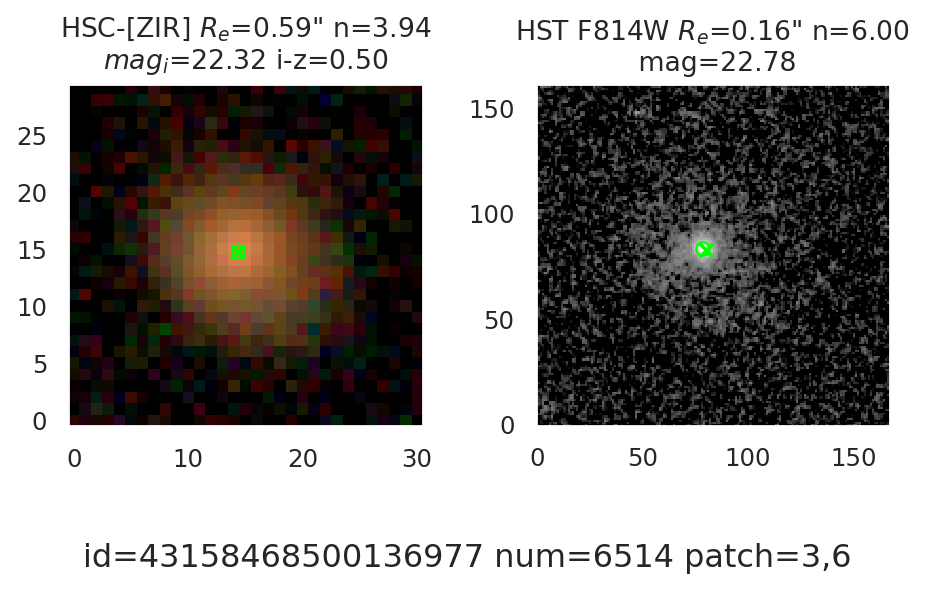

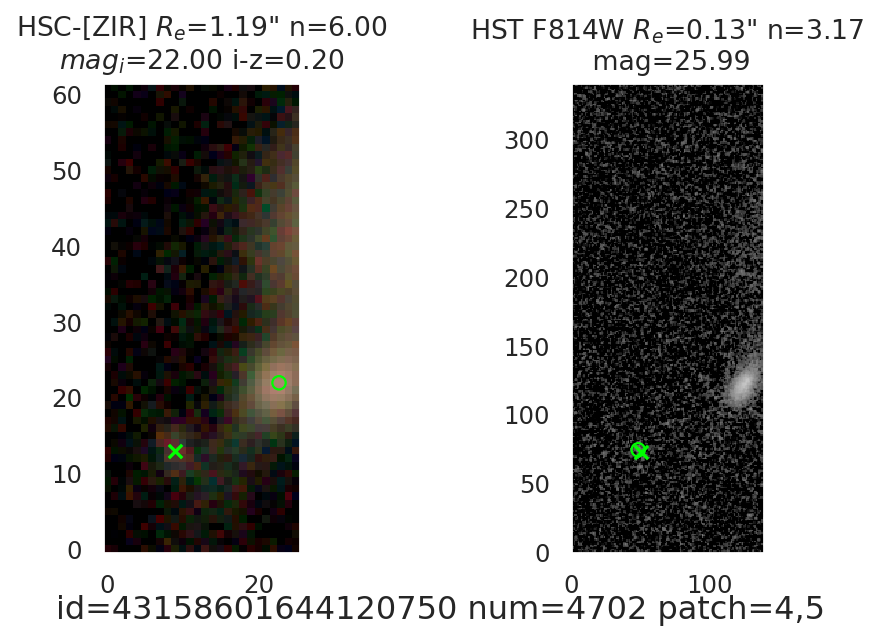

...

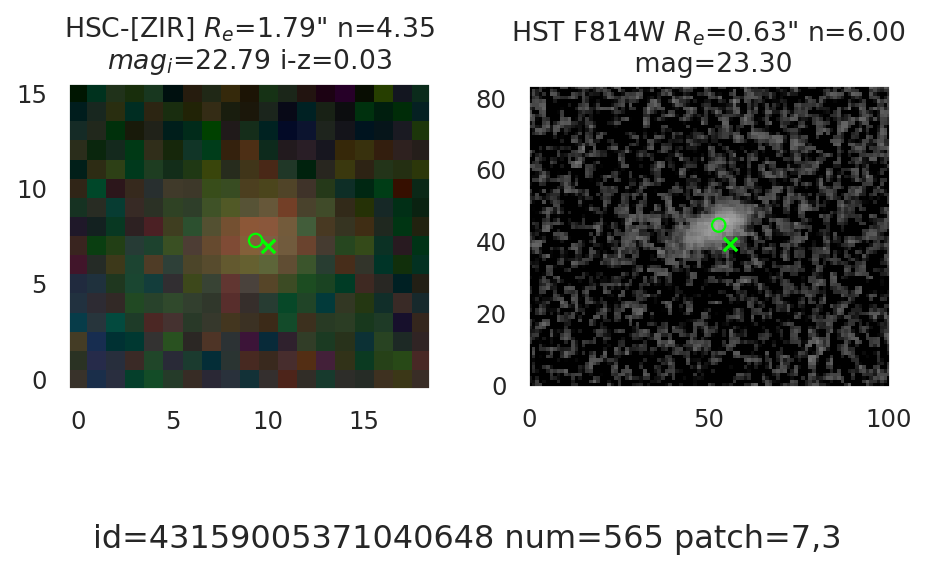

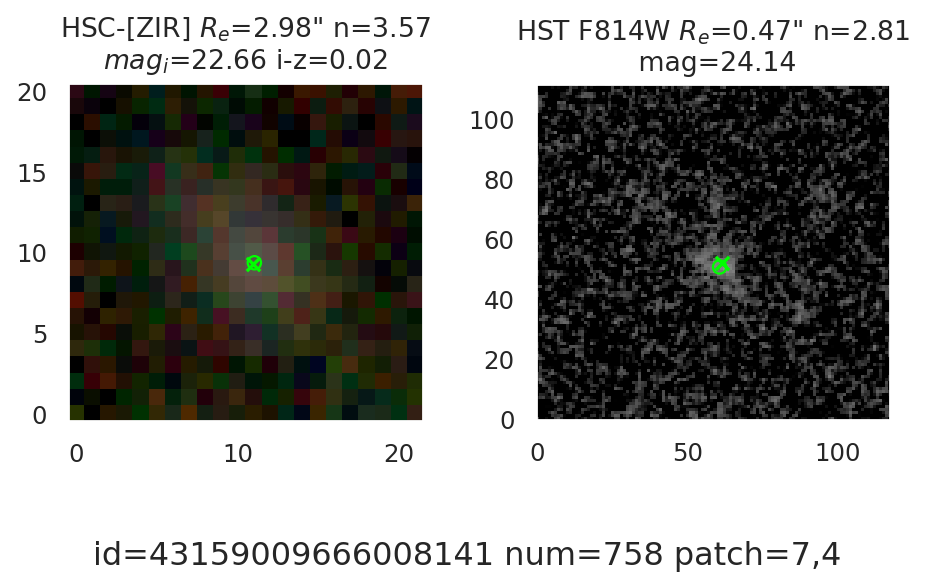

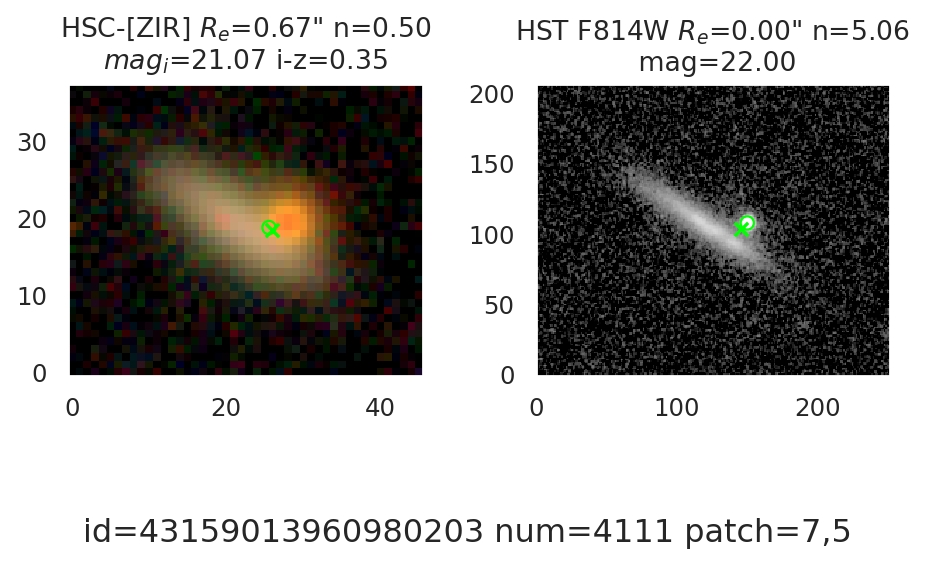

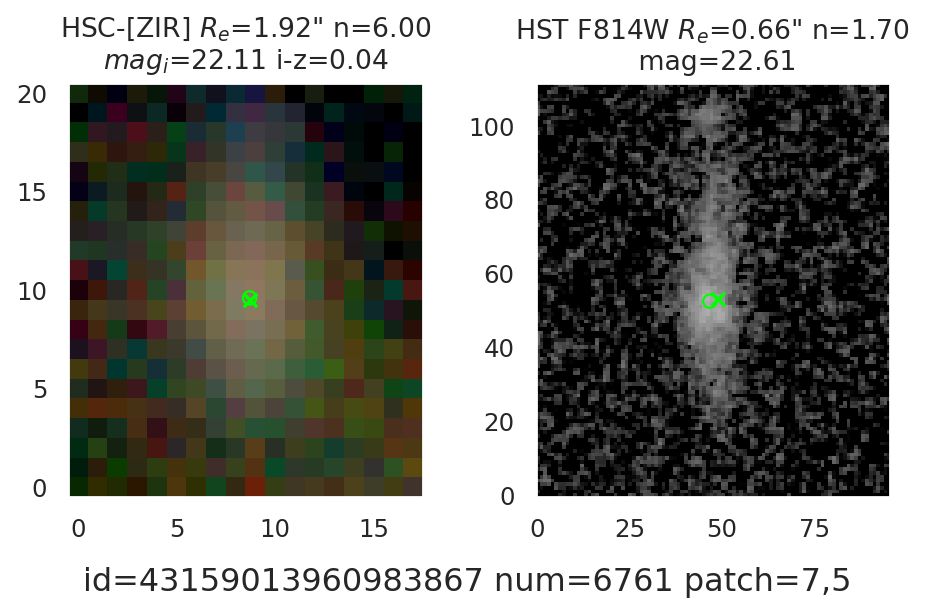

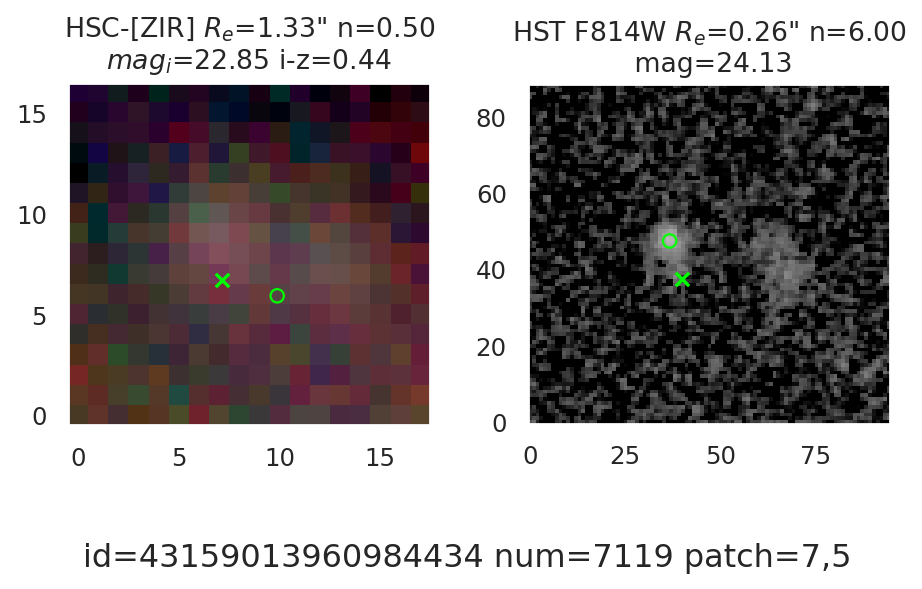

In [19]:
# Plot HSC and HST images of discrepant models
sns.set_style("darkgrid", {'axes.grid' : False})
band = 'HSC-I'
scale_hst2hsc = 0.168/0.03
for idx_row in row_big:
    row = cat[idx_row]
    id_src = row['id']
    row_offset_idx = np.argmax(patch_rows>=idx_row)
    name_patch = patches[row_offset_idx]
    row_patch = int(idx_row - (0 if row_offset_idx == 0 else patch_rows[row_offset_idx-1]))
    # This doesn't always agree - not sure if that's because patches overlap?
    # patch = skymap.findPatch(SpherePoint(row['coord_ra'], row['coord_dec'], radians)).getIndex()
    if name_patch not in meas:
        meas[name_patch] = butler.get('deepCoadd_meas', {'filter': 'HSC-I', 'tract': tract, 'patch': name_patch})
    src = meas[name_patch][row_patch]
    if name_patch not in calexps:
        calexps[name_patch] = {band: butler.get('deepCoadd_calexp', {'filter': band, 'tract': tract, 'patch': name_patch}) for band in bands}
    calexps_patch = calexps[name_patch]
    wcs = calexps_patch['HSC-I'].getWcs()
    bbox = src.getFootprint().getBBox()
    cenx, ceny = src.getCentroid() - bbox.getBegin()
    radec = [[y for y in wcs.pixelToSky(Point2D(x)).getPosition(degrees)] for x in bbox.getCorners()]
    img = get_exposure_cutout_HST(radec, (0, 0), exposures_hst)[0]
    fig, axes = plt.subplots(ncols=2)
    axes[0].imshow(make_lupton_rgb(*[x.image.subset(bbox).array for x in calexps_patch.values()], stretch=0.4, Q=8))
    axes[0].set_title(f'HSC-[ZIR] $R_{{e}}$={data_hsc["reff_1"][idx_row]*0.168:.2f}" n={data_hsc["nser_1"][idx_row]:.2f}\n'
                      f'$mag_i$={data_hsc["mag_1"][idx_row]:.2f} i-z={data_hsc["mag_1"][idx_row] - data_hsc["mag_z_1"][idx_row]:.2f}')
    fluxratio = data_hst["flux_1"][idx_row]/(data_hsc["flux_1"][idx_row] + data_hsc["flux_z_1"][idx_row])
    mag_hst = data_hsc["mag_1"][idx_row] - 2.5*(np.log10(fluxratio) + 0.88)
    axes[0].scatter(cenx, ceny, marker='x', color='lime')
    axes[0].scatter(data_hsc["cenx_1"][idx_row]-0.5, data_hsc["ceny_1"][idx_row]-0.5, marker='o', color='lime', facecolors='none')
    axes[1].imshow(make_lupton_rgb(img.image,img.image, img.image, stretch=0.01, Q=6))
    axes[1].set_title(f'HST F814W $R_{{e}}$={data_hst["reff_1"][idx_row]*0.03:.2f}" '
                      f'n={data_hst["nser_1"][idx_row]:.2f}\n mag={mag_hst:.2f}')
    axes[1].scatter(cenx*scale_hst2hsc, ceny*scale_hst2hsc, marker='x', color='lime')
    axes[1].scatter(data_hst["cenx_1"][idx_row]-0.5, data_hst["ceny_1"][idx_row]-0.5, marker='o', color='lime', facecolors='none')
    plt.suptitle(f'id={id_src} num={row_patch} patch={name_patch}', y=0.05)
    plt.tight_layout()
    plt.show(block=False)
sns.set_style("darkgrid", {'axes.grid' : True})